# IMPORTING LIBRARIES

In [1]:
import pandas as pd
pd.options.display.max_columns = None
pd.options.display.float_format = '{:.2f}'.format
import numpy as np
from pathlib import Path
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import cm as cmaps
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import datetime as dt
from dateutil.relativedelta import relativedelta
from collections import Counter, OrderedDict
import itertools
import re

print("Packages loaded!")

Packages loaded!


# Pipeline Controller

hk_df=load_original_data() 
hk_df=lower_case_column_names(hk_df)
##hk_df=rename_columns(hk_df)
#hk_df=drop_columns(hk_df)

hk_df=load_original_data() 

hk_df= (hk_df.pipe(lower_case_column_names)\
.pipe(rename_columns)
 #.pipe(drop_columns)

)

# READ DATA INTO DATAFRAME FROM EXISTING .CSV

In [2]:
def load_original_data():
    """
    Read most recent .csv file from path. Parse data into pandas dataframe.
    """
    
    #pathstring = r"C:\Users\p.kollhof\Documents\Paul Kollhof\03 Database\DB_Analysis\Last_40k_20-11-18.csv"
    #list_of_files = glob.glob(r'\\debe-srv-fs\userhome-debe\p.kollhof\03 Database\DB_Analysis\\*.csv') # * means all if need specific format then *.csv
    list_of_files = glob.glob(r"\\debe-srv-fs\userhome-debe\p.kollhof\03 Database\DB_Analysis\*.csv") # * means all if need specific format then *.csv
    latest_file = max(list_of_files, key=os.path.getctime)
    df_DB_DataWhole = pd.read_csv(latest_file, sep=";", encoding = "ISO-8859-1")
    
    return df_DB_DataWhole

df_DB_DataWhole = load_original_data()

# DF CLEANING

## Delete unncessary/empty colums

In [3]:
def delete_unncessary_columns(df):
    """
    Delete columns only containing NaN values or columns with effectively useless data
    """
    #try:
    cols_to_drop = []
    if any(df_DB_DataWhole.columns.str.contains("WT1")):
        cols_to_drop = [col for col in df_DB_DataWhole.columns if "WT1" in col]
    if any(df_DB_DataWhole.columns.str.contains("WT2")):
        cols_to_drop_2 = [col for col in df_DB_DataWhole.columns if "WT2" in col]
        cols_to_drop.extend(cols_to_drop_2)
    if any(df_DB_DataWhole.columns.str.contains("ET2")):
        cols_to_drop_3 = [col for col in df_DB_DataWhole.columns if "ET2" in col]
        cols_to_drop.extend(cols_to_drop_3)
    if any(df_DB_DataWhole.columns.str.contains("FT2")):
        cols_to_drop_4 = [col for col in df_DB_DataWhole.columns if "FT2" in col]
        cols_to_drop.extend(cols_to_drop_4)
    else:
        raise ValueError("XT1/2 columns have already been deleted!")

    cols_to_drop.extend(["Versand_Intern", "SSMA_TimeStamp", "Assembley_Teflonschlauch-Charge"])
    df.drop(cols_to_drop, axis=1, inplace=True)

    #except:
        #raise ValueError("Deleting columns was unsuccessful!")
    
    return df

df_cleaned = delete_unncessary_columns(df_DB_DataWhole)

## Remove rows with XDC-ID < `68.000`

In [4]:
def delete_rows_with_XDC_ID_pre_68k(df):
    """
    Delete all entries before XDC-ID 68.000 due to them having wrong defect IDs.
    Only applies if dataframe actually has older entries with XDC-IDs < 68.000
    """
    
    df = df[df["PDC_Nummer"]>=68000]
    
    return df

df_cleaned = delete_rows_with_XDC_ID_pre_68k(df_cleaned)

## Cast `string-dates` into `datetime-dates`

In [5]:
def date_columns_transform_into_datetime(df):
    """
    Transform all dates of string type 'YYYY-MM-DD' into dt.datetime format.
    """
    date_cols = [col for col in df.columns if "Datum" in col]

    for col in date_cols:
        if df[col].dtype == "object":
            df[col] = [dt.datetime.strptime(d,'%Y-%m-%d').date() if type(d)==str 
                       else np.nan if type(d)==float
                       else d
                       for d in df[col]]
            
    return df, date_cols

df_cleaned, date_columns = date_columns_transform_into_datetime(df_cleaned)

## Remove rows without entries in selected columns

In [6]:
def delete_rows_with_nan_in_selected_cols(df, cols):
    """
    Delete rows that do not have an entry in the given columns
    """
    for col in cols:
        df[col].dropna(inplace=True)
        df.reset_index(drop=True, inplace=True)
        
    return df
    
df_cleaned = delete_rows_with_nan_in_selected_cols(df_cleaned, ["Schmelzen_Datum", "NS1_Datum"])

## Substitute `Familie` int-values with strings *("PDC", "PDC-C", "XDC")*

In [7]:
def substitute_familie_int_str(df):
    """
    Parse int values (1,2,3) into string values ("PDC", "PDC-C", "XDC")
    """
    
    if df["Familie"].dtype == "int64":
        df["Familie"] = ["PDC" if fam==1
                         else "PDC-C" if fam==2
                         else "XDC" 
                         for fam in df_cleaned["Familie"]]
        
    return df

df_cleaned = substitute_familie_int_str(df_cleaned)

## Insert lot numbers into dataframe

In [8]:
def insert_lot_numbers(df):
    """
    Calculate nozzle lot number based on nozzle ID.
    Insert "Charge" column next to "PDC_Nummer".
    """
    if "Charge" not in df.columns:
        NozChargeList = [int(np.floor((df["PDC_Nummer"][num]-2145)/20)) for num in range(len(df["PDC_Nummer"]))]
        NozChargeListSet = sorted(list(set(NozChargeList)))
        df.insert(1, "Charge", NozChargeList)
    else:
        raise ValueError("<Charge> column has already been inserted!")
    
    return df, NozChargeListSet

df_cleaned, Nozzle_Chargen_List = insert_lot_numbers(df_cleaned)

## Create `_Months` columns

In [9]:
def add_date_month_string_columns(df):
    """
    Convert YYYY-MM-DD dt.datetime into new 'YYYY-MM' string month column. 
    """
    
    unwanted_dates = ['TS_in_Datum', 'TS_out_Datum', 'RT_BQC_in_Datum', 'RT_BQC_out_Datum']
    date_columns_wanted = [col for col in date_columns if col not in unwanted_dates]
    date_columns_months = [col.split("_")[0] for col in date_columns_wanted]
    date_columns_months = [col + "_Month" for col in date_columns_months]
    
    #if "Schmelzen_Months" in df.columns:
    for idx, datum in enumerate(date_columns_wanted):
        df[date_columns_months[idx]] = [str(d)[:-3] for d in df[datum]]
    #else:
        #raise ValueError("Months columns have already been added!")
    return df

df_cleaned = add_date_month_string_columns(df_cleaned)

In [18]:
df_cleaned.columns

Index(['PDC_Nummer', 'Charge', 'Produktion_Groesse', 'Familie', 'Art',
       'Kommentar_Produktion', 'Grenzwert-Set', 'Defekt_Arbeitsschritt_ID',
       'Defekt_Grund_ID', 'Schmelzen_Personal',
       ...
       'OeO_Month', 'Kleben1_Month', 'Kleben2_Month', 'Assembley_Month',
       'Uebergabe_Month', 'BQC_Month', 'ET1_Month', 'FT1_Month', 'EK_Month',
       'Versand_Month'],
      dtype='object', length=154)

In [17]:
df_cleaned['NS1_Winkel_vorne']=pd.to_numeric(df_cleaned['NS1_Winkel_vorne'])
df_cleaned['NS1_Winkel_hinten']=pd.to_numeric(df_cleaned['NS1_Winkel_hinten'])

df_cleaned['NS2_Center_Variation']=pd.to_numeric(df_cleaned['NS2_Center_Variation'])
df_cleaned['NS2_Front_Angle']=pd.to_numeric(df_cleaned['NS2_Front_Angle'])
df_cleaned['NS2_Curve']=pd.to_numeric(df_cleaned['NS2_Curve'])
df_cleaned['NS2_15xLength']=pd.to_numeric(df_cleaned['NS2_15xLength'])
df_cleaned['NS2_Parabolic_Factor']=pd.to_numeric(df_cleaned['NS2_Parabolic_Factor'])

df_cleaned['OeO_OeO']=pd.to_numeric(df_cleaned['OeO_OeO'])

ValueError: Unable to parse string "8,8" at position 423

In [16]:
df_cleaned.iloc[:,:50].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89122 entries, 0 to 89121
Data columns (total 50 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   PDC_Nummer                   89122 non-null  int64  
 1   Charge                       89122 non-null  int64  
 2   Produktion_Groesse           89122 non-null  float64
 3   Familie                      89122 non-null  object 
 4   Art                          89122 non-null  int64  
 5   Kommentar_Produktion         47530 non-null  object 
 6   Grenzwert-Set                89122 non-null  int64  
 7   Defekt_Arbeitsschritt_ID     89097 non-null  float64
 8   Defekt_Grund_ID              89102 non-null  float64
 9   Schmelzen_Personal           89122 non-null  object 
 10  Schmelzen_Datum              89122 non-null  object 
 11  Schmelzen_Ort                89118 non-null  object 
 12  Schmelzen_Geraet             89118 non-null  float64
 13  Schmelzen_Kapill

In [11]:
df_numerical.columns

Index(['PDC_Nummer', 'Charge', 'Produktion_Groesse', 'Art', 'Grenzwert-Set',
       'Defekt_Arbeitsschritt_ID', 'Defekt_Grund_ID', 'Schmelzen_Geraet',
       'Schmelzen_Kapillaren-Charge', 'NS1_Geraet', 'Schneiden_Ort',
       'Schneiden_Geraet', 'Schleifen_Ort', 'Schleifen_Geraet', 'NS2_Geraet',
       'OeO_Geraet', 'Kleben1_Kleber-Charge', 'Kleben1_Kleber-Teilentnahme',
       'Kleben1_Piezzo-Charge', 'Kleben2_Kleber-Charge',
       'Kleben2_Kleber-Teilentnahme', 'Kleben2_Huelse1-Charge',
       'Kleben2_Isolator-Charge', 'Kleben2_Huelse2-Charge',
       'Assembley_Huelse3-Charge', 'Dose', 'BQC_Spannung', 'BQC_Puls',
       'BQC_Volumen', 'BQC_Auslenkung', 'BQC_z-Offset', 'ET1_Spannung',
       'ET1_Puls', 'ET1_Volumen', 'ET1_Auslenkung', 'ET1_z-Offset',
       'ET1_KopfID', 'ET1_Kanal', 'Coatingtyp', 'FT1_Typ', 'FT1_Spannung',
       'FT1_Puls', 'FT1_Volumen', 'FT1_Auslenkung', 'FT1_z-Offset',
       'FT1_KopfID', 'FT1_Kanal', 'EK_Spannung', 'EK_Puls', 'EK_Volumen',
       'EK_Ausle

In [12]:
df_numerical = df_cleaned.select_dtypes(exclude=['object'])
df_categorical = df_cleaned.select_dtypes(include=['object'])

In [13]:
regex = re.compile('[a-zA-Z]')

In [21]:
FT_OP_List = list(df_cleaned["FT1_Personal"])
oplist = set(FT_OP_List)
oplist

{'?',
 'AC',
 'AL',
 'AT',
 'DC',
 'FF',
 'FF, BR',
 'FH',
 'GD',
 'GDH',
 'LE',
 'Le',
 'MB',
 'MF',
 'MFE',
 'MFe',
 'MS',
 'Mfe',
 'RC',
 'SC',
 'SC, BR',
 'SFZ',
 'ff',
 'fh',
 'le',
 nan,
 'sc'}

In [29]:
[op.split(",")[0].upper() for op in oplist if type(op)==str if op.isalpha()]

['GDH',
 'RC',
 'MF',
 'MS',
 'FH',
 'DC',
 'FF',
 'FH',
 'MFE',
 'SC',
 'GD',
 'AC',
 'SFZ',
 'MB',
 'LE',
 'AL',
 'LE',
 'AT',
 'MFE',
 'SC',
 'LE',
 'MFE',
 'FF']

In [20]:
''.join(word if word.isalpha()
        else np.nan
        for word in FT_OP_List) 
#if type(word)==str else np.nan for word in FT_OP_List 

AttributeError: 'float' object has no attribute 'isalpha'

In [ ]:
FT_OP_List_ = []
for ftop in range(len(FT_OP_List)):
    if FT_OP_List[ftop] == "MF":
        FT_OP_List_.append("MFE")
    elif FT_OP_List[ftop] == "SC_":
        FT_OP_List_.append("SC")
    elif FT_OP_List[ftop] == 0 or type(FT_OP_List[ftop])==float:
        FT_OP_List_.append(np.nan)
    elif FT_OP_List[ftop].isupper():
        FT_OP_List_.append(FT_OP_List[ftop][:3])
    elif not FT_OP_List[ftop].isupper():
        FT_OP_List_.append(FT_OP_List[ftop][:3].upper())
    elif type(FT_OP_List[ftop])!=float:
        FT_OP_List_.append(re.sub(r'[^\w]', '', FT_OP_List[ftop]))
        FT_OP_List_.append(''.join(i for i in FT_OP_List[ftop] if not i.isdigit()))

In [2]:


##############################################
### FOLDER & PATH CREATION FOR DATA SAVING ###

### CREATE FOLDERS
Subfolder_Names = ["Scraps", "Bonding_Assembly", 
                   "OP_ThruPut_General", "OP_ThruPut_Melting", "MD_ThruPut_Melting", "FH"]
try:
    os.makedirs('Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\")
    for subfolder in Subfolder_Names:
        os.makedirs('Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\" + subfolder)
except FileExistsError:
    pass

### CREATE PATH
savePath = os.getcwd() + "\\" + 'Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\"
savePath_Scrap = os.getcwd() + "\\" + 'Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\" + "Scraps" + "\\"
savePath_BondAss = os.getcwd() + "\\" + 'Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\" + "Bonding_Assembly" + "\\"
savePath_OP_TP_General = os.getcwd() + "\\" + 'Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\" + "OP_ThruPut_General" + "\\"
savePath_OP_TP_Melt = os.getcwd() + "\\" + 'Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\" + "OP_ThruPut_Melting" + "\\"
savePath_MD_TP_Melt = os.getcwd() + "\\" + 'Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\" + "MD_ThruPut_Melting" + "\\"

savePath_FH = os.getcwd() + "\\" + 'Data_created_' + dt.datetime.now().strftime("%y-%m-%d") + "_PROD" + "\\" + "FH5" + "\\"

### FOLDER & PATH CREATION FOR DATA SAVING ###
##############################################


### COLOR SCHEMES FOR PLOTS
cmap_PDC_Sizes = ["grey", "gold", "orange", "red", "green", "mediumblue", "darkviolet"]
cmap_Coating_Types = ["grey", "gold", "red", "green", "mediumblue"]
cmap_fQC_Types = ["grey", "silver", "red", "green", "mediumblue"]
cmap_QC_Types = ["grey", "red", "green", "mediumblue"]
cmap_OPs = ["orangered", "forestgreen", "deepskyblue", "orange", "cyan", "fuchsia", "dimgrey"]

###########################################
### PROCESS STEP DATA HANDLING - MONTHS ###


### UPDATE DATAFRAME OPERATORS WITH CAPITALIZATION & SINGLE-OP ###
Schmelzen_OP_List = list(df_DB_trunc["Schmelzen_Personal"])
Schneiden_OP_List = list(df_DB_trunc["Schneiden_Personal"])
NS1_OP_List = list(df_DB_trunc["NS1_Personal"])
Schleifen_OP_List = list(df_DB_trunc["Schleifen_Personal"])
NS2_OP_List = list(df_DB_trunc["NS2_Personal"])
OeO_OP_List = list(df_DB_trunc["OeO_Personal"])
K1_OP_List = list(df_DB_trunc["Kleben1_Personal"])
K2_OP_List = list(df_DB_trunc["Kleben2_Personal"])
Ass_OP_List = list(df_DB_trunc["Assembley_Personal"])
BQC_OP_List = list(df_DB_trunc["BQC_Personal"])
ET_OP_List = list(df_DB_trunc["ET1_Personal"])
FT_OP_List = list(df_DB_trunc["FT1_Personal"])
EK_OP_List = list(df_DB_trunc["EK_Personal"])

for schmop in range(len(Schmelzen_OP_List)):
    if Schmelzen_OP_List[schmop] == 0 or type(Schmelzen_OP_List[schmop])==float:
        pass
    elif Schmelzen_OP_List[schmop].isupper():
        Schmelzen_OP_List[schmop] = Schmelzen_OP_List[schmop][:2]
    elif not Schmelzen_OP_List[schmop].isupper():
        Schmelzen_OP_List[schmop] = Schmelzen_OP_List[schmop][:2].upper()

for schnop in range(len(Schneiden_OP_List)):
    if Schneiden_OP_List[schnop] == 0 or type(Schneiden_OP_List[schnop])==float:
        pass
    elif Schneiden_OP_List[schnop].isupper():
        Schneiden_OP_List[schnop] = Schneiden_OP_List[schnop][:2]
    elif not Schneiden_OP_List[schnop].isupper():
        Schneiden_OP_List[schnop] = Schneiden_OP_List[schnop][:2].upper()
        
for ns1op in range(len(NS1_OP_List)):
    if NS1_OP_List[ns1op] == 0 or type(NS1_OP_List[ns1op])==float:
        pass
    elif NS1_OP_List[ns1op].isupper():
        NS1_OP_List[ns1op] = NS1_OP_List[ns1op][:2]
    elif not NS1_OP_List[ns1op].isupper():
        NS1_OP_List[ns1op] = NS1_OP_List[ns1op][:2].upper()

for ns2op in range(len(NS2_OP_List)):
    if NS2_OP_List[ns2op] == 0 or type(NS2_OP_List[ns2op])==float:
        pass
    elif NS2_OP_List[ns2op].isupper():
        NS2_OP_List[ns2op] = NS2_OP_List[ns2op][:2]
    elif not NS2_OP_List[ns2op].isupper():
        NS2_OP_List[ns2op] = NS2_OP_List[ns2op][:2].upper()

for oeoop in range(len(OeO_OP_List)):
    if OeO_OP_List[oeoop] == 0 or type(OeO_OP_List[oeoop])==float:
        pass
    elif OeO_OP_List[oeoop].isupper():
        OeO_OP_List[oeoop] = OeO_OP_List[oeoop][:2]
    elif not OeO_OP_List[oeoop].isupper():
        OeO_OP_List[oeoop] = OeO_OP_List[oeoop][:2].upper()

for k1op in range(len(K1_OP_List)):
    if K1_OP_List[k1op] == 0 or type(K1_OP_List[k1op])==float:
        pass
    elif K1_OP_List[k1op].isupper():
        K1_OP_List[k1op] = K1_OP_List[k1op][:2]
    elif not K1_OP_List[k1op].isupper():
        K1_OP_List[k1op] = K1_OP_List[k1op][:2].upper()
        
for k2op in range(len(K2_OP_List)):
    if K2_OP_List[k2op] == 0 or type(K2_OP_List[k2op])==float:
        pass
    elif K2_OP_List[k2op].isupper():
        K2_OP_List[k2op] = K2_OP_List[k2op][:2]
    elif not K2_OP_List[k2op].isupper():
        K2_OP_List[k2op] = K2_OP_List[k2op][:2].upper()
        
for assop in range(len(Ass_OP_List)):
    if Ass_OP_List[assop] == 0 or type(Ass_OP_List[assop])==float:
        pass
    elif Ass_OP_List[assop].isupper():
        Ass_OP_List[assop] = Ass_OP_List[assop][:2]
    elif not Ass_OP_List[assop].isupper():
        Ass_OP_List[assop] = Ass_OP_List[assop][:2].upper()
        
for bqcop in range(len(BQC_OP_List)):
    if BQC_OP_List[bqcop] == 0 or type(BQC_OP_List[bqcop])==float:
        pass
    elif BQC_OP_List[bqcop].isupper():
        BQC_OP_List[bqcop] = BQC_OP_List[bqcop][:3]
    elif not BQC_OP_List[bqcop].isupper():
        BQC_OP_List[bqcop] = BQC_OP_List[bqcop][:3].upper()
        
for etop in range(len(ET_OP_List)):
    if ET_OP_List[etop] == "MF":
        ET_OP_List[etop]=="MFE"
    if ET_OP_List[etop] == 0 or type(ET_OP_List[etop])==float:
        pass
    elif ET_OP_List[etop].isupper():
        ET_OP_List[etop] = ET_OP_List[etop][:3]
    elif not ET_OP_List[etop].isupper():
        ET_OP_List[etop] = ET_OP_List[etop][:3].upper()
    if type(ET_OP_List[etop])!=float:
        ET_OP_List[etop] = re.sub(r'[^\w]', '', ET_OP_List[etop])
        ET_OP_List[etop] = ''.join(i for i in ET_OP_List[etop] if not i.isdigit())

FT_OP_List_ = []
for ftop in range(len(FT_OP_List)):
    if FT_OP_List[ftop] == "MF":
        FT_OP_List_.append("MFE")
    elif FT_OP_List[ftop] == "SC_":
        FT_OP_List_.append("SC")
    elif FT_OP_List[ftop] == 0 or type(FT_OP_List[ftop])==float:
        FT_OP_List_.append(np.nan)
    elif FT_OP_List[ftop].isupper():
        FT_OP_List_.append(FT_OP_List[ftop][:3])
    elif not FT_OP_List[ftop].isupper():
        FT_OP_List_.append(FT_OP_List[ftop][:3].upper())
    elif type(FT_OP_List[ftop])!=float:
        FT_OP_List_.append(re.sub(r'[^\w]', '', FT_OP_List[ftop]))
        FT_OP_List_.append(''.join(i for i in FT_OP_List[ftop] if not i.isdigit()))
        
for ekop in range(len(EK_OP_List)):
    if EK_OP_List[ekop] == "MF":
        EK_OP_List[ekop]=="MFE"
    if EK_OP_List[ekop] == 0 or type(EK_OP_List[ekop])==float:
        pass
    elif EK_OP_List[ekop].isupper():
        EK_OP_List[ekop] = EK_OP_List[ekop][:3]
    elif not EK_OP_List[ekop].isupper():
        EK_OP_List[ekop] = EK_OP_List[ekop][:3].upper()
    if type(EK_OP_List[ekop])!=float:
        EK_OP_List[ekop] = re.sub(r'[^\w]', '', EK_OP_List[ekop])
        EK_OP_List[ekop] = ''.join(i for i in EK_OP_List[ekop] if not i.isdigit())

df_DB_trunc["Schmelzen_Personal"] = Schmelzen_OP_List
df_DB_trunc["Schneiden_Personal"] = Schneiden_OP_List
df_DB_trunc["NS1_Personal"] = NS1_OP_List
df_DB_trunc["NS2_Personal"] = NS2_OP_List
df_DB_trunc["OeO_Personal"] = OeO_OP_List
df_DB_trunc["Kleben1_Personal"] = K1_OP_List
df_DB_trunc["Kleben2_Personal"] = K2_OP_List
df_DB_trunc["Assembley_Personal"] = Ass_OP_List
df_DB_trunc["BQC_Personal"] = BQC_OP_List
df_DB_trunc["ET1_Personal"] = ET_OP_List
df_DB_trunc["FT1_Personal"] = FT_OP_List
df_DB_trunc["EK_Personal"] = EK_OP_List

### CREATE LISTS OF UNIQUE OPs FOR EACH PROCESS STEP ###
Schmelzen_OP_List_Set = sorted([schmop for schmop in list(set(Schmelzen_OP_List)) if type(schmop)==str if len(schmop) > 1 if len(schmop) <= 3 if "#" not in schmop if "." not in schmop])
Schneiden_OP_List_Set = sorted([schnop for schnop in list(set(Schneiden_OP_List)) if type(schnop)==str if len(schnop) > 1 if len(schnop) <= 3 if "#" not in schnop if "." not in schnop])
NS1_OP_List_Set = sorted([ns1op for ns1op in list(set(NS1_OP_List)) if type(ns1op)==str if len(ns1op) > 1 if len(ns1op) <= 3 if "#" not in ns1op if "." not in ns1op])
Schleifen_OP_List_Set = sorted([schlop for schlop in list(set(Schleifen_OP_List)) if type(schlop)==str if len(schlop) > 1 if len(schlop) <= 3 if "#" not in schlop if "." not in schlop])
NS2_OP_List_Set = sorted([ns2op for ns2op in list(set(NS2_OP_List)) if type(ns2op)==str if len(ns2op) > 1 if len(ns2op) <= 3 if "#" not in ns2op if "." not in ns2op])
OeO_OP_List_Set = sorted([oeoop for oeoop in list(set(OeO_OP_List)) if type(oeoop)==str if len(oeoop) > 1 if len(oeoop) <= 3 if "#" not in oeoop if "." not in oeoop])
K1_OP_List_Set = sorted([k1op for k1op in list(set(K1_OP_List)) if type(k1op)==str if len(k1op) > 1 if len(k1op) <= 3 if "#" not in k1op if "." not in k1op])
K2_OP_List_Set = sorted([k2op for k2op in list(set(K2_OP_List)) if type(k2op)==str if len(k2op) > 1 if len(k2op) <= 3 if "#" not in k2op if "." not in k2op])
Ass_OP_List_Set = sorted([assop for assop in list(set(Ass_OP_List)) if type(assop)==str if len(assop) > 1 if len(assop) <= 3 if "#" not in assop if "." not in assop])
BQC_OP_List_Set = sorted([bqcop for bqcop in list(set(BQC_OP_List)) if type(bqcop)==str if len(bqcop) > 1 if "#" not in bqcop if "." not in bqcop])
ET_OP_List_Set = sorted([etop for etop in list(set(ET_OP_List)) if type(etop)==str if len(etop) > 1 if "#" not in etop if "." not in etop])
FT_OP_List_Set = sorted([ftop for ftop in list(set(FT_OP_List_)) if type(ftop)==str if len(ftop) > 1 if "#" not in ftop if "." not in ftop if "_" not in ftop if "?" not in ftop])
EK_OP_List_Set = sorted([ekop for ekop in list(set(EK_OP_List)) if type(ekop)==str if len(ekop) > 1 if "#" not in ekop if "." not in ekop])

### CREATE LIST OF OVERALL UNIQUE OPERATORS
OPs_All_List = [Schmelzen_OP_List_Set, Schneiden_OP_List_Set, NS1_OP_List_Set, 
                Schleifen_OP_List_Set, NS2_OP_List_Set, OeO_OP_List_Set, K1_OP_List_Set, 
                K2_OP_List_Set, Ass_OP_List_Set, BQC_OP_List_Set]
OPs_All_List = sorted(list(set(list(itertools.chain(*OPs_All_List)))))



### TRANSFORM STRING-COMMA-VALUES TO DOT-FLOAT-VALUES ###
NS1VV_StrCommaVal_List = list(df_DB_trunc["NS1_Durchmesser_vorne"])
NS1VV_FloatDotVal_List = []
for ns1vv in NS1VV_StrCommaVal_List:
    if type(ns1vv) == float:
        NS1VV_FloatDotVal_List.append(0)
    elif type(ns1vv) == str:
        ns1vv = ns1vv.replace(',', '.')
        NS1VV_FloatDotVal_List.append(float(ns1vv))
df_DB_trunc["NS1_Durchmesser_vorne"] = NS1VV_FloatDotVal_List

NS1VH_StrCommaVal_List = list(df_DB_trunc["NS1_Durchmesser_hinten"])
NS1VH_FloatDotVal_List = []
for ns1vh in NS1VH_StrCommaVal_List:
    if type(ns1vh) == float:
        NS1VH_FloatDotVal_List.append(0)
    elif type(ns1vh) == str:
        ns1vh = ns1vh.replace(',', '.')
        NS1VH_FloatDotVal_List.append(float(ns1vh))
df_DB_trunc["NS1_Durchmesser_hinten"] = NS1VH_FloatDotVal_List

NS2PF_StrCommaVal_List = list(df_DB_trunc["NS2_Parabolic_Factor"])
NS2PF_FloatDotVal_List = []
for ns2pf in NS2PF_StrCommaVal_List:
    if type(ns2pf) == float:
        NS2PF_FloatDotVal_List.append(0)
    elif type(ns2pf) == str:
        ns2pf = ns2pf.replace(',', '.')
        NS2PF_FloatDotVal_List.append(float(ns2pf))
df_DB_trunc["NS2_Parabolic_Factor"] = NS2PF_FloatDotVal_List

NS215x_StrCommaVal_List = list(df_DB_trunc["NS2_15xLength"])
NS215x_FloatDotVal_List = []
for ns215x in NS215x_StrCommaVal_List:
    if type(ns215x) == float:
        NS215x_FloatDotVal_List.append(0)
    elif type(ns215x) == str:
        ns215x = ns215x.replace(',', '.')
        NS215x_FloatDotVal_List.append(float(ns215x))
df_DB_trunc["NS2_15xLength"] = NS215x_FloatDotVal_List

NS2CV_StrCommaVal_List = list(df_DB_trunc["NS2_Center_Variation"])
NS2CV_FloatDotVal_List = []
for ns2cv in NS2CV_StrCommaVal_List:
    if type(ns2cv) == float:
        NS2CV_FloatDotVal_List.append(0)
    elif type(ns2cv) == str:
        ns2cv = ns2cv.replace(',', '.')
        NS2CV_FloatDotVal_List.append(float(ns2cv))
df_DB_trunc["NS2_Center_Variation"] = NS2CV_FloatDotVal_List

NS2FA_StrCommaVal_List = list(df_DB_trunc["NS2_Front_Angle"])
NS2FA_FloatDotVal_List = []
for ns2fa in NS2FA_StrCommaVal_List:
    if type(ns2fa) == float:
        NS2FA_FloatDotVal_List.append(0)
    elif type(ns2fa) == str:
        ns2fa = ns2fa.replace(',', '.')
        NS2FA_FloatDotVal_List.append(float(ns2fa))
df_DB_trunc["NS2_Front_Angle"] = NS2FA_FloatDotVal_List

OeO_StrCommaVal_List = list(df_DB_trunc["OeO_OeO"])
OeO_FloatDotVal_List = []
for oeo in OeO_StrCommaVal_List:
    if type(oeo) == float:
        OeO_FloatDotVal_List.append(0)
    elif type(oeo) == str:
        oeo = oeo.replace(',', '.')
        OeO_FloatDotVal_List.append(float(oeo))
df_DB_trunc["OeO_OeO"] = OeO_FloatDotVal_List

### SORT GENERAL DATA BY PRODUCTION SITE ###
df_DB_Dortmund = df_DB_trunc[df_DB_trunc["Schmelzen_Ort"]=="Dortmund"].reset_index(drop=True)
df_DB_Berlin = df_DB_trunc[df_DB_trunc["Schmelzen_Ort"]=="Berlin"].reset_index(drop=True)

print("Dataframe loaded!")

Dataframe loaded!


In [3]:
### DETERMINE TIMEFRAME TO PLOT ###
LastNMonths = []
TimeFrame = int(input("die letzten X Monate: "))
TimeFrame = list(range(0,TimeFrame,1))
for l in TimeFrame:
    last_month = dt.datetime.now() - relativedelta(months=l)
    last_month_ = format(last_month, '%Y-%m')
    LastNMonths.append(last_month_)
    
LastNMonths = LastNMonths[::-1]
LastNMonths = LastNMonths[:-1]
LastNMonths

die letzten X Monate:  7


['2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07']

In [9]:
"""
- show glass scrap timeline for different glass lots
    - in capillary production (Schmelzen - ÖO)
    - in nozzle production (K1 - Ass)
    - in QC steps (BQC - FQC; no EK due to delay)
"""

GlasLot_Set = sorted(list(set(df_DB_trunc["Schmelzen_Kapillaren-Charge"])))

Glas_Lot_List = [[GlasLot_Set[n]]*len(LastNMonths) for n in range(len(GlasLot_Set))]
Glas_Lot_List_flat = [val for sublist in Glas_Lot_List for val in sublist]

# Capillary production
df_Cap_Melt = df_DB_trunc[pd.DataFrame(df_DB_trunc["Schmelzen_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Cap_NS1 = df_DB_trunc[pd.DataFrame(df_DB_trunc["NS1_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Cap_Cut = df_DB_trunc[pd.DataFrame(df_DB_trunc["Schneiden_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Cap_Schleif = df_DB_trunc[pd.DataFrame(df_DB_trunc["Schleifen_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Cap_NS2 = df_DB_trunc[pd.DataFrame(df_DB_trunc["NS2_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Cap_OeO = df_DB_trunc[pd.DataFrame(df_DB_trunc["OeO_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
# Nozzle production
df_Noz_K1 = df_DB_trunc[pd.DataFrame(df_DB_trunc["K1_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Noz_K2 = df_DB_trunc[pd.DataFrame(df_DB_trunc["K2_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Noz_Ass = df_DB_trunc[pd.DataFrame(df_DB_trunc["Ass_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
# Nozzle QC
df_Noz_BQC = df_DB_trunc[pd.DataFrame(df_DB_trunc["BQC_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Noz_ET = df_DB_trunc[pd.DataFrame(df_DB_trunc["ET_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Noz_FQC = df_DB_trunc[pd.DataFrame(df_DB_trunc["FT_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)

df_test = pd.DataFrame()
df_test["Month"] = LastNMonths * len(GlasLot_Set)
df_test["Glas_Lot"] = Glas_Lot_List_flat
df_test["Schleif_Thruput"] = Schleif_GL_Thruput_List
df_test["Schleif_Scrap[%]"] = Schleif_GL_Scrap_List
df_test

NameError: name 'Schleif_GL_Thruput_List' is not defined

In [ ]:
Schleif_GL_Thruput_List = []
Schleif_GL_Scrap_List = []

for d in range(len(LastNMonths)):
    for lot in GlasLot_Set:
        Schleif_GL_Counter = df_Cap_Schleif[(df_Cap_Schleif["Schleifen_Month"]==LastNMonths[d]) &
                            (df_Cap_Schleif["Schmelzen_Kapillaren-Charge"]==lot)]
        Schleif_GL_Thruput_List.append(len(Schleif_GL_Counter))
        
        Schleif_GL_Scrap_Counter = Schleif_GL_Counter[(Schleif_GL_Counter["Defekt_Arbeitsschritt_ID"]==5) &
                                             ((Schleif_GL_Counter["Defekt_Grund_ID"]==2) |
                                              (Schleif_GL_Counter["Defekt_Grund_ID"]==3) |
                                              (Schleif_GL_Counter["Defekt_Grund_ID"]==5) |
                                              (Schleif_GL_Counter["Defekt_Grund_ID"]==26) |
                                              (Schleif_GL_Counter["Defekt_Grund_ID"]==31))].reset_index(drop=True)
        if len(Schleif_GL_Counter) != 0:
            Schleif_GL_ScrapRate_Counter = np.around(
                (len(Schleif_GL_Scrap_Counter)/len(Schleif_GL_Counter))*100,1)
            Schleif_GL_Scrap_List.append(Schleif_GL_ScrapRate_Counter)
        else:
            Schleif_GL_Scrap_List.append(0)
        

In [ ]:
NS2_GL_Thruput_List = []
NS2_GL_Scrap_List = []

for d in range(len(LastNMonths)):
    for lot in GlasLot_Set:
        NS2_GL_Counter = df_Cap_NS2[(df_Cap_NS2["NS2_Month"]==LastNMonths[d]) &
                            (df_Cap_NS2["Schmelzen_Kapillaren-Charge"]==lot)]
        NS2_GL_Thruput_List.append(len(NS2_GL_Counter))
        
        NS2_GL_Scrap_Counter = NS2_GL_Counter[(NS2_GL_Counter["Defekt_Arbeitsschritt_ID"]==5) &
                                             ((NS2_GL_Counter["Defekt_Grund_ID"]==2) |
                                              (NS2_GL_Counter["Defekt_Grund_ID"]==3) |
                                              (NS2_GL_Counter["Defekt_Grund_ID"]==5) |
                                              (NS2_GL_Counter["Defekt_Grund_ID"]==26) |
                                              (NS2_GL_Counter["Defekt_Grund_ID"]==31))].reset_index(drop=True)
        if len(NS2_GL_Counter) != 0:
            NS2_GL_ScrapRate_Counter = np.around(
                (len(NS2_GL_Scrap_Counter)/len(NS2_GL_Counter))*100,1)
            NS2_GL_Scrap_List.append(NS2_GL_ScrapRate_Counter)
        else:
            NS2_GL_Scrap_List.append(0)
        

In [10]:
Schleif_GL_Scrap_Counter = Schleif_GL_Counter[(Schleif_GL_Counter["Defekt_Arbeitsschritt_ID"]==5) &
                                     ((Schleif_GL_Counter["Defekt_Grund_ID"]==2) |
                                      (Schleif_GL_Counter["Defekt_Grund_ID"]==3) |
                                      (Schleif_GL_Counter["Defekt_Grund_ID"]==5) |
                                      (Schleif_GL_Counter["Defekt_Grund_ID"]==26) |
                                      (Schleif_GL_Counter["Defekt_Grund_ID"]==31))].reset_index(drop=True)

NameError: name 'Schleif_GL_Counter' is not defined

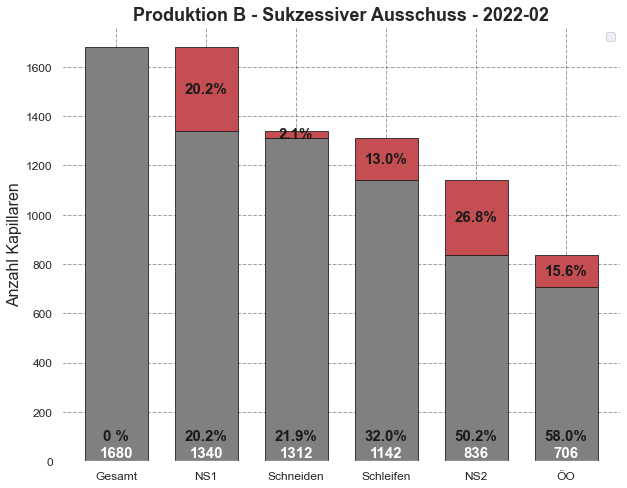

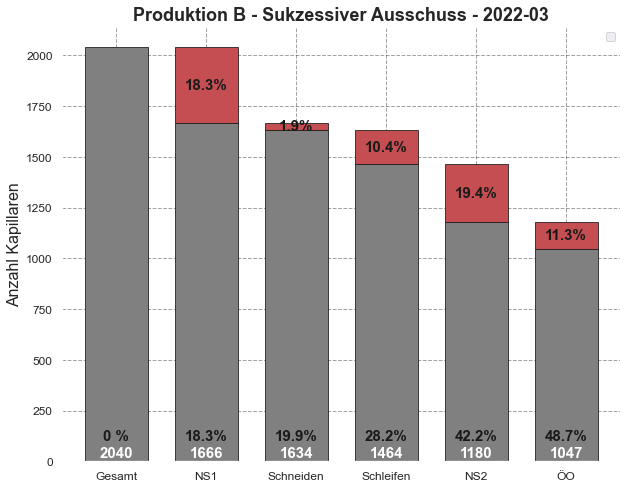

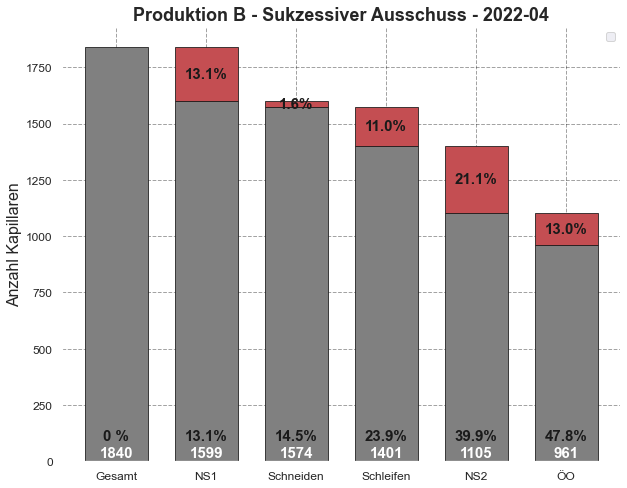

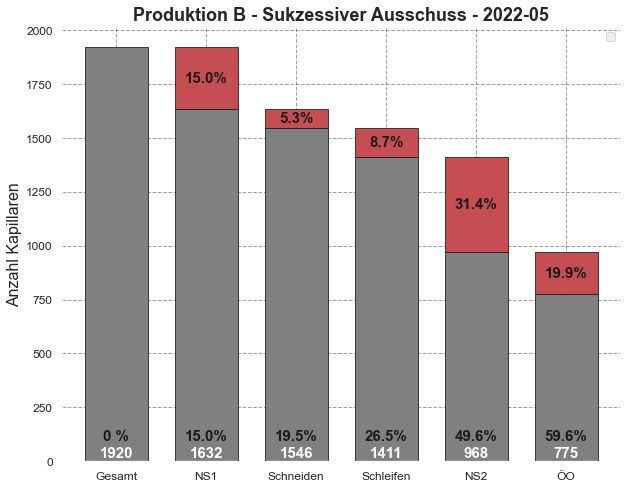

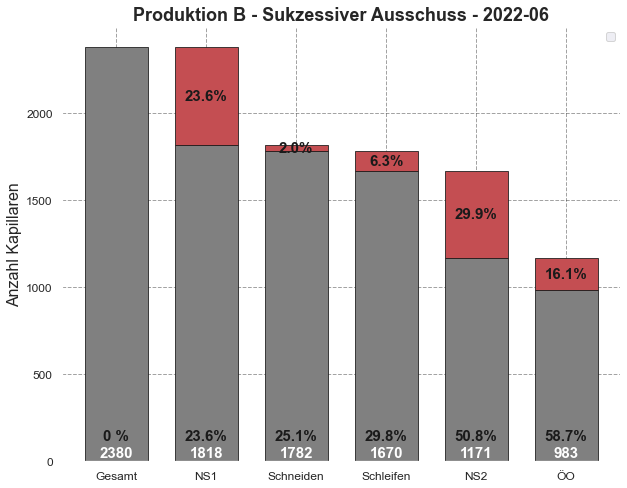

...

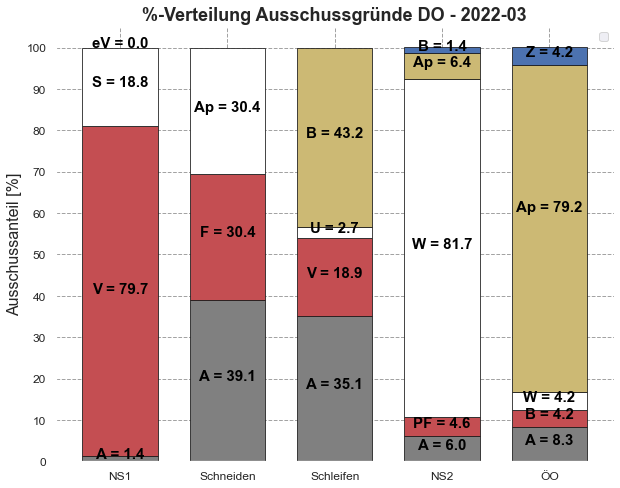

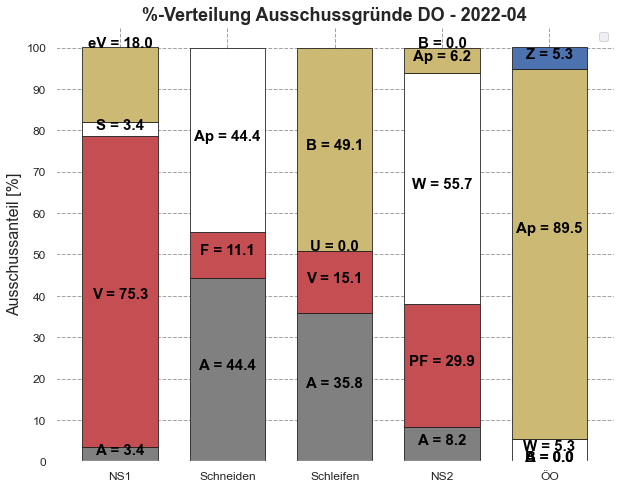

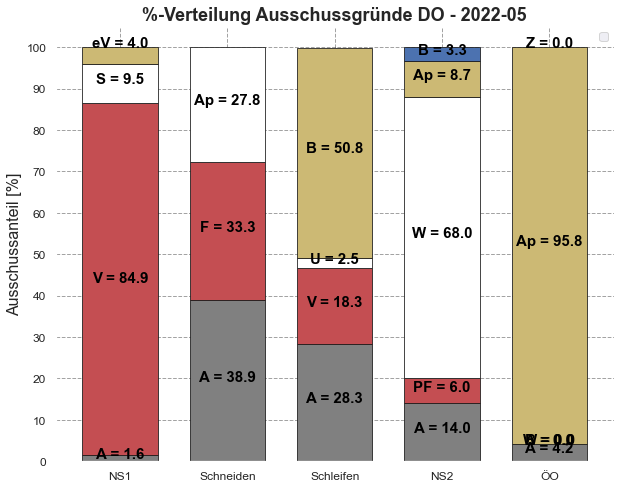

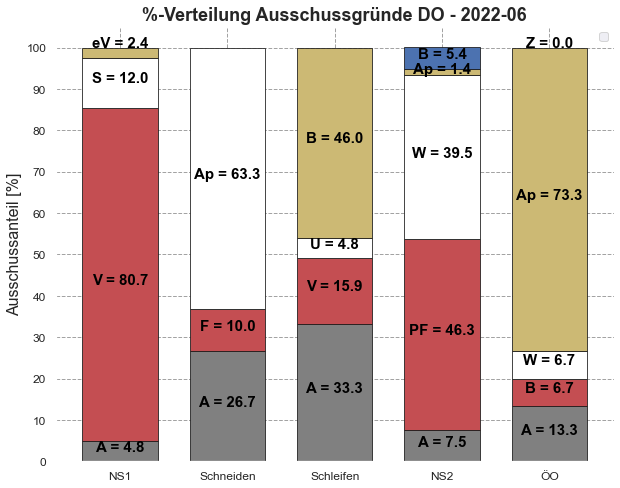

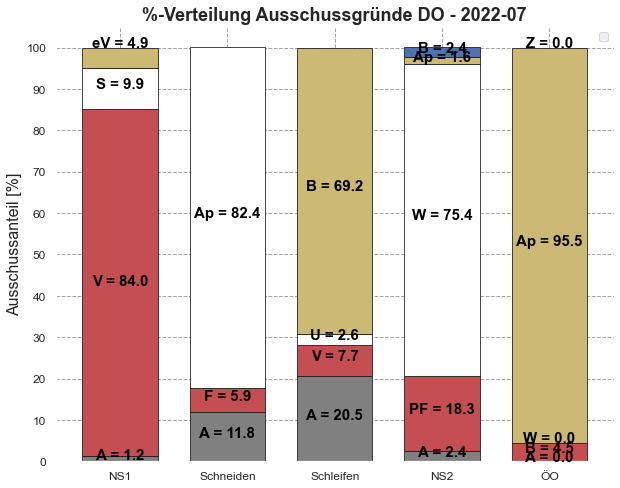

In [4]:
#############################################
### PROCESS SCRAP RATE ANALYSIS - OVERALL ###
#############################################

# CHECK HOW MANY CAPILLARIES WERE SCRAPPED IN EACH PRODUCTION STEP IN EACH MONTH
df_iter_List = [df_DB_Berlin, df_DB_Dortmund]
Site_iter_List = ["B", "DO"]

for df in range(len(df_iter_List)):
    for yearmonth in range(len(LastNMonths)):
            NS1Scrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 3) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])])
            SchneidenScrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 4) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])])
            SchleifenScrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 5) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])])
            NS2Scrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 6) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])])
            OKScrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 7) & (df_iter_List[df]["Defekt_Grund_ID"] != 1) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])])

            # SUCCESSIVE CALCULATION HOW MANY CAPILLARIES LEFT AFTER EACH PRODUCTION STEP
            ScrapSum = sum((NS1Scrap, SchleifenScrap, SchneidenScrap, NS2Scrap, OKScrap))
            KapsGesamt = len(df_iter_List[df][(df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])])
            KapsNachNS1Gesamt = KapsGesamt - NS1Scrap
            KapsNachSchneidenGesamt = KapsNachNS1Gesamt - SchneidenScrap
            KapsNachSchleifenGesamt = KapsNachSchneidenGesamt - SchleifenScrap
            KapsNachNS2Gesamt = KapsNachSchleifenGesamt - NS2Scrap
            KapsNachÖOGesamt = KapsNachNS2Gesamt - OKScrap

            # CALCULATE RESPECTIVE SUCCESSIVE SCRAP RATE OF PRODUCTION STEPS
            if len(df_iter_List[df][(df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])]) != 0:
                NS1ScrapRateSuc = np.around(((len(df_iter_List[df][df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth]])) - KapsNachNS1Gesamt) / len(df_iter_List[df][(df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth])]) * 100, 1)
            else:
                NS1ScrapRateSuc = 0
            if KapsNachNS1Gesamt != 0:
                SchneidenScrapRateSuc = np.around((KapsNachNS1Gesamt - KapsNachSchneidenGesamt) / KapsNachNS1Gesamt * 100, 1)
            else:
                SchneidenScrapRateSuc = 0
            if KapsNachSchneidenGesamt != 0:
                SchleifenScrapRateSuc = np.around((KapsNachSchneidenGesamt - KapsNachSchleifenGesamt) / KapsNachSchneidenGesamt * 100, 1)
            else:
                SchleifenScrapRateSuc = 0
            if KapsNachSchleifenGesamt != 0:
                NS2ScrapRateSuc = np.around((KapsNachSchleifenGesamt - KapsNachNS2Gesamt) / KapsNachSchleifenGesamt * 100, 1)
            else:
                NS2ScrapRateSuc = 0
            if KapsNachNS2Gesamt != 0:
                ÖOScrapRateSuc = np.around((KapsNachNS2Gesamt - KapsNachÖOGesamt) / KapsNachNS2Gesamt * 100, 1)
            else:
                ÖOScrapRateSuc = 0
            df_ScrapAnalysis = {"Schritt" : ["Gesamt", "NS1", "Schneiden", "Schleifen", "NS2", "ÖO"], 
                                "Anzahl" : [KapsGesamt, KapsNachNS1Gesamt, KapsNachSchneidenGesamt, 
                                            KapsNachSchleifenGesamt, KapsNachNS2Gesamt, KapsNachÖOGesamt], 
                                "Ausschuss sukz. [%]" : [0, NS1ScrapRateSuc, SchneidenScrapRateSuc, 
                                                         SchleifenScrapRateSuc, NS2ScrapRateSuc, ÖOScrapRateSuc]}
            df_ScrapAnalysis = pd.DataFrame(df_ScrapAnalysis)

            # PLOT ABSOLUTE AND SUCCESSIVE SCRAP RATES
            ScrapCountRates = [[KapsNachÖOGesamt, KapsNachNS2Gesamt - KapsNachÖOGesamt],
                               [KapsNachNS2Gesamt, KapsNachSchleifenGesamt - KapsNachNS2Gesamt],
                               [KapsNachSchleifenGesamt, KapsNachSchneidenGesamt - KapsNachSchleifenGesamt],
                               [KapsNachSchneidenGesamt, KapsNachNS1Gesamt - KapsNachSchneidenGesamt],
                               [KapsNachNS1Gesamt, KapsGesamt - KapsNachNS1Gesamt],
                               [KapsGesamt]]

            scrap1 = pd.DataFrame(ScrapCountRates[::-1], 
                                  index=list(df_ScrapAnalysis["Schritt"])).plot(kind="bar", stacked=True, color=["grey", "r", "w"], 
                                                                          edgecolor="k", linewidth=0.8, fontsize=12, width=0.7, 
                                                                          figsize=(10,8), rot=0)
            scrap1.grid(color="k", axis="both", linestyle="--", alpha=0.4)
            scrap1.set_ylabel("Anzahl Kapillaren", fontsize=16)
            scrap1.set_facecolor("white")

            # Text labels for absolute counts
            KapsGesamtText = scrap1.text(0, 0+(0.01*KapsGesamt), KapsGesamt, fontsize=15, ha="center", color="white", weight="bold")
            KapsNachNS1GesamtText = scrap1.text(1, 0+(0.01*KapsGesamt), KapsNachNS1Gesamt, fontsize=15, ha="center", color="white", weight="bold")
            KapsNachSchneidenGesamtText = scrap1.text(2, 0+(0.01*KapsGesamt), KapsNachSchneidenGesamt, fontsize=15, ha="center", color="white", weight="bold")
            KapsNachSchleifenGesamtText = scrap1.text(3, 0+(0.01*KapsGesamt), KapsNachSchleifenGesamt, fontsize=15, ha="center", color="white", weight="bold")
            KapsNachNS2GesamtText = scrap1.text(4, 0+(0.01*KapsGesamt), KapsNachNS2Gesamt, fontsize=15, ha="center", color="white", weight="bold")
            KapsNachÖOGesamtText = scrap1.text(5, 0+(0.01*KapsGesamt), KapsNachÖOGesamt, fontsize=15, ha="center", color="white", weight="bold")

            # Text labels for relative (successive) scrap rates
            KapsNachNS1GesamtScrapText = scrap1.text(1, KapsNachNS1Gesamt + (KapsGesamt - KapsNachNS1Gesamt)/2, str(NS1ScrapRateSuc) + "%", fontsize=15, ha="center", va="center", color="k", weight="bold")
            KapsNachSchneidenGesamtScrapText = scrap1.text(2, KapsNachSchneidenGesamt + (KapsNachNS1Gesamt - KapsNachSchneidenGesamt)/2, str(SchneidenScrapRateSuc) + "%", fontsize=15, ha="center", va="center", color="k", weight="bold")
            KapsNachSchleifenGesamtScrapText = scrap1.text(3, KapsNachSchleifenGesamt + (KapsNachSchneidenGesamt - KapsNachSchleifenGesamt)/2, str(SchleifenScrapRateSuc) + "%", fontsize=15, ha="center", va="center", color="k", weight="bold")
            KapsNachNS2GesamtScrapText = scrap1.text(4, KapsNachNS2Gesamt + (KapsNachSchleifenGesamt - KapsNachNS2Gesamt)/2, str(NS2ScrapRateSuc) + "%", fontsize=15, ha="center", va="center", color="k", weight="bold")
            KapsNachÖOGesamtScrapText = scrap1.text(5, KapsNachÖOGesamt + (KapsNachNS2Gesamt - KapsNachÖOGesamt)/2, str(ÖOScrapRateSuc) + "%", fontsize=15, ha="center", va="center", color="k", weight="bold")

            # Text labels for absolute scrap rates
            if KapsGesamt > 0:
                KapsNachSchmelzenGesamtScrapText = scrap1.text(0, 0+(0.05*KapsGesamt), "0 %", fontsize=15, ha="center", color="k", weight="bold")
                KapsNachNS1GesamtScrapText = scrap1.text(1, 0+(0.05*KapsGesamt), str(np.around(((KapsGesamt-KapsNachNS1Gesamt)/KapsGesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
                KapsNachSchneidenGesamtScrapText = scrap1.text(2, 0+(0.05*KapsGesamt), str(np.around(((KapsGesamt-KapsNachSchneidenGesamt)/KapsGesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
                KapsNachSchleifenGesamtScrapText = scrap1.text(3, 0+(0.05*KapsGesamt), str(np.around(((KapsGesamt-KapsNachSchleifenGesamt)/KapsGesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
                KapsNachNS2GesamtScrapText = scrap1.text(4, 0+(0.05*KapsGesamt), str(np.around(((KapsGesamt-KapsNachNS2Gesamt)/KapsGesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
                KapsNachÖOGesamtScrapText = scrap1.text(5, 0+(0.05*KapsGesamt), str(np.around(((KapsGesamt-KapsNachÖOGesamt)/KapsGesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
            else:
                pass
                
            #scrap1.legend(["Anzahl", "Prozessschritt-Ausschuss", "Gesamt-Ausschuss"], loc="best")
            scrap1.legend([])
            scrap1.set_title("Produktion " + Site_iter_List[df] +" - Sukzessiver Ausschuss - " + str(LastNMonths[yearmonth]), fontsize=18, weight="bold")
            plt.savefig(savePath_Scrap + "Auswertung_Ausschuss_Sukzessiv_" + str(LastNMonths[yearmonth]) + "_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
            plt.show()

##############################################
### PROCESS SCRAP RATE ANALYSIS - SPECIFIC ###
##############################################

for df in range(len(df_iter_List)):
    for yearmonth2 in range(len(LastNMonths)):
        # NS1Scrap Amounts
        NS1Scrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 3) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])])
        NS1ScrapA = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 3) & (df_iter_List[df]["Defekt_Grund_ID"] == 2) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS1:A
        NS1ScrapS = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 3) & (df_iter_List[df]["Defekt_Grund_ID"] == 6) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS1:S
        NS1ScrapV = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 3) & (df_iter_List[df]["Defekt_Grund_ID"] == 7) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS1:V
        NS1ScrapeV = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 3) & (df_iter_List[df]["Defekt_Grund_ID"] == 9) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS1:eV
        # NS1Scrap Rates
        if NS1Scrap != 0:
            NS1ScrapArate = np.around((NS1ScrapA/NS1Scrap)*100,1)
            NS1ScrapSrate = np.around((NS1ScrapS/NS1Scrap)*100,1)
            NS1ScrapVrate = np.around((NS1ScrapV/NS1Scrap)*100,1)
            NS1ScrapeVrate = np.around((NS1ScrapeV/NS1Scrap)*100,1)
        else:
            NS1ScrapArate = 0
            NS1ScrapSrate = 0
            NS1ScrapVrate = 0
            NS1ScrapeVrate = 0
        sumN1scrap = NS1ScrapArate + NS1ScrapSrate + NS1ScrapVrate + NS1ScrapeVrate

        # SchneidenScrap Amounts
        SchneidenScrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 4) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])])
        SchneidenScrapA = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"]== 4) & (df_iter_List[df]["Defekt_Grund_ID"] == 2) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #Schn:A
        SchneidenScrapF = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 4) & (df_iter_List[df]["Defekt_Grund_ID"] == 12) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #Schn:F
        SchneidenScrapAp = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"]== 4) & (df_iter_List[df]["Defekt_Grund_ID"] == 13) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #Schn:Ap
        # SchneidenScrap Rates
        if SchneidenScrap != 0:
            SchneidenScrapArate = np.around((SchneidenScrapA/SchneidenScrap)*100,1)
            SchneidenScrapFrate = np.around((SchneidenScrapF/SchneidenScrap)*100,1)
            SchneidenScrapAprate = np.around((SchneidenScrapAp/SchneidenScrap)*100,1)
        else:
            SchneidenScrapArate = 0
            SchneidenScrapFrate = 0
            SchneidenScrapAprate = 0
        sumSchneidenscrap = SchneidenScrapArate + SchneidenScrapFrate + SchneidenScrapAprate

        # SchleifenScrap Amounts
        SchleifenScrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 5) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])])
        SchleifenScrapA = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 5) & (df_iter_List[df]["Defekt_Grund_ID"] == 2) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #Schl:A
        SchleifenScrapV = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 5) & (df_iter_List[df]["Defekt_Grund_ID"] == 17) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #Schl:V
        SchleifenScrapU = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 5) & (df_iter_List[df]["Defekt_Grund_ID"] == 5) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #Schl:U
        SchleifenScrapB = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 5) & (df_iter_List[df]["Defekt_Grund_ID"] == 31) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #Schl:B
        # SchleifenScrap Rates
        if SchleifenScrap != 0:
            SchleifenScrapArate = np.around((SchleifenScrapA/SchleifenScrap)*100,1)
            SchleifenScrapVrate = np.around((SchleifenScrapV/SchleifenScrap)*100,1)
            SchleifenScrapUrate = np.around((SchleifenScrapU/SchleifenScrap)*100,1)
            SchleifenScrapBrate = np.around((SchleifenScrapB/SchleifenScrap)*100,1)
        else:
            SchleifenScrapArate = 0
            SchleifenScrapVrate = 0
            SchleifenScrapUrate = 0
            SchleifenScrapBrate = 0
        sumSchleifenscrap = SchleifenScrapArate + SchleifenScrapVrate + SchleifenScrapUrate + SchleifenScrapBrate

        # NS2Scrap Amounts
        NS2Scrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 6) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])])
        NS2ScrapA = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 6) & (df_iter_List[df]["Defekt_Grund_ID"] == 2) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS2:A
        NS2ScrapPF = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 6) & (df_iter_List[df]["Defekt_Grund_ID"] == 10) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS2:PF
        NS2ScrapW = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 6) & (df_iter_List[df]["Defekt_Grund_ID"] == 11) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS2:W
        NS2ScrapAp = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 6) & (df_iter_List[df]["Defekt_Grund_ID"] == 13) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS2:Ap
        NS2ScrapB = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 6) & (df_iter_List[df]["Defekt_Grund_ID"] == 31) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #NS2:B
        # NS2Scrap Rates
        if NS2Scrap != 0:
            NS2ScrapArate = np.around((NS2ScrapA/NS2Scrap)*100,1)
            NS2ScrapPFrate = np.around((NS2ScrapPF/NS2Scrap)*100,1)
            NS2ScrapWrate = np.around((NS2ScrapW/NS2Scrap)*100,1)
            NS2ScrapAprate = np.around((NS2ScrapAp/NS2Scrap)*100,1)
            NS2ScrapBrate = np.around((NS2ScrapB/NS2Scrap)*100,1)
        else:
            NS2ScrapArate = 0
            NS2ScrapPFrate = 0
            NS2ScrapWrate = 0
            NS2ScrapAprate = 0
            NS2ScrapBrate = 0
        sumNS2scrap = NS2ScrapArate + NS2ScrapPFrate + NS2ScrapWrate + NS2ScrapAprate + NS2ScrapBrate

        # OKScrap Amounts
        OKScrap = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 7) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])])
        OKScrapA = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 7) & (df_iter_List[df]["Defekt_Grund_ID"] == 2) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #ÖO:A
        OKScrapB = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 7) & (df_iter_List[df]["Defekt_Grund_ID"] == 31) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #ÖO:B
        OKScrapW = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 7) & (df_iter_List[df]["Defekt_Grund_ID"] == 11) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #ÖO:W
        OKScrapAp = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 7) & (df_iter_List[df]["Defekt_Grund_ID"] == 13) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #ÖO:Ap
        OKScrapZ = len(df_iter_List[df][(df_iter_List[df]["Defekt_Arbeitsschritt_ID"] == 7) & (df_iter_List[df]["Defekt_Grund_ID"] == 14) & (df_iter_List[df]["Schmelzen_Month"] == LastNMonths[yearmonth2])]) #ÖO:Z
        # OKScrap Rates
        if OKScrap != 0:
            OKScrapArate = np.around((OKScrapA/OKScrap)*100,1)
            OKScrapBrate = np.around((OKScrapB/OKScrap)*100,1)
            OKScrapWrate = np.around((OKScrapW/OKScrap)*100,1)
            OKScrapAprate = np.around((OKScrapAp/OKScrap)*100,1)
            OKScrapZrate = np.around((OKScrapZ/OKScrap)*100,1)
        else:
            OKScrapArate = 0
            OKScrapBrate = 0
            OKScrapWrate = 0
            OKScrapAprate = 0
            OKScrapZrate = 0
        sumOKscrap = OKScrapArate + OKScrapBrate + OKScrapWrate + OKScrapAprate + OKScrapZrate


        SukzScrapCountRates = [[NS1ScrapArate, NS1ScrapVrate, NS1ScrapSrate, NS1ScrapeVrate],
                              [SchneidenScrapArate, SchneidenScrapFrate, SchneidenScrapAprate],
                              [SchleifenScrapArate, SchleifenScrapVrate, SchleifenScrapUrate, SchleifenScrapBrate],
                              [NS2ScrapArate, NS2ScrapPFrate, NS2ScrapWrate, NS2ScrapAprate, NS2ScrapBrate],
                              [OKScrapArate, OKScrapBrate, OKScrapWrate, OKScrapAprate, OKScrapZrate]]

        scrap2 = pd.DataFrame(SukzScrapCountRates,index=list(df_ScrapAnalysis["Schritt"][1:])).plot(kind="bar", stacked=True, color=["grey", "r", "w", "y", "b"], 
                                                                      edgecolor="k", linewidth=0.8, fontsize=12, width=0.7, 
                                                                      figsize=(10,8), rot=0, yticks=np.arange(0,110,10))
        scrap2.set_title("%-Verteilung Ausschussgründe " + Site_iter_List[df] + " - " + str(LastNMonths[yearmonth2]), fontsize=18, weight="bold")
        scrap2.grid(color="k", axis="both", linestyle="--", alpha=0.4)
        scrap2.set_ylabel("Ausschussanteil [%]", fontsize=16)
        scrap2.set_facecolor("white")

        scrap2.legend([])

        # Text labels for absolute counts
        NS1ScrapArateText = scrap2.text(0, NS1ScrapArate/2, "A = "+str(NS1ScrapArate), fontsize=15, ha="center", color="black", weight="bold")
        NS1ScrapVrateText = scrap2.text(0, (((NS1ScrapArate+NS1ScrapVrate)/2)), "V = "+str(NS1ScrapVrate), fontsize=15, ha="center", color="black", weight="bold")
        NS1ScrapSrateText = scrap2.text(0, 100-NS1ScrapeVrate-(NS1ScrapSrate/2), "S = "+str(NS1ScrapSrate), fontsize=15, ha="center", color="black", weight="bold")
        NS1ScrapeVrateText = scrap2.text(0, 100, "eV = "+str(NS1ScrapeVrate), fontsize=15, ha="center", color="black", weight="bold")
        #
        SchneidenScrapArateText = scrap2.text(1, SchneidenScrapArate/2, "A = "+str(SchneidenScrapArate), fontsize=15, ha="center", color="black", weight="bold")
        SchneidenScrapFrateText = scrap2.text(1, SchneidenScrapArate+(SchneidenScrapFrate/2), "F = "+str(SchneidenScrapFrate), fontsize=15, ha="center", color="black", weight="bold")
        SchneidenScrapAprateText = scrap2.text(1, SchneidenScrapArate+SchneidenScrapFrate+(SchneidenScrapAprate/2), "Ap = "+str(SchneidenScrapAprate), fontsize=15, ha="center", color="black", weight="bold")
        #
        SchleifenScrapArateText = scrap2.text(2, SchleifenScrapArate/2, "A = "+str(SchleifenScrapArate), fontsize=15, ha="center", color="black", weight="bold")
        SchleifenScrapVrateText = scrap2.text(2, SchleifenScrapArate+(SchleifenScrapVrate/2), "V = "+str(SchleifenScrapVrate), fontsize=15, ha="center", color="black", weight="bold")
        SchleifenScrapUrateText = scrap2.text(2, SchleifenScrapArate+SchleifenScrapVrate+(SchleifenScrapUrate/2), "U = "+str(SchleifenScrapUrate), fontsize=15, ha="center", color="black", weight="bold")
        SchleifenScrapBrateText = scrap2.text(2, 100-(SchleifenScrapBrate/2), "B = "+str(SchleifenScrapBrate), fontsize=15, ha="center", color="black", weight="bold")
        #
        NS2ScrapArateText = scrap2.text(3, NS2ScrapArate/2, "A = "+str(NS2ScrapArate), fontsize=15, ha="center", color="black", weight="bold")
        NS2ScrapPFrateText = scrap2.text(3, NS2ScrapArate+(NS2ScrapPFrate/2), "PF = "+str(NS2ScrapPFrate), fontsize=15, ha="center", color="black", weight="bold")
        NS2ScrapWrateText = scrap2.text(3, NS2ScrapArate+NS2ScrapPFrate+(NS2ScrapWrate/2), "W = "+str(NS2ScrapWrate), fontsize=15, ha="center", color="black", weight="bold")
        NS2ScrapAprateText = scrap2.text(3, 100-NS2ScrapBrate-(NS2ScrapAprate/2), "Ap = "+str(NS2ScrapAprate), fontsize=15, ha="center", color="black", weight="bold")
        NS2ScrapBrateText = scrap2.text(3, 100-(NS2ScrapBrate/2), "B = "+str(NS2ScrapBrate), fontsize=15, ha="center", color="black", weight="bold")
        #
        OKScrapArateText = scrap2.text(4, OKScrapArate/2, "A = "+str(OKScrapArate), fontsize=15, ha="center", color="black", weight="bold")
        OKScrapBrateText = scrap2.text(4, OKScrapArate+(OKScrapBrate/2), "B = "+str(OKScrapBrate), fontsize=15, ha="center", color="black", weight="bold")
        OKScrapWrateText = scrap2.text(4, OKScrapArate+OKScrapBrate+(OKScrapWrate/2), "W = "+str(OKScrapWrate), fontsize=15, ha="center", color="black", weight="bold")
        OKScrapAprateText = scrap2.text(4, 100-(OKScrapAprate/2), "Ap = "+str(OKScrapAprate), fontsize=15, ha="center", color="black", weight="bold")
        OKScrapZrateText = scrap2.text(4, 100-(OKScrapZrate/2), "Z = "+str(OKScrapZrate), fontsize=15, ha="center", color="black", weight="bold")

        plt.savefig(savePath_Scrap + "Auswertung_Prozentuale_Ausschussverteilung_" + str(LastNMonths[yearmonth2]) + "_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")

        plt.show()

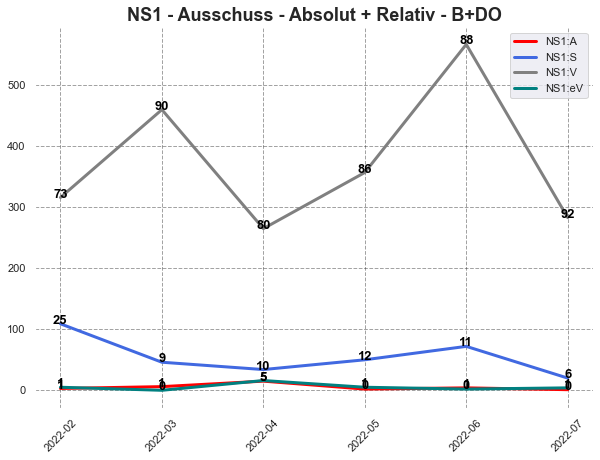

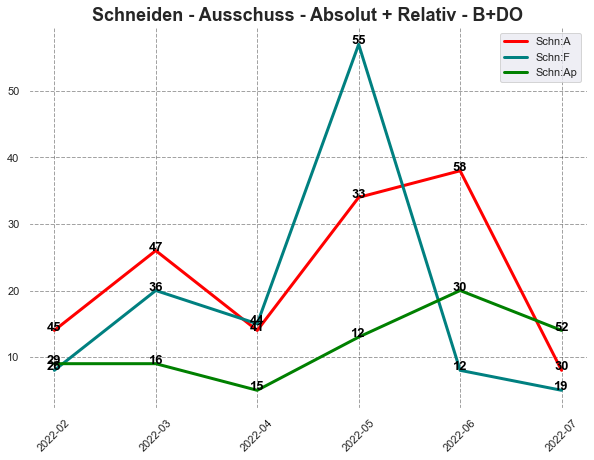

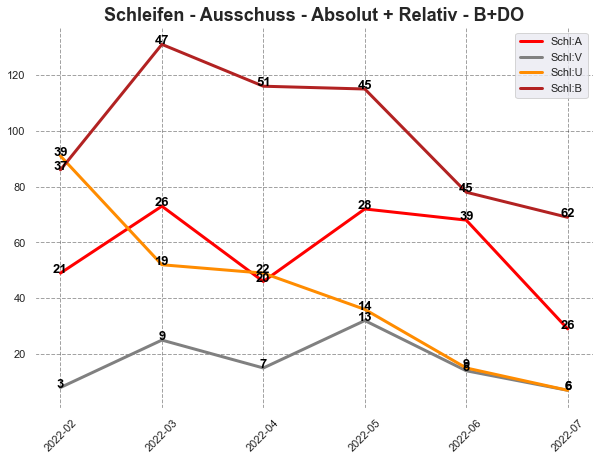

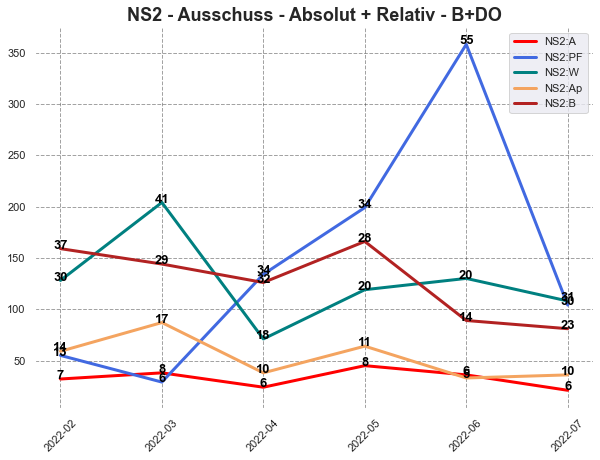

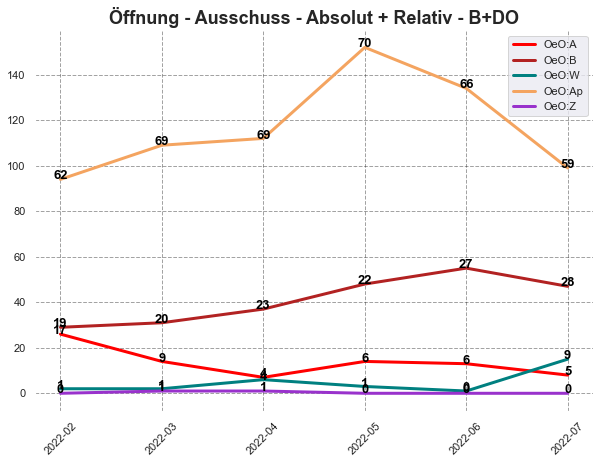

...

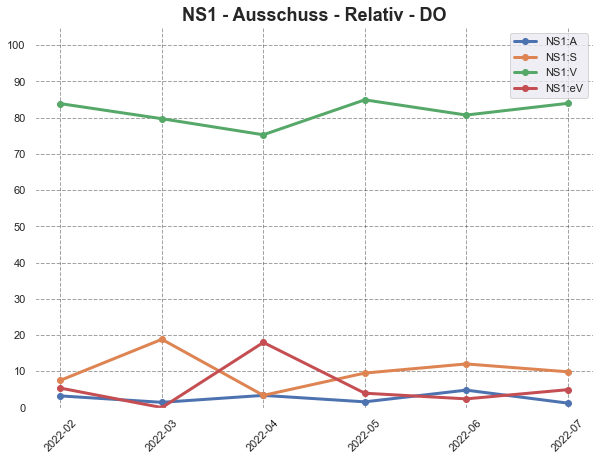

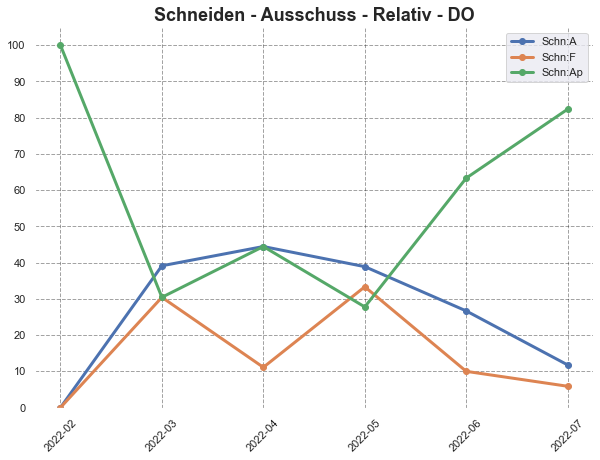

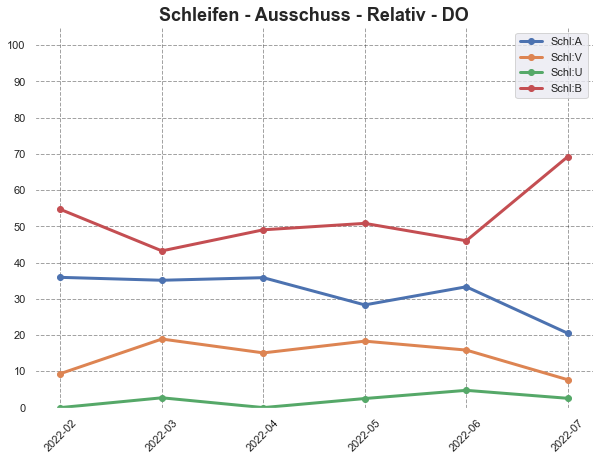

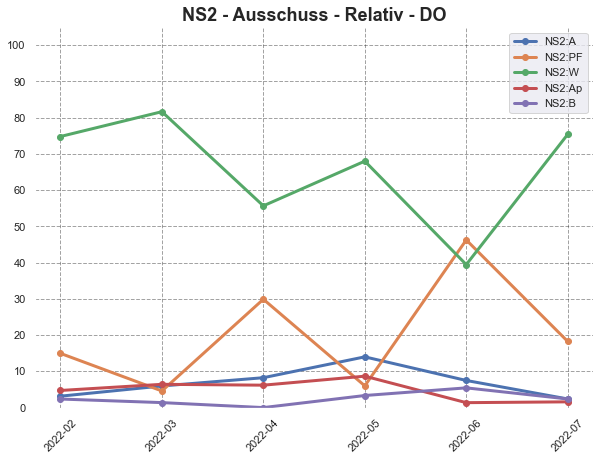

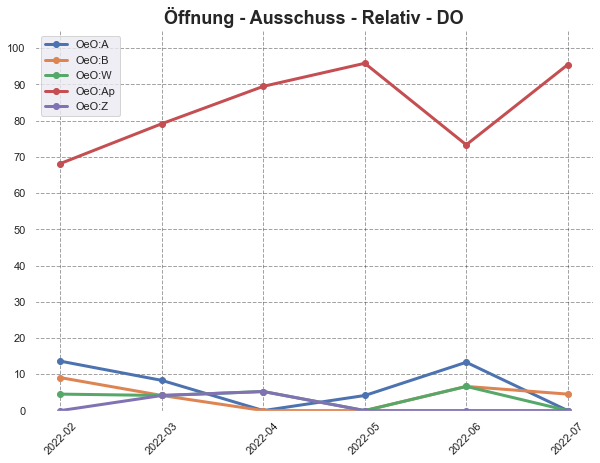

In [5]:
########################################################
### TIME-BASED ABOLUTE SCRAP RATE ANALYSIS - MONTHLY ###
########################################################

df_Select_List = [df_DB_trunc, df_DB_Berlin, df_DB_Dortmund]
Site_iter_List = ["B+DO", "B", "DO"]

for df in range(len(df_Select_List)):

    # Clean dataframe of unscrapped nozzles
    df_Select_clean = df_Select_List[df][(df_Select_List[df]["Defekt_Arbeitsschritt_ID"]!=1) & 
                                     (df_Select_List[df]["Defekt_Grund_ID"]!=1)].reset_index(drop=True)

    # Construct dataframe to populate with scrap data
    df_scrapAbsolute = pd.DataFrame(columns=LastNMonths)
    df_scrapAbsolute.insert(0, "Defekt_Grund", ["Kapillaren geschmolzen", "NS1 gesamt", "NS1:A", "NS1:S", "NS1:V", "NS1:ev", 
                                 "Schneiden gesamt", "Schn:A", "Schn:F", "Schn:Ap",
                                 "Schleifen gesamt", "Schl:A", "Schl:V", "Schl:U", "Schl:B",
                                 "NS2 gesamt", "NS2:A", "NS2:PF", "NS2:W", "NS2:Ap", "NS2:B",
                                 "OeO gesamt", "OeO:A", "OeO:B", "OeO:W", "OeO:Ap", "OeO:Z"])

    # Count scrap occurances in respective periods and assign to respective period column in dataframe
    for period in range(len(LastNMonths)):
        DateScrapAbsoluteList = []
        # Kapillaren gesamt
        DateScrapAbsoluteList.append(len(df_Select_List[df][df_Select_List[df]["Schmelzen_Month"]==LastNMonths[period]]))
        # NS1 gesamt
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)]))
        # NS1:A
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & 
           (df_Select_clean["Defekt_Grund_ID"]==2)]))
        # NS1:S
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & 
           (df_Select_clean["Defekt_Grund_ID"]==6)]))
        # NS1:V
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & 
           (df_Select_clean["Defekt_Grund_ID"]==7)]))
        # NS1:eV
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & 
           (df_Select_clean["Defekt_Grund_ID"]==9)]))

        # Schneiden gesamt
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)]))
        # Schn:A
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4) & 
           (df_Select_clean["Defekt_Grund_ID"]==2)]))
        # Schn:F
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4) & 
           (df_Select_clean["Defekt_Grund_ID"]==12)]))
        # Schn:Ap
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4) & 
           (df_Select_clean["Defekt_Grund_ID"]==13)]))

        # Schleifen gesamt
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)]))
        # Schl:A
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & 
           (df_Select_clean["Defekt_Grund_ID"]==2)]))
        # Schl:V
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & 
           (df_Select_clean["Defekt_Grund_ID"]==17)]))
        # Schl:U
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & 
           (df_Select_clean["Defekt_Grund_ID"]==5)]))
        # Schl:B
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & 
           (df_Select_clean["Defekt_Grund_ID"]==31)]))

        # NS2 gesamt
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)]))
        # NS2:A
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & 
           (df_Select_clean["Defekt_Grund_ID"]==2)]))
        # NS2:PF
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & 
           (df_Select_clean["Defekt_Grund_ID"]==10)]))
        # NS2:W
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & 
           (df_Select_clean["Defekt_Grund_ID"]==11)]))
        # NS2:Ap
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & 
           (df_Select_clean["Defekt_Grund_ID"]==13)]))
        # NS2:B
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & 
           (df_Select_clean["Defekt_Grund_ID"]==31)]))

        # OeO gesamt
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)]))
        # OeO:A
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & 
           (df_Select_clean["Defekt_Grund_ID"]==2)]))
        # OeO:B
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & 
           (df_Select_clean["Defekt_Grund_ID"]==31)]))
        # OeO:W
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & 
           (df_Select_clean["Defekt_Grund_ID"]==11)]))
        # OeO:Ap
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & 
           (df_Select_clean["Defekt_Grund_ID"]==13)]))
        # OeO:Z
        DateScrapAbsoluteList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & 
           (df_Select_clean["Defekt_Grund_ID"]==14)]))
        df_scrapAbsolute.iloc[:,period+1] = DateScrapAbsoluteList

    write_df_scrapAbsolute = df_scrapAbsolute.to_csv(savePath + "Ausschuss_Absolut_"  + Site_iter_List[df] + ".csv", sep=";", index=False)

    #########################################################
    ### TIME-BASED RELATIVE SCRAP RATE ANALYSIS - MONTHLY ###
    #########################################################

    df_scrapRelative = pd.DataFrame(columns=LastNMonths)
    df_scrapRelative.insert(0, "Defekt_Grund", ["NS1 gesamt", "NS1:A [%]", "NS1:S [%]", "NS1:V [%]", "NS1:ev [%]",
                                                "Schneiden gesamt", "Schn:A [%]", "Schn:F [%]", "Schn:Ap [%]", 
                                                "Schleifen gesamt", "Schl:A [%]", "Schl:V [%]", "Schl:U [%]", "Schl:B [%]",
                                                "NS2 gesamt", "NS2:A [%]", "NS2:PF [%]", "NS2:W [%]", "NS2:Ap [%]", "NS2:B [%]",
                                                "OeO gesamt", "OeO:A [%]", "OeO:B [%]", "OeO:W [%]", "OeO:Ap [%]", "OeO:Z [%]"])

    # Count scrap occurances in respective periods and assign to respective period column in dataframe
    for period in range(len(LastNMonths)):
        DateScrapRelativeList = []
        # NS1 gesamt
        DateScrapRelativeList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)]))
        # NS1:A
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_Select_clean["Defekt_Grund_ID"]==2)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
        else:
            DateScrapRelativeList.append(0)
        # NS1:S
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_Select_clean["Defekt_Grund_ID"]==6)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
        else:
            DateScrapRelativeList.append(0)
        # NS1:V
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_Select_clean["Defekt_Grund_ID"]==7)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
        else:
            DateScrapRelativeList.append(0)
        # NS1:eV
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_Select_clean["Defekt_Grund_ID"]==9)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
        else:
            DateScrapRelativeList.append(0)
        # Schneiden gesamt
        DateScrapRelativeList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)]))
        # Schn:A
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4) & (df_Select_clean["Defekt_Grund_ID"]==2)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)])))*100)
        else:
            DateScrapRelativeList.append(0)
        # Schn:F
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4) & (df_Select_clean["Defekt_Grund_ID"]==12)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)])))*100)    
        else:
            DateScrapRelativeList.append(0)
        # Schn:Ap
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4) & (df_Select_clean["Defekt_Grund_ID"]==13)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==4)])))*100)    
        else:
            DateScrapRelativeList.append(0)

        # Schleifen gesamt
        DateScrapRelativeList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)]))
        # Schl:A
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_Select_clean["Defekt_Grund_ID"]==2)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
        else:
            DateScrapRelativeList.append(0)
        # Schl:V
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_Select_clean["Defekt_Grund_ID"]==17)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
        else:
            DateScrapRelativeList.append(0)
        # Schl:U
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_Select_clean["Defekt_Grund_ID"]==5)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
        else:
            DateScrapRelativeList.append(0)
        # Schl:B
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_Select_clean["Defekt_Grund_ID"]==31)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
        else:
            DateScrapRelativeList.append(0)

        # NS2 gesamt
        DateScrapRelativeList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)]))
        # NS2:A
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_Select_clean["Defekt_Grund_ID"]==2)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)    
        else:
            DateScrapRelativeList.append(0)
        # NS2:PF
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_Select_clean["Defekt_Grund_ID"]==10)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)      
        else:
            DateScrapRelativeList.append(0)
        # NS2:W
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_Select_clean["Defekt_Grund_ID"]==11)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)      
        else:
            DateScrapRelativeList.append(0)
        # NS2:Ap
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_Select_clean["Defekt_Grund_ID"]==13)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)  
        else:
            DateScrapRelativeList.append(0)
        # NS2:B
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_Select_clean["Defekt_Grund_ID"]==31)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)  
        else:
            DateScrapRelativeList.append(0)

        # OeO gesamt
        DateScrapRelativeList.append(len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)]))
        # OeO:A
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_Select_clean["Defekt_Grund_ID"]==2)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)     
        else:
            DateScrapRelativeList.append(0)
        # OeO:B
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_Select_clean["Defekt_Grund_ID"]==31)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
        else:
            DateScrapRelativeList.append(0)
        # OeO:W
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_Select_clean["Defekt_Grund_ID"]==11)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
        else:
            DateScrapRelativeList.append(0)
        # OeO:Ap
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_Select_clean["Defekt_Grund_ID"]==13)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
        else:
            DateScrapRelativeList.append(0)
        # OeO:Z
        if (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
            DateScrapRelativeList.append(((len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
               (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_Select_clean["Defekt_Grund_ID"]==14)])) /  
                                         (len(df_Select_clean[(df_Select_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                                 (df_Select_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
        else:
            DateScrapRelativeList.append(0)
        df_scrapRelative.iloc[:,period+1] = DateScrapRelativeList

    write_df_scrapRelative = df_scrapRelative.to_csv(savePath + "Ausschuss_Relativ_"  + Site_iter_List[df] + ".csv", sep=";", index=False)


    ##########################################################
    ### PLOTTING TIME-BASED ABSOLUTE + RELATIVE SCRAP DATA ###
    ##########################################################

    ### PLOT NS1 ABSOLUTE & RELATIVE SCRAP RATES ###
    fig, ax1 = plt.subplots(figsize=(10,7))  # NS1
    ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[2,1:]), label="NS1:A", linewidth=3, color="red") # NS1:A
    ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[3,1:]), label="NS1:S", linewidth=3, color="royalblue") # NS1:S
    ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[4,1:]), label="NS1:V", linewidth=3, color="grey") # NS1:V
    ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[5,1:]), label="NS1:eV", linewidth=3, color="teal") # NS1:eV

    ax1.set_facecolor("white")
    ax1.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    ax1.set_title("NS1 - Ausschuss - Absolut + Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax1.legend()

    ### TEXT ANNOTATIONS - NS1 SCRAPS ###
    NS1AtextAnnotList = [int(np.around(df_scrapRelative.iloc[1,1+a],0)) for a in range(len(df_scrapRelative.iloc[1,1:]))]
    NS1StextAnnotList = [int(np.around(df_scrapRelative.iloc[2,1+a],0)) for a in range(len(df_scrapRelative.iloc[2,1:]))]
    NS1VtextAnnotList = [int(np.around(df_scrapRelative.iloc[3,1+a],0)) for a in range(len(df_scrapRelative.iloc[3,1:]))]
    NS1eVtextAnnotList = [int(np.around(df_scrapRelative.iloc[4,1+a],0)) for a in range(len(df_scrapRelative.iloc[4,1:]))]

    ### ANNOTATE RELATIVE SCRAP RATES ###
    for date in range(len(LastNMonths)):
        ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[2,date+1], NS1AtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[3,date+1], NS1StextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[4,date+1], NS1VtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[5,date+1], NS1eVtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")

    plt.savefig(savePath_Scrap + "Auswertung_NS1_Ausschussverlauf_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    #plt.show()
    ######################################################################################################################

    ### PLOT SCHNEIDEN ABSOLUTE & RELATIVE SCRAP RATES ###
    fig, ax2 = plt.subplots(figsize=(10,7)) # Schneiden
    ax2.plot(LastNMonths, list(df_scrapAbsolute.iloc[7,1:]), label="Schn:A", linewidth=3, color="red") # Schn:A
    ax2.plot(LastNMonths, list(df_scrapAbsolute.iloc[8,1:]), label="Schn:F", linewidth=3, color="teal") # Schn:F
    ax2.plot(LastNMonths, list(df_scrapAbsolute.iloc[9,1:]), label="Schn:Ap", linewidth=3, color="green") # Schn:Ap

    ax2.set_facecolor("white")
    ax2.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    ax2.set_title("Schneiden - Ausschuss - Absolut + Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax2.legend()

    ### TEXT ANNOTATIONS - SCHNEIDEN SCRAPS ###
    SchnAtextAnnotList = [int(np.around(df_scrapRelative.iloc[6,1+a],0)) for a in range(len(df_scrapRelative.iloc[6,1:]))]
    SchnFtextAnnotList = [int(np.around(df_scrapRelative.iloc[7,1+a],0)) for a in range(len(df_scrapRelative.iloc[7,1:]))]
    SchnAptextAnnotList = [int(np.around(df_scrapRelative.iloc[8,1+a],0)) for a in range(len(df_scrapRelative.iloc[6,1:]))]

    ### ANNOTATE RELATIVE SCRAP RATES ###
    for date in range(len(LastNMonths)):
        ax2.text(LastNMonths[date], df_scrapAbsolute.iloc[7,date+1], SchnAtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax2.text(LastNMonths[date], df_scrapAbsolute.iloc[8,date+1], SchnFtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax2.text(LastNMonths[date], df_scrapAbsolute.iloc[9,date+1], SchnAptextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")

    plt.savefig(savePath_Scrap + "Auswertung_Schneiden_Ausschussverlauf_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    #plt.show()
    ######################################################################################################################

    ### PLOT SCHLEIFEN ABSOLUTE & RELATIVE SCRAP RATES ###
    fig, ax3 = plt.subplots(figsize=(10,7)) # Schleifen
    ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[11,1:]), label="Schl:A", linewidth=3, color="red") # Schl:A
    ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[12,1:]), label="Schl:V", linewidth=3, color="grey") # Schl:V
    ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[13,1:]), label="Schl:U", linewidth=3, color="darkorange") # Schl:U
    ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[14,1:]), label="Schl:B", linewidth=3, color="firebrick") # Schl:B

    ax3.set_facecolor("white")
    ax3.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    ax3.set_title("Schleifen - Ausschuss - Absolut + Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax3.legend()

    ### TEXT ANNOTATIONS - SCHLEIFEN SCRAPS ###
    SchlAtextAnnotList = [int(np.around(df_scrapRelative.iloc[10,1+a],0)) for a in range(len(df_scrapRelative.iloc[9,1:]))]
    SchlVtextAnnotList = [int(np.around(df_scrapRelative.iloc[11,1+a],0)) for a in range(len(df_scrapRelative.iloc[10,1:]))]
    SchlUtextAnnotList = [int(np.around(df_scrapRelative.iloc[12,1+a],0)) for a in range(len(df_scrapRelative.iloc[11,1:]))]
    SchlBtextAnnotList = [int(np.around(df_scrapRelative.iloc[13,1+a],0)) for a in range(len(df_scrapRelative.iloc[12,1:]))]

    ### ANNOTATE RELATIVE SCRAP RATES ###
    for date in range(len(LastNMonths)):
        ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[11,date+1], SchlAtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[12,date+1], SchlVtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[13,date+1], SchlUtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[14,date+1], SchlBtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")

    plt.savefig(savePath_Scrap + "Auswertung_Schleifen_Ausschussverlauf_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    #plt.show()
    ######################################################################################################################

    ### PLOT NS2 ABSOLUTE & RELATIVE SCRAP RATES ###
    fig, ax4 = plt.subplots(figsize=(10,7)) # NS2
    ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[16,1:]), label="NS2:A", linewidth=3, color="red") # NS2:A
    ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[17,1:]), label="NS2:PF", linewidth=3, color="royalblue") # NS2:PF
    ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[18,1:]), label="NS2:W", linewidth=3, color="teal") # NS2:W
    ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[19,1:]), label="NS2:Ap", linewidth=3, color="sandybrown") # NS2:Ap
    ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[20,1:]), label="NS2:B", linewidth=3, color="firebrick") # NS2:B

    ax4.set_facecolor("white")
    ax4.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    ax4.set_title("NS2 - Ausschuss - Absolut + Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax4.legend()

    ### TEXT ANNOTATIONS - NS2 SCRAPS ###
    NS2AtextAnnotList = [int(np.around(df_scrapRelative.iloc[15,1+a],0)) for a in range(len(df_scrapRelative.iloc[14,1:]))]
    NS2PFtextAnnotList = [int(np.around(df_scrapRelative.iloc[16,1+a],0)) for a in range(len(df_scrapRelative.iloc[15,1:]))]
    NS2WtextAnnotList = [int(np.around(df_scrapRelative.iloc[17,1+a],0)) for a in range(len(df_scrapRelative.iloc[16,1:]))]
    NS2AptextAnnotList = [int(np.around(df_scrapRelative.iloc[18,1+a],0)) for a in range(len(df_scrapRelative.iloc[17,1:]))]
    NS2BtextAnnotList = [int(np.around(df_scrapRelative.iloc[19,1+a],0)) for a in range(len(df_scrapRelative.iloc[18,1:]))]

    ### ANNOTATE RELATIVE SCRAP RATES ###
    for date in range(len(LastNMonths)):
        ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[16,date+1], NS2AtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[17,date+1], NS2PFtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[18,date+1], NS2WtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[19,date+1], NS2AptextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[20,date+1], NS2BtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")

    plt.savefig(savePath_Scrap + "Auswertung_NS2_Ausschussverlauf_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    #plt.show()
    ######################################################################################################################

    ### PLOT OeO ABSOLUTE & RELATIVE SCRAP RATES ###
    fig, ax5 = plt.subplots(figsize=(10,7)) # OeO
    ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[22,1:]), label="OeO:A", linewidth=3, color="red") # OeO:A
    ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[23,1:]), label="OeO:B", linewidth=3, color="firebrick") # OeO:B
    ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[24,1:]), label="OeO:W", linewidth=3, color="teal") # OeO:W
    ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[25,1:]), label="OeO:Ap", linewidth=3, color="sandybrown") # OeO:Ap
    ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[26,1:]), label="OeO:Z", linewidth=3, color="darkorchid") # OeO:Z

    ax5.set_facecolor("white")
    ax5.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    plt.title("Öffnung - Ausschuss - Absolut + Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax5.legend()

    ### TEXT ANNOTATIONS - OeO SCRAPS ###
    OeOAtextAnnotList = [int(np.around(df_scrapRelative.iloc[21,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
    OeOBtextAnnotList = [int(np.around(df_scrapRelative.iloc[22,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
    OeOWtextAnnotList = [int(np.around(df_scrapRelative.iloc[23,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
    OeOAptextAnnotList = [int(np.around(df_scrapRelative.iloc[24,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
    OeOZtextAnnotList = [int(np.around(df_scrapRelative.iloc[25,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]

    ### ANNOTATE RELATIVE SCRAP RATES ###
    for date in range(len(LastNMonths)):
        ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[22,date+1], OeOAtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[23,date+1], OeOBtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[24,date+1], OeOWtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[25,date+1], OeOAptextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")
        ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[26,date+1], OeOZtextAnnotList[date], fontsize=13, 
                 ha="center", color="black", weight="bold")

    plt.savefig(savePath_Scrap + "Auswertung_OeO_Ausschussverlauf_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()
    ################################################


    ##############################
    ### PLOTTING RELATIVE DATA ###
    ##############################
    fig, ax1 = plt.subplots(figsize=(10,7))  # NS1
    ax1.plot(LastNMonths, list(df_scrapRelative.iloc[1,1:]), label="NS1:A", linewidth=3, marker="o") # NS1:A
    ax1.plot(LastNMonths, list(df_scrapRelative.iloc[2,1:]), label="NS1:S", linewidth=3, marker="o") # NS1:S
    ax1.plot(LastNMonths, list(df_scrapRelative.iloc[3,1:]), label="NS1:V", linewidth=3, marker="o") # NS1:V
    ax1.plot(LastNMonths, list(df_scrapRelative.iloc[4,1:]), label="NS1:eV", linewidth=3, marker="o") # NS1:eV

    ax1.set_ylim([0, 105])
    ax1.set_yticks(np.arange(0,110,10))
    plt.xticks(rotation=45)

    ax1.set_facecolor("white")
    ax1.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    ax1.set_title("NS1 - Ausschuss - Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax1.legend()
    plt.savefig(savePath_Scrap + "Auswertung_NS1_Ausschussverlauf_Relativ_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()


    fig, ax2 = plt.subplots(figsize=(10,7)) # Schneiden
    ax2.plot(LastNMonths, list(df_scrapRelative.iloc[6,1:]), label="Schn:A", linewidth=3, marker="o") # Schn:A
    ax2.plot(LastNMonths, list(df_scrapRelative.iloc[7,1:]), label="Schn:F", linewidth=3, marker="o") # Schn:F
    ax2.plot(LastNMonths, list(df_scrapRelative.iloc[8,1:]), label="Schn:Ap", linewidth=3, marker="o") # Schn:Ap

    ax2.set_ylim([0, 105])
    ax2.set_yticks(np.arange(0,110,10))
    plt.xticks(rotation=45)

    ax2.set_facecolor("white")
    ax2.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    ax2.set_title("Schneiden - Ausschuss - Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax2.legend()
    plt.savefig(savePath_Scrap + "Auswertung_Schneiden_Ausschussverlauf_Relativ_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()


    fig, ax3 = plt.subplots(figsize=(10,7)) # Schleifen
    ax3.plot(LastNMonths, list(df_scrapRelative.iloc[10,1:]), label="Schl:A", linewidth=3, marker="o") # Schl:A
    ax3.plot(LastNMonths, list(df_scrapRelative.iloc[11,1:]), label="Schl:V", linewidth=3, marker="o") # Schl:V
    ax3.plot(LastNMonths, list(df_scrapRelative.iloc[12,1:]), label="Schl:U", linewidth=3, marker="o") # Schl:U
    ax3.plot(LastNMonths, list(df_scrapRelative.iloc[13,1:]), label="Schl:B", linewidth=3, marker="o") # Schl:B

    ax3.set_ylim([0, 105])
    ax3.set_yticks(np.arange(0,110,10))

    ax3.set_facecolor("white")
    ax3.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    ax3.set_title("Schleifen - Ausschuss - Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax3.legend()
    plt.savefig(savePath_Scrap + "Auswertung_Schleifen_Ausschussverlauf_Relativ_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()


    fig, ax4 = plt.subplots(figsize=(10,7)) # NS2
    ax4.plot(LastNMonths, list(df_scrapRelative.iloc[15,1:]), label="NS2:A", linewidth=3, marker="o") # NS2:A
    ax4.plot(LastNMonths, list(df_scrapRelative.iloc[16,1:]), label="NS2:PF", linewidth=3, marker="o") # NS2:PF
    ax4.plot(LastNMonths, list(df_scrapRelative.iloc[17,1:]), label="NS2:W", linewidth=3, marker="o") # NS2:W
    ax4.plot(LastNMonths, list(df_scrapRelative.iloc[18,1:]), label="NS2:Ap", linewidth=3, marker="o") # NS2:Ap
    ax4.plot(LastNMonths, list(df_scrapRelative.iloc[19,1:]), label="NS2:B", linewidth=3, marker="o") # NS2:B

    ax4.set_ylim([0, 105])
    ax4.set_yticks(np.arange(0,110,10))

    ax4.set_facecolor("white")
    ax4.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    ax4.set_title("NS2 - Ausschuss - Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax4.legend()
    plt.savefig(savePath_Scrap + "Auswertung_NS2_Ausschussverlauf_Relativ_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()


    fig, ax5 = plt.subplots(figsize=(10,7)) # OeO
    ax5.plot(LastNMonths, list(df_scrapRelative.iloc[21,1:]), label="OeO:A", linewidth=3, marker="o") # OeO:A
    ax5.plot(LastNMonths, list(df_scrapRelative.iloc[22,1:]), label="OeO:B", linewidth=3, marker="o") # OeO:B
    ax5.plot(LastNMonths, list(df_scrapRelative.iloc[23,1:]), label="OeO:W", linewidth=3, marker="o") # OeO:W
    ax5.plot(LastNMonths, list(df_scrapRelative.iloc[24,1:]), label="OeO:Ap", linewidth=3, marker="o") # OeO:Ap
    ax5.plot(LastNMonths, list(df_scrapRelative.iloc[25,1:]), label="OeO:Z", linewidth=3, marker="o") # OeO:Z

    ax5.set_ylim([0, 105])
    ax5.set_yticks(np.arange(0,110,10))

    ax5.set_facecolor("white")
    ax5.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.xticks(rotation=45)
    plt.title("Öffnung - Ausschuss - Relativ - " + Site_iter_List[df], fontsize=18, weight="bold")
    ax5.legend()
    plt.savefig(savePath_Scrap + "Auswertung_OeO_Ausschussverlauf_Relativ_" + Site_iter_List[df] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()

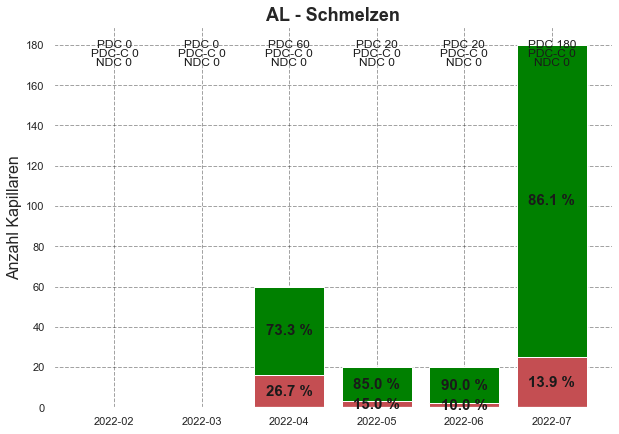

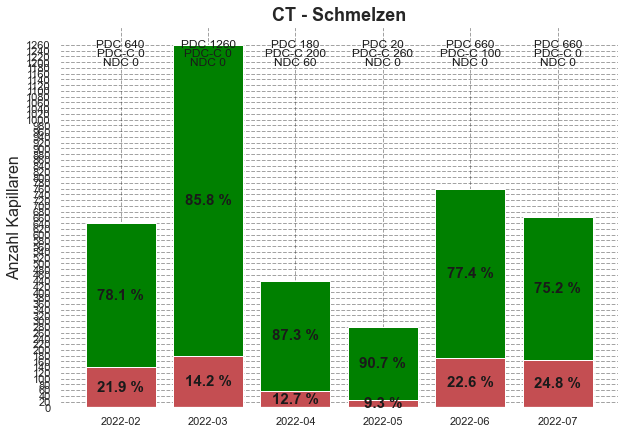

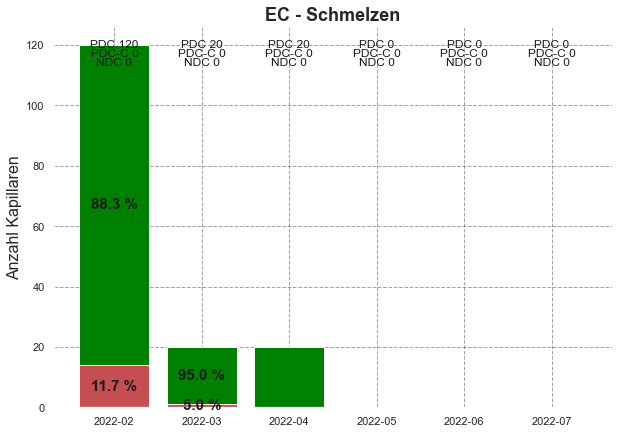

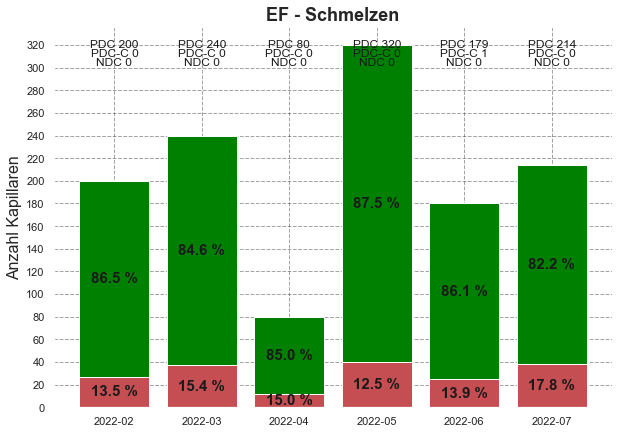

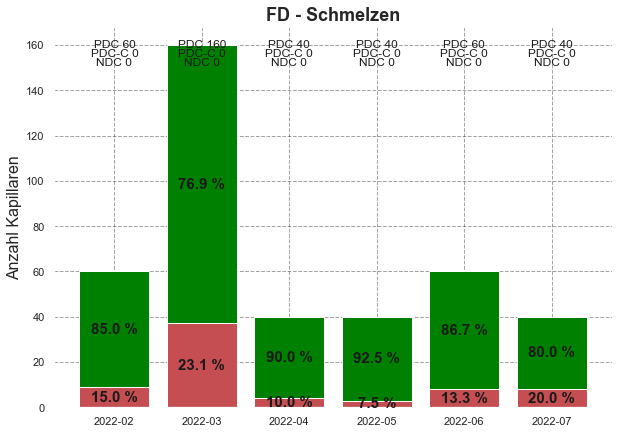

...

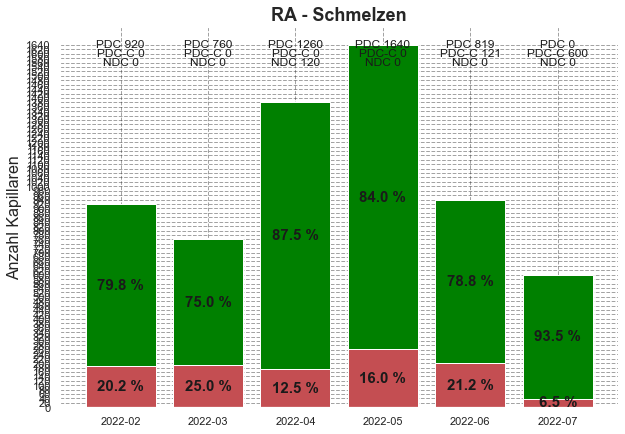

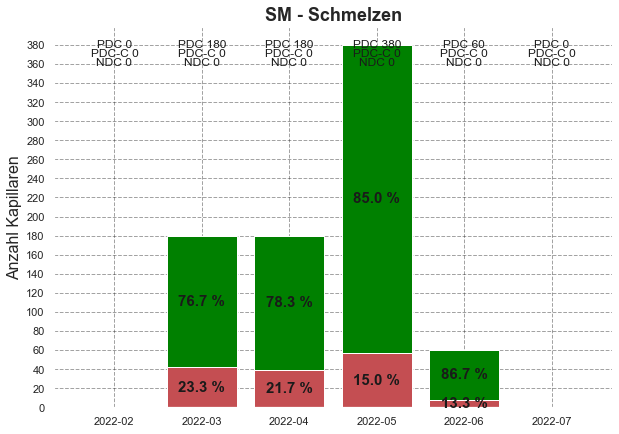

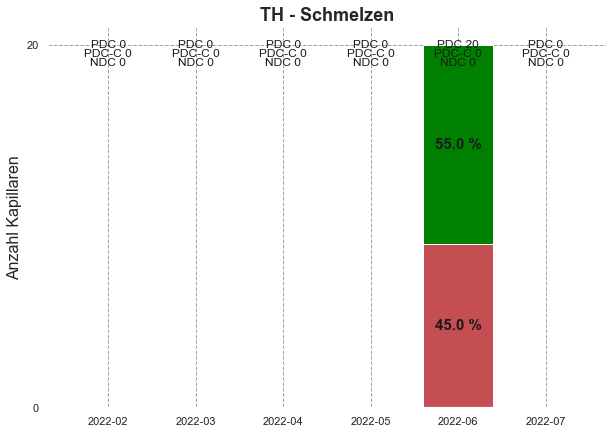

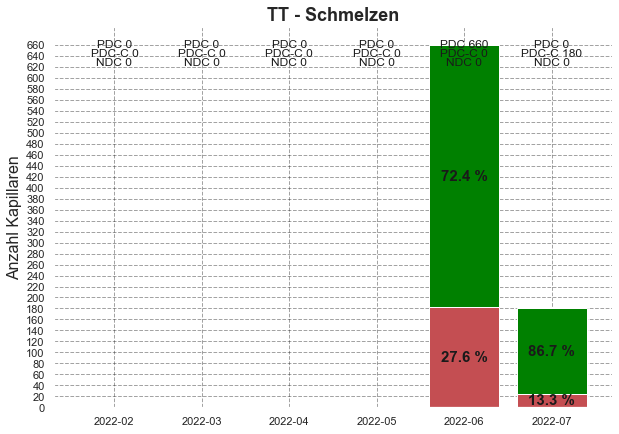

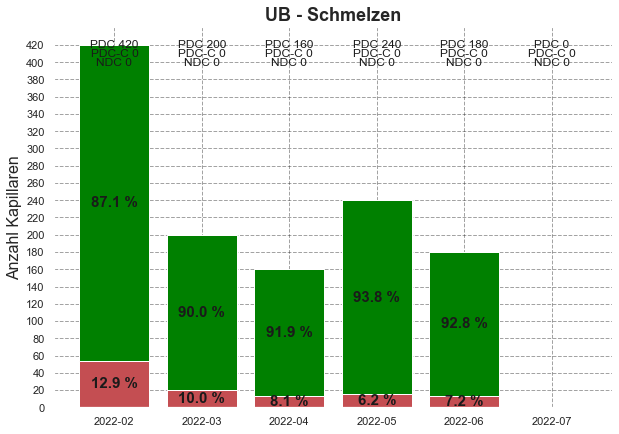

In [6]:
######################################################################################
############################ MELT OUTPUT PER OP AND MONTH ############################
######################################################################################

Schmelzen_OP_List_Set = sorted(list(set(Schmelzen_OP_List)))
Schmelzen_OP_List_Set = [op for op in Schmelzen_OP_List_Set if len(op) > 1]

df_SchmelzThroughPut = pd.DataFrame(columns=("Year_Month", "Schmelzen_Personal", "Kapillaren_geschmolzen", "# PDC", "# PDC-C", "# NDC", "Ausschuss", "Gutteile",  "Ausschuss [%]", "Gutteile [%]"))

SchmelzTimeList, SchmelzOPList, SchmelzOPKapsCountList = [], [], []
SchmelzOPKapsCountTypePDC, SchmelzOPKapsCountTypePDCC, SchmelzOPKapsCountTypeNDC = [], [], []
SchmelzOPKapsCountScrapList, SchmelzOPKapsCountGoodList = [], []
SchmelzOPKapsCountScrapPercList, SchmelzOPKapsCountGoodPercList = [], []

for month in range(len(LastNMonths)):
    for schmelzer in range(len(Schmelzen_OP_List_Set)):
        SchmelzTimeList.append(LastNMonths[month])
        SchmelzOPList.append(Schmelzen_OP_List_Set[schmelzer])
        KapCount_perOPmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer])])
        KapCountTypePDC_perOPmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) & (df_DB_trunc["Familie"]=="PDC")])
        KapCountTypePDCC_perOPmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) & (df_DB_trunc["Familie"]=="PDC-C")])
        KapCountTypeNDC_perOPmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) & (df_DB_trunc["Familie"]=="NDC")])
        SchmelzOPKapsCountList.append(KapCount_perOPmonth)
        
        # Check amount of scrapped capillaries for melting-reasons (NS1:V, NS1:S, NS1:eV)
        df_checkScrap = df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) 
                                     & (df_DB_trunc["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                                     & (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==3) 
                                     & ((df_DB_trunc["Defekt_Grund_ID"]==6) 
                                        | (df_DB_trunc["Defekt_Grund_ID"]==7) 
                                        | (df_DB_trunc["Defekt_Grund_ID"]==9))]
        MeltScrap = len(df_checkScrap)
        # Calculate scrap rate from above amount
        if KapCount_perOPmonth != 0:
            MeltScrapPerc = np.around((MeltScrap/KapCount_perOPmonth)*100,1)
        else:
            MeltScrapPerc = 0
        # Calculate good parts 
        MeltGoodPerc = 100 - MeltScrapPerc
        # Append results to dataframe
        SchmelzOPKapsCountGoodList.append(KapCount_perOPmonth-MeltScrap)
        SchmelzOPKapsCountScrapList.append(KapCount_perOPmonth-(KapCount_perOPmonth-MeltScrap))
        SchmelzOPKapsCountScrapPercList.append(MeltScrapPerc)
        SchmelzOPKapsCountGoodPercList.append(MeltGoodPerc)
        SchmelzOPKapsCountTypePDC.append(KapCountTypePDC_perOPmonth)
        SchmelzOPKapsCountTypePDCC.append(KapCountTypePDCC_perOPmonth)
        SchmelzOPKapsCountTypeNDC.append(KapCountTypeNDC_perOPmonth)
        
df_SchmelzThroughPut["Year_Month"] = SchmelzTimeList
df_SchmelzThroughPut["Schmelzen_Personal"] = SchmelzOPList
df_SchmelzThroughPut["Kapillaren_geschmolzen"] = SchmelzOPKapsCountList
df_SchmelzThroughPut["Ausschuss"] = SchmelzOPKapsCountScrapList
df_SchmelzThroughPut["Gutteile"] = SchmelzOPKapsCountGoodList
df_SchmelzThroughPut["Ausschuss [%]"] = SchmelzOPKapsCountScrapPercList
df_SchmelzThroughPut["Gutteile [%]"] = SchmelzOPKapsCountGoodPercList
df_SchmelzThroughPut["# PDC"] = SchmelzOPKapsCountTypePDC
df_SchmelzThroughPut["# PDC-C"] = SchmelzOPKapsCountTypePDCC
df_SchmelzThroughPut["# NDC"] = SchmelzOPKapsCountTypeNDC
#df_SchmelzThroughPut = df_SchmelzThroughPut[df_SchmelzThroughPut["Kapillaren_geschmolzen"]!=0].reset_index(drop=True)


for schmelzer in range(len(Schmelzen_OP_List_Set)):
    xdata1 = df_SchmelzThroughPut[df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]]["Year_Month"]
    ydata1 = df_SchmelzThroughPut[df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]]["Kapillaren_geschmolzen"]
    xdata2 = df_SchmelzThroughPut[df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]]["Year_Month"]
    ydata2 = df_SchmelzThroughPut[df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]]["Ausschuss"]
    if max(ydata1) != 0 and max(ydata2) != 0:
    
        # Config
        plt.figure(figsize=(10,7))
        plt.rcParams['axes.facecolor'] = 'white'
        plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
        plt.title(Schmelzen_OP_List_Set[schmelzer] + " - Schmelzen", fontsize=18, weight="bold")
        # Plotting data
        plt.bar(xdata1, ydata1, color="green")
        plt.bar(xdata2, ydata2, color="r")
        # Axis handling
        plt.ylabel("Anzahl Kapillaren", size=16)
        plt.yticks(list(range(0, np.amax(df_SchmelzThroughPut[df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]]["Kapillaren_geschmolzen"])+10, 20)))
        # Annotations
        for time in range(len(LastNMonths)):
            ScrapXstring = str(float(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                             & (df_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["Ausschuss [%]"])) + " %"
            ScrapYvalue = max(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                             & (df_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["Ausschuss"])/2
            GoodXstring = str(float(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                             & (df_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["Gutteile [%]"])) + " %"
            GoodYvalue = ScrapYvalue + max(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                             & (df_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["Kapillaren_geschmolzen"])/2
            # Ausschusse
            if ScrapYvalue != 0:
                plt.annotate(ScrapXstring, (time, ScrapYvalue) ,fontsize=15, ha="center", va="center", color="k", weight="bold")
                plt.annotate(GoodXstring, (time, GoodYvalue) ,fontsize=15, ha="center", va="center", color="k", weight="bold")

            maxY = max(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer])]["Kapillaren_geschmolzen"])

            CountPDCstring = "PDC " + str(int(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                             & (df_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["# PDC"]))
            CountPDCCstring = "PDC-C " + str(int(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                             & (df_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["# PDC-C"]))
            CountNDCstring = "NDC " + str(int(df_SchmelzThroughPut[(df_SchmelzThroughPut["Schmelzen_Personal"]==Schmelzen_OP_List_Set[schmelzer]) 
                             & (df_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["# NDC"]))

            #if len(CountPDCstring) > 5:
            plt.annotate(CountPDCstring, (time, maxY) ,fontsize=12, ha="center", va="center", color="k")
            #elif len(CountPDCCstring) > 5:
            plt.annotate(CountPDCCstring, (time, maxY-(maxY/40)) ,fontsize=12, ha="center", va="center", color="k")
            #elif len(CountNDCstring) > 5:
            plt.annotate(CountNDCstring, (time, maxY-(maxY/20)) ,fontsize=12, ha="center", va="center", color="k")

        plt.savefig(savePath_MD_TP_Melt + "Schmelzleistung_" + Schmelzen_OP_List_Set[schmelzer] + ".jpg", dpi=300, bbox_inches="tight")

        plt.show()
    else:
        pass

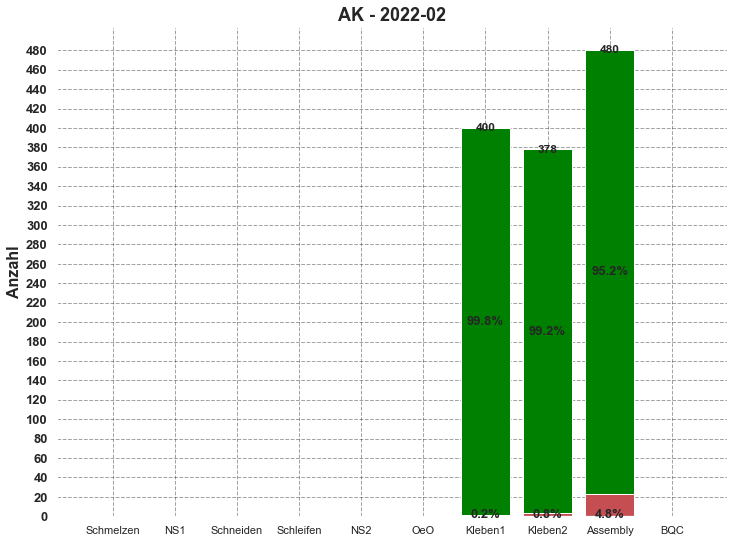

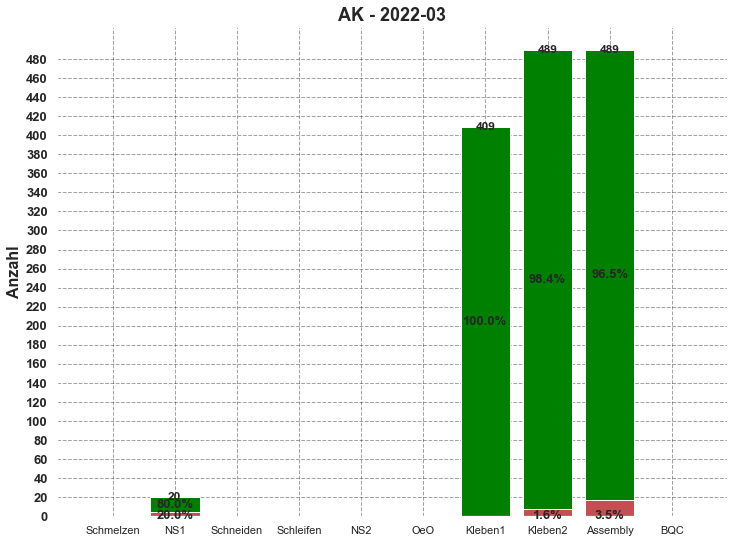

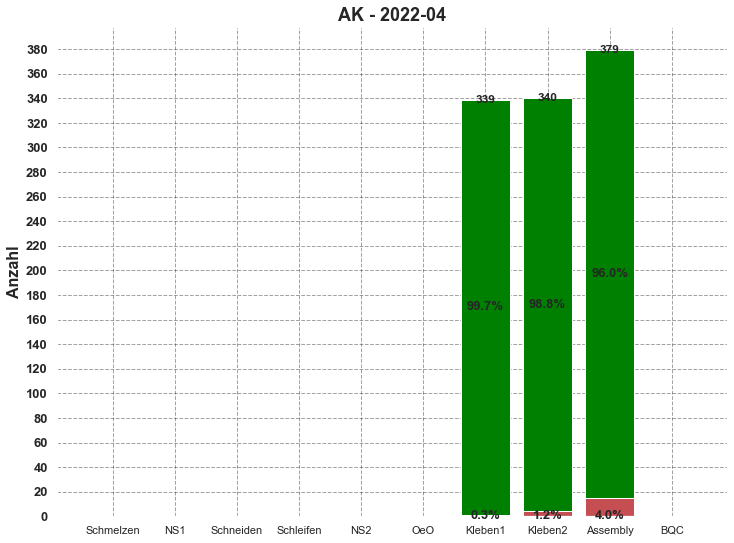

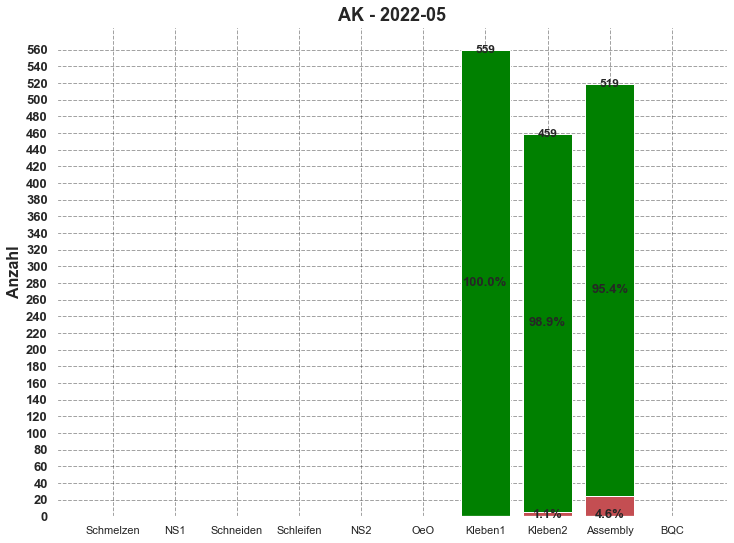

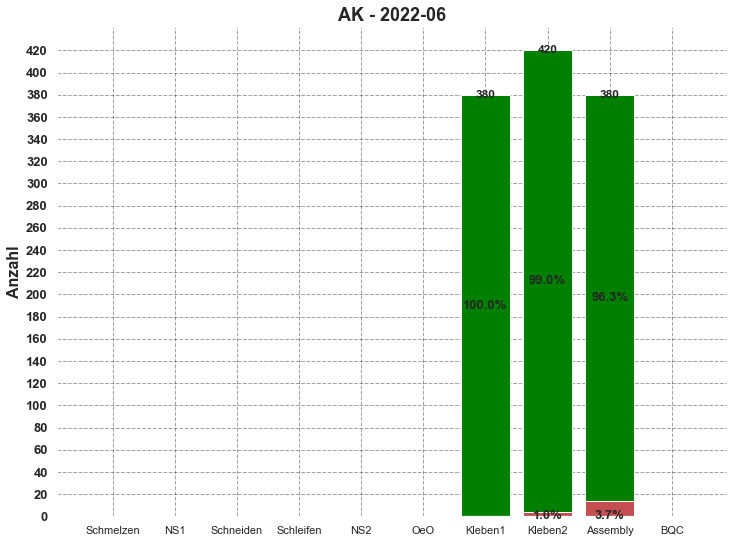

...

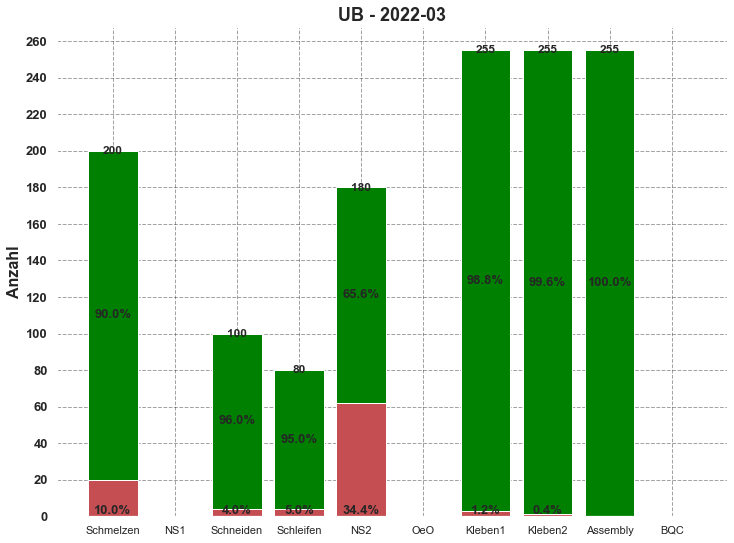

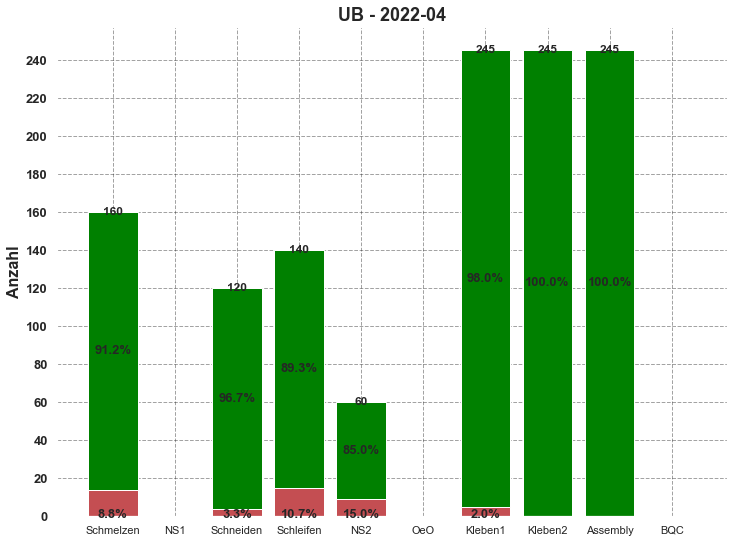

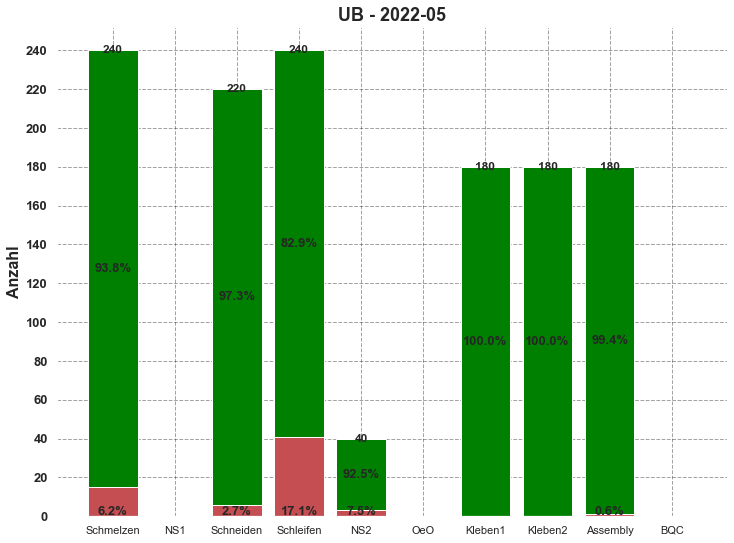

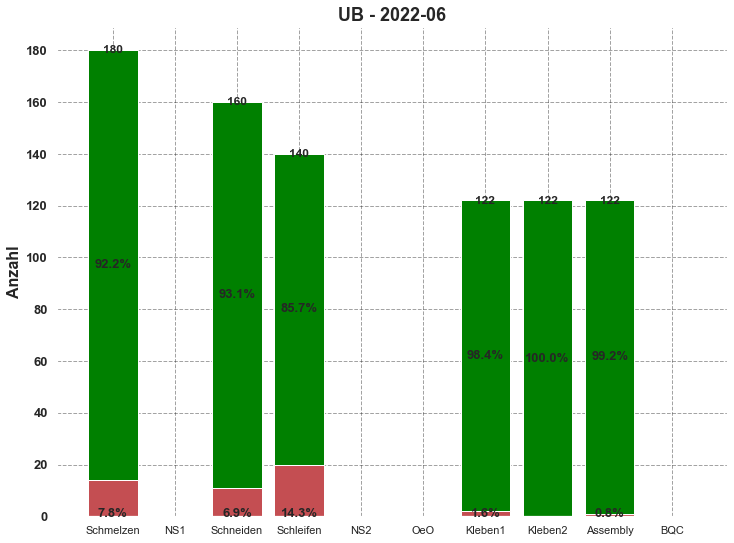

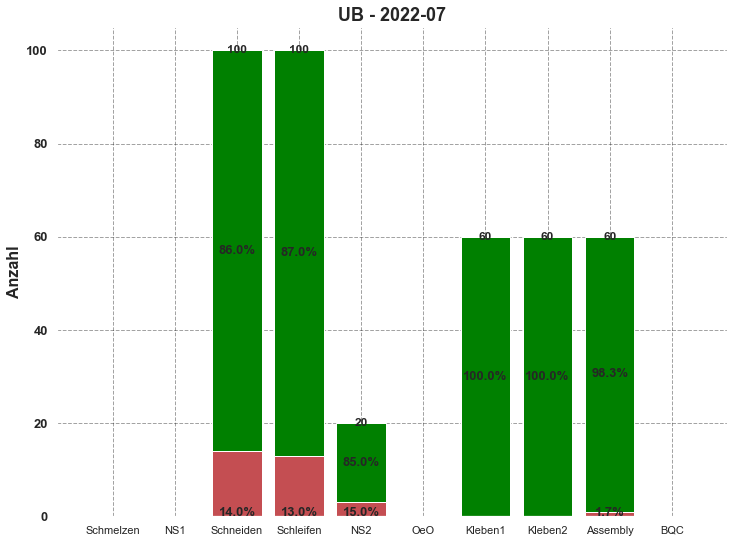

In [7]:
# Create empty dataframe to be populated with all needed data
df_TotalThroughPut = pd.DataFrame(
    columns=("Year_Month", "Personal", 
             "Schmelzen", "Schmelzen_Ausschuss", "Schmelzen_Gutteile",  "Schmelzen_Ausschuss [%]", "Schmelzen_Gutteile [%]",
            "NS1", "NS1_Ausschuss", "NS1_Gutteile",  "NS1_Ausschuss [%]", "NS1_Gutteile [%]",
            "Schneiden", "Schneiden_Ausschuss", "Schneiden_Gutteile",  "Schneiden_Ausschuss [%]", "Schneiden_Gutteile [%]",
            "Schleifen", "Schleifen_Ausschuss", "Schleifen_Gutteile",  "Schleifen_Ausschuss [%]", "Schleifen_Gutteile [%]",
            "NS2", "NS2_Ausschuss", "NS2_Gutteile",  "NS2_Ausschuss [%]", "NS2_Gutteile [%]",
            "OeO", "OeO_Ausschuss", "OeO_Gutteile",  "OeO_Ausschuss [%]", "OeO_Gutteile [%]",
            "K1", "K1_Ausschuss", "K1_Gutteile",  "K1_Ausschuss [%]", "K1_Gutteile [%]",
            "K2", "K2_Ausschuss", "K2_Gutteile",  "K2_Ausschuss [%]", "K2_Gutteile [%]",
            "Ass", "Ass_Ausschuss", "Ass_Gutteile",  "Ass_Ausschuss [%]", "Ass_Gutteile [%]",
            "BQC", "BQC_Ausschuss", "BQC_Gutteile",  "BQC_Ausschuss [%]", "BQC_Gutteile [%]"))

### Assign values to lists that will make up dataframe
# Create empty lists to be populated
GeneralTimeList, GeneralOPList = [], []
Schmelzen_List, Schmelzen_Ausschuss_List, Schmelzen_Gutteile_List, Schmelzen_Ausschuss_Perc_List, Schmelzen_Gutteile_Perc_List = [], [], [], [], []
NS1_List, NS1_Ausschuss_List ,NS1_Gutteile_List ,NS1_Ausschuss_Perc_List, NS1_Gutteile_Perc_List = [], [], [], [], []
Schneiden_List, Schneiden_Ausschuss_List ,Schneiden_Gutteile_List, Schneiden_Ausschuss_Perc_List, Schneiden_Gutteile_Perc_List = [], [], [], [], []
Schleifen_List, Schleifen_Ausschuss_List, Schleifen_Gutteile_List ,Schleifen_Ausschuss_Perc_List, Schleifen_Gutteile_Perc_List = [], [], [], [], []
NS2_List, NS2_Ausschuss_List, NS2_Gutteile_List, NS2_Ausschuss_Perc_List, NS2_Gutteile_Perc_List = [], [], [], [], []
OeO_List, OeO_Ausschuss_List, OeO_Gutteile_List, OeO_Ausschuss_Perc_List, OeO_Gutteile_Perc_List = [], [], [], [], []
K1_List, K1_Ausschuss_List, K1_Gutteile_List, K1_Ausschuss_Perc_List, K1_Gutteile_Perc_List = [], [], [], [], []
K2_List, K2_Ausschuss_List, K2_Gutteile_List, K2_Ausschuss_Perc_List, K2_Gutteile_Perc_List = [], [], [], [], []
Ass_List, Ass_Ausschuss_List, Ass_Gutteile_List, Ass_Ausschuss_Perc_List, Ass_Gutteile_Perc_List = [], [], [], [], []
BQC_List, BQC_Ausschuss_List, BQC_Gutteile_List, BQC_Ausschuss_Perc_List, BQC_Gutteile_Perc_List = [], [], [], [], []

for month in range(len(LastNMonths)):
    for op in range(len(OPs_All_List)):
        GeneralTimeList.append(LastNMonths[month])
        GeneralOPList.append(OPs_All_List[op])
        ### Number of capillaries handled by OP in each production step
        # Count
        Schmelzen_Count = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Personal"]==OPs_All_List[op])])
        NS1_Count = len(df_DB_trunc[(df_DB_trunc["NS1_Month"]==LastNMonths[month]) & (df_DB_trunc["NS1_Personal"]==OPs_All_List[op])])
        Schneiden_Count = len(df_DB_trunc[(df_DB_trunc["Schneiden_Month"]==LastNMonths[month]) & (df_DB_trunc["Schneiden_Personal"]==OPs_All_List[op])])
        Schleifen_Count = len(df_DB_trunc[(df_DB_trunc["Schleifen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schleifen_Personal"]==OPs_All_List[op])])
        NS2_Count = len(df_DB_trunc[(df_DB_trunc["NS2_Month"]==LastNMonths[month]) & (df_DB_trunc["NS2_Personal"]==OPs_All_List[op])])
        OeO_Count = len(df_DB_trunc[(df_DB_trunc["OeO_Month"]==LastNMonths[month]) & (df_DB_trunc["OeO_Personal"]==OPs_All_List[op])])
        K1_Count = len(df_DB_trunc[(df_DB_trunc["K1_Month"]==LastNMonths[month]) & (df_DB_trunc["Kleben1_Personal"]==OPs_All_List[op])])
        K2_Count = len(df_DB_trunc[(df_DB_trunc["K2_Month"]==LastNMonths[month]) & (df_DB_trunc["Kleben2_Personal"]==OPs_All_List[op])])
        Ass_Count = len(df_DB_trunc[(df_DB_trunc["Ass_Month"]==LastNMonths[month]) & (df_DB_trunc["Assembley_Personal"]==OPs_All_List[op])])
        BQC_Count = len(df_DB_trunc[(df_DB_trunc["BQC_Month"]==LastNMonths[month]) & (df_DB_trunc["BQC_Personal"]==OPs_All_List[op])])

        # Append
        Schmelzen_List.append(Schmelzen_Count)
        NS1_List.append(NS1_Count)
        Schneiden_List.append(Schneiden_Count)
        Schleifen_List.append(Schleifen_Count)
        NS2_List.append(NS2_Count)
        OeO_List.append(OeO_Count)
        K1_List.append(K1_Count)
        K2_List.append(K2_Count)
        Ass_List.append(Ass_Count)
        BQC_List.append(BQC_Count)
        
        ### Amount of scrap/good parts handled by OP in each production step
        # Count scraps
        Schmelzen_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & 
                                                 (df_DB_trunc["Schmelzen_Personal"]==OPs_All_List[op]) & 
                                                (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==3) & 
                                                (df_DB_trunc["Defekt_Grund_ID"]!=1)]) # NS1:eV
        NS1_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["NS1_Month"]==LastNMonths[month]) & 
                                                 (df_DB_trunc["NS1_Personal"]==OPs_All_List[op]) & 
                                                (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==3) & 
                                                (df_DB_trunc["Defekt_Grund_ID"]!=1)]) # NS1:A
        Schneiden_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["Schneiden_Month"]==LastNMonths[month]) & 
                                                 (df_DB_trunc["Schneiden_Personal"]==OPs_All_List[op]) & 
                                                (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==4) & 
                                                (df_DB_trunc["Defekt_Grund_ID"]!=1)])
        Schleifen_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["Schleifen_Month"]==LastNMonths[month]) & 
                                                 (df_DB_trunc["Schleifen_Personal"]==OPs_All_List[op]) & 
                                                (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==5) & 
                                                (df_DB_trunc["Defekt_Grund_ID"]!=1)])
        NS2_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["NS2_Month"]==LastNMonths[month]) & 
                                                 (df_DB_trunc["NS2_Personal"]==OPs_All_List[op]) & 
                                                (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==6) & 
                                                (df_DB_trunc["Defekt_Grund_ID"]!=1)])
        OeO_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["OeO_Month"]==LastNMonths[month]) & 
                                                 (df_DB_trunc["OeO_Personal"]==OPs_All_List[op]) & 
                                                (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==7) & 
                                                (df_DB_trunc["Defekt_Grund_ID"]!=1)])
        K1_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["K1_Month"]==LastNMonths[month]) & 
                                                 (df_DB_trunc["Kleben1_Personal"]==OPs_All_List[op]) &
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==8) & 
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]!=1)])
        K2_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["K2_Month"]==LastNMonths[month]) & 
                                         (df_DB_trunc["Kleben2_Personal"]==OPs_All_List[op]) &
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==9) &
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]!=1)])
        Ass_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["Ass_Month"]==LastNMonths[month]) & 
                                         (df_DB_trunc["Assembley_Personal"]==OPs_All_List[op]) &
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==10) &
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]!=1)])        
        BQC_Count_Scrap = len(df_DB_trunc[(df_DB_trunc["BQC_Month"]==LastNMonths[month]) & 
                                         (df_DB_trunc["BQC_Personal"]==OPs_All_List[op]) &
                                         ((df_DB_trunc["Defekt_Arbeitsschritt_ID"]==13) | 
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==14)) &
                                         (df_DB_trunc["Defekt_Arbeitsschritt_ID"]!=1)])        
        
        
        # Append scraps
        Schmelzen_Ausschuss_List.append(Schmelzen_Count_Scrap)
        NS1_Ausschuss_List.append(NS1_Count_Scrap)
        Schneiden_Ausschuss_List.append(Schneiden_Count_Scrap)
        Schleifen_Ausschuss_List.append(Schleifen_Count_Scrap)
        NS2_Ausschuss_List.append(NS2_Count_Scrap)
        OeO_Ausschuss_List.append(OeO_Count_Scrap)
        K1_Ausschuss_List.append(K1_Count_Scrap)
        K2_Ausschuss_List.append(K2_Count_Scrap)
        Ass_Ausschuss_List.append(Ass_Count_Scrap)
        BQC_Ausschuss_List.append(BQC_Count_Scrap)
        
        # Count good parts
        Schmelzen_Count_Good = Schmelzen_Count - Schmelzen_Count_Scrap
        NS1_Count_Good = NS1_Count - NS1_Count_Scrap
        Schneiden_Count_Good = Schneiden_Count - Schneiden_Count_Scrap
        Schleifen_Count_Good = Schleifen_Count - Schleifen_Count_Scrap
        NS2_Count_Good = NS2_Count - NS2_Count_Scrap
        OeO_Count_Good = OeO_Count - OeO_Count_Scrap
        K1_Count_Good = K1_Count - K1_Count_Scrap
        K2_Count_Good = K2_Count - K2_Count_Scrap
        Ass_Count_Good = Ass_Count - Ass_Count_Scrap
        BQC_Count_Good = BQC_Count - BQC_Count_Scrap
        
        # Append good parts
        Schmelzen_Gutteile_List.append(Schmelzen_Count_Good)
        NS1_Gutteile_List.append(NS1_Count_Good)
        Schneiden_Gutteile_List.append(Schneiden_Count_Good)
        Schleifen_Gutteile_List.append(Schleifen_Count_Good)
        NS2_Gutteile_List.append(NS2_Count_Good)
        OeO_Gutteile_List.append(OeO_Count_Good)
        K1_Gutteile_List.append(K1_Count_Good)
        K2_Gutteile_List.append(K2_Count_Good)
        Ass_Gutteile_List.append(Ass_Count_Good)
        BQC_Gutteile_List.append(BQC_Count_Good)
        
        ### Calculate scrap/good parts rates
        # Calculate scrap rates
        if Schmelzen_Count != 0:
            Schmelzen_Count_Scrap_Perc = np.around((Schmelzen_Count_Scrap/Schmelzen_Count)*100,1)
        else:
            Schmelzen_Count_Scrap_Perc = 0
        if NS1_Count != 0:
            NS1_Count_Scrap_Perc = np.around((NS1_Count_Scrap/NS1_Count)*100,1)
        else:
            NS1_Count_Scrap_Perc = 0
        if Schneiden_Count != 0:
            Schneiden_Count_Scrap_Perc = np.around((Schneiden_Count_Scrap/Schneiden_Count)*100,1)
        else:
            Schneiden_Count_Scrap_Perc = 0
        if Schleifen_Count != 0:
            Schleifen_Count_Scrap_Perc = np.around((Schleifen_Count_Scrap/Schleifen_Count)*100,1)
        else:
            Schleifen_Count_Scrap_Perc = 0
        if NS2_Count != 0:
            NS2_Count_Scrap_Perc = np.around((NS2_Count_Scrap/NS2_Count)*100,1)
        else:
            NS2_Count_Scrap_Perc = 0
        if OeO_Count != 0:
            OeO_Count_Scrap_Perc = np.around((OeO_Count_Scrap/OeO_Count)*100,1)
        else:
            OeO_Count_Scrap_Perc = 0
        if K1_Count != 0:
            K1_Count_Scrap_Perc = np.around((K1_Count_Scrap/K1_Count)*100,1)
        else:
            K1_Count_Scrap_Perc = 0
        if K2_Count != 0:
            K2_Count_Scrap_Perc = np.around((K2_Count_Scrap/K2_Count)*100,1)
        else:
            K2_Count_Scrap_Perc = 0
        if Ass_Count != 0:
            Ass_Count_Scrap_Perc = np.around((Ass_Count_Scrap/Ass_Count)*100,1)
        else:
            Ass_Count_Scrap_Perc = 0
        if BQC_Count != 0:
            BQC_Count_Scrap_Perc = np.around((BQC_Count_Scrap/BQC_Count)*100,1)
        else:
            BQC_Count_Scrap_Perc = 0

        # Append scrap rates
        Schmelzen_Ausschuss_Perc_List.append(Schmelzen_Count_Scrap_Perc)
        NS1_Ausschuss_Perc_List.append(NS1_Count_Scrap_Perc)
        Schneiden_Ausschuss_Perc_List.append(Schneiden_Count_Scrap_Perc)
        Schleifen_Ausschuss_Perc_List.append(Schleifen_Count_Scrap_Perc)
        NS2_Ausschuss_Perc_List.append(NS2_Count_Scrap_Perc)
        OeO_Ausschuss_Perc_List.append(OeO_Count_Scrap_Perc)
        K1_Ausschuss_Perc_List.append(K1_Count_Scrap_Perc)
        K2_Ausschuss_Perc_List.append(K2_Count_Scrap_Perc)
        Ass_Ausschuss_Perc_List.append(Ass_Count_Scrap_Perc)
        BQC_Ausschuss_Perc_List.append(BQC_Count_Scrap_Perc)
        # Calculate good parts rates
        Schmelzen_Count_Good_Perc = 100 - Schmelzen_Count_Scrap_Perc
        NS1_Count_Good_Perc = 100 - NS1_Count_Scrap_Perc
        Schneiden_Count_Good_Perc = 100 - Schneiden_Count_Scrap_Perc
        Schleifen_Count_Good_Perc = 100 - Schleifen_Count_Scrap_Perc
        NS2_Count_Good_Perc = 100 - NS2_Count_Scrap_Perc
        OeO_Count_Good_Perc = 100 - OeO_Count_Scrap_Perc
        K1_Count_Good_Perc = 100 - K1_Count_Scrap_Perc
        K2_Count_Good_Perc = 100 - K2_Count_Scrap_Perc
        Ass_Count_Good_Perc = 100 - Ass_Count_Scrap_Perc
        BQC_Count_Good_Perc = 100 - BQC_Count_Scrap_Perc
        
        # Append good parts rates
        Schmelzen_Gutteile_Perc_List.append(Schmelzen_Count_Good_Perc)
        NS1_Gutteile_Perc_List.append(NS1_Count_Good_Perc)
        Schneiden_Gutteile_Perc_List.append(Schneiden_Count_Good_Perc)
        Schleifen_Gutteile_Perc_List.append(Schleifen_Count_Good_Perc)
        NS2_Gutteile_Perc_List.append(NS2_Count_Good_Perc)
        OeO_Gutteile_Perc_List.append(OeO_Count_Good_Perc)
        K1_Gutteile_Perc_List.append(K1_Count_Good_Perc)
        K2_Gutteile_Perc_List.append(K2_Count_Good_Perc)
        Ass_Gutteile_Perc_List.append(Ass_Count_Good_Perc)
        BQC_Gutteile_Perc_List.append(BQC_Count_Good_Perc)
        
# Ascribe lists to populate dataframe columns
df_TotalThroughPut["Year_Month"] = GeneralTimeList
df_TotalThroughPut["Personal"] = GeneralOPList
df_TotalThroughPut["Schmelzen"] = Schmelzen_List
df_TotalThroughPut["Schmelzen_Ausschuss"] = Schmelzen_Ausschuss_List
df_TotalThroughPut["Schmelzen_Gutteile"] = Schmelzen_Gutteile_List
df_TotalThroughPut["Schmelzen_Ausschuss [%]"] = Schmelzen_Ausschuss_Perc_List
df_TotalThroughPut["Schmelzen_Gutteile [%]"] = Schmelzen_Gutteile_Perc_List
df_TotalThroughPut["NS1"] = NS1_List
df_TotalThroughPut["NS1_Ausschuss"] = NS1_Ausschuss_List
df_TotalThroughPut["NS1_Gutteile"] = NS1_Gutteile_List
df_TotalThroughPut["NS1_Ausschuss [%]"] = NS1_Ausschuss_Perc_List
df_TotalThroughPut["NS1_Gutteile [%]"] = NS1_Gutteile_Perc_List
df_TotalThroughPut["Schneiden"] = Schneiden_List
df_TotalThroughPut["Schneiden_Ausschuss"] = Schneiden_Ausschuss_List
df_TotalThroughPut["Schneiden_Gutteile"] = Schneiden_Gutteile_List
df_TotalThroughPut["Schneiden_Ausschuss [%]"] = Schneiden_Ausschuss_Perc_List
df_TotalThroughPut["Schneiden_Gutteile [%]"] = Schneiden_Gutteile_Perc_List
df_TotalThroughPut["Schleifen"] = Schleifen_List
df_TotalThroughPut["Schleifen_Ausschuss"] = Schleifen_Ausschuss_List
df_TotalThroughPut["Schleifen_Gutteile"] = Schleifen_Gutteile_List
df_TotalThroughPut["Schleifen_Ausschuss [%]"] = Schleifen_Ausschuss_Perc_List
df_TotalThroughPut["Schleifen_Gutteile [%]"] = Schleifen_Gutteile_Perc_List
df_TotalThroughPut["NS2"] = NS2_List
df_TotalThroughPut["NS2_Ausschuss"] = NS2_Ausschuss_List
df_TotalThroughPut["NS2_Gutteile"] = NS2_Gutteile_List
df_TotalThroughPut["NS2_Ausschuss [%]"] = NS2_Ausschuss_Perc_List
df_TotalThroughPut["NS2_Gutteile [%]"] = NS2_Gutteile_Perc_List
df_TotalThroughPut["OeO"] = OeO_List
df_TotalThroughPut["OeO_Ausschuss"] = OeO_Ausschuss_List
df_TotalThroughPut["OeO_Gutteile"] = OeO_Gutteile_List
df_TotalThroughPut["OeO_Ausschuss [%]"] = OeO_Ausschuss_Perc_List
df_TotalThroughPut["OeO_Gutteile [%]"] = OeO_Gutteile_Perc_List
df_TotalThroughPut["K1"] = K1_List
df_TotalThroughPut["K1_Ausschuss"] = K1_Ausschuss_List
df_TotalThroughPut["K1_Gutteile"] = K1_Gutteile_List
df_TotalThroughPut["K1_Ausschuss [%]"] = K1_Ausschuss_Perc_List
df_TotalThroughPut["K1_Gutteile [%]"] = K1_Gutteile_Perc_List
df_TotalThroughPut["K2"] = K2_List
df_TotalThroughPut["K2_Ausschuss"] = K2_Ausschuss_List
df_TotalThroughPut["K2_Gutteile"] = K2_Gutteile_List
df_TotalThroughPut["K2_Ausschuss [%]"] = K2_Ausschuss_Perc_List
df_TotalThroughPut["K2_Gutteile [%]"] = K2_Gutteile_Perc_List
df_TotalThroughPut["Ass"] = Ass_List
df_TotalThroughPut["Ass_Ausschuss"] = Ass_Ausschuss_List
df_TotalThroughPut["Ass_Gutteile"] = Ass_Gutteile_List
df_TotalThroughPut["Ass_Ausschuss [%]"] = Ass_Ausschuss_Perc_List
df_TotalThroughPut["Ass_Gutteile [%]"] = Ass_Gutteile_Perc_List
df_TotalThroughPut["BQC"] = BQC_List
df_TotalThroughPut["BQC_Ausschuss"] = BQC_Ausschuss_List
df_TotalThroughPut["BQC_Gutteile"] = BQC_Gutteile_List
df_TotalThroughPut["BQC_Ausschuss [%]"] = BQC_Ausschuss_Perc_List
df_TotalThroughPut["BQC_Gutteile [%]"] = BQC_Gutteile_Perc_List

###############################################################
### PLOTTING THROUGHPUTS OF OP PER ARBEITSSCHRITT AND MONTH ###

xlabels = ["Schmelzen", "NS1", "Schneiden", "Schleifen", "NS2", "OeO", 
           "Kleben1", "Kleben2", "Assembly", "BQC"]
GoodPartsCount_iterList = [2, 7, 12, 17, 22, 27, 32, 37, 42, 47]
BadPartsCount_iterList = [3, 8, 13, 18, 23, 28, 33, 38, 43, 48]
BadPartsPerc_iterList = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
GoodPartsPerc_iterList = [6, 11, 16, 21, 26, 31, 36, 41, 46, 51]


for op in range(len(OPs_All_List)):
    df_select = df_TotalThroughPut[df_TotalThroughPut["Personal"]==OPs_All_List[op]]
    for month in range(len(LastNMonths)):
        ydata1 = list(df_select.iloc[month,GoodPartsCount_iterList]) # Total count
        ydata2 = list(df_select.iloc[month,BadPartsCount_iterList]) # Scrap count
        ydata3 = list(df_select.iloc[month,BadPartsPerc_iterList]) # Scrap rate
        ydata4 = list(df_select.iloc[month,GoodPartsPerc_iterList]) # IO rate
        
        if max(ydata1)!=0 and max(ydata2)!=0:
        
            fig, ax = plt.subplots(figsize=(12,9))

            plt.rcParams['axes.facecolor'] = 'white'
            plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
            plt.title(OPs_All_List[op] + " - " + LastNMonths[month], fontsize=18, weight="bold")

            ax = plt.bar(xlabels, ydata1, color="green")
            ax = plt.bar(xlabels, ydata2, color="r")

            # Axis handling
            plt.ylabel("Anzahl", weight="bold", size=16)
            plt.yticks(np.arange(0,max(ydata1)+10,20), weight="bold", size=13)
            #plt.xticks(indeces, weight="bold", rotation=45, size=14)
            
            # Annotations
            for x in range(len(xlabels)):
                # Total count
                if ydata1[x]!=0:
                    xpos = x
                    ypos = ydata1[x]
                    string = str(ypos)
                    plt.annotate(string, (xpos, ypos), size=12, weight="bold", va="center", ha="center")
                # IO rate
                if ydata1[x]!=0:
                    xpos = x
                    ypos = ydata2[x] + ((ydata1[x]-ydata2[x])/2)
                    string = str(ydata4[x])
                    plt.annotate(string + "%", (xpos, ypos), size=13, weight="bold", va="center", ha="center")
                # Scrap rate
                if ydata3[x]!=0:
                    xpos = x
                    ypos = 0 + (max(ydata2)/20)
                    string = str(ydata3[x])
                    plt.annotate(string + "%", (xpos, ypos), size=13, weight="bold", va="center", ha="center")
                                
            plt.savefig(savePath_OP_TP_General + "Auswertung_OP_Zeitraum_" + LastNMonths[month] + "_" + OPs_All_List[op] + ".jpg", dpi=300, bbox_inches="tight")
            plt.show()
        else:
            pass
        
### PLOTTING THROUGHPUTS OF OP PER ARBEITSSCHRITT AND MONTH ###
###############################################################

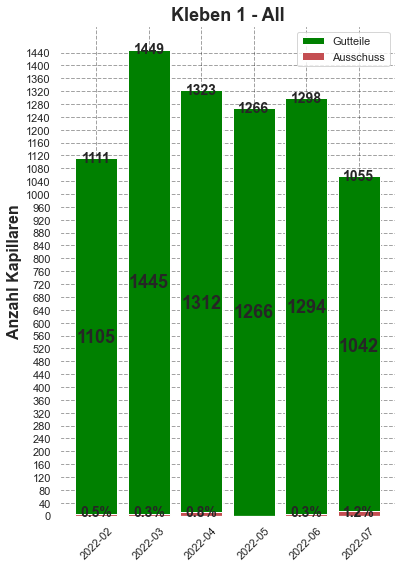

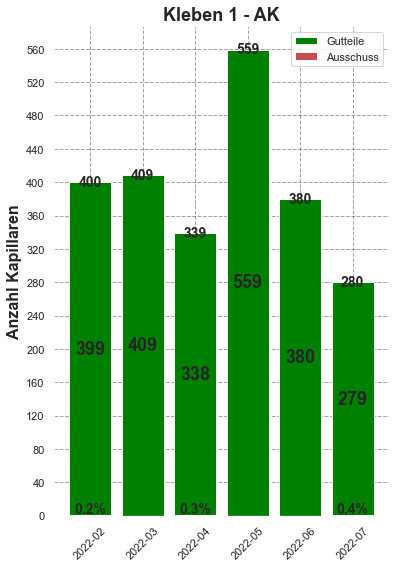

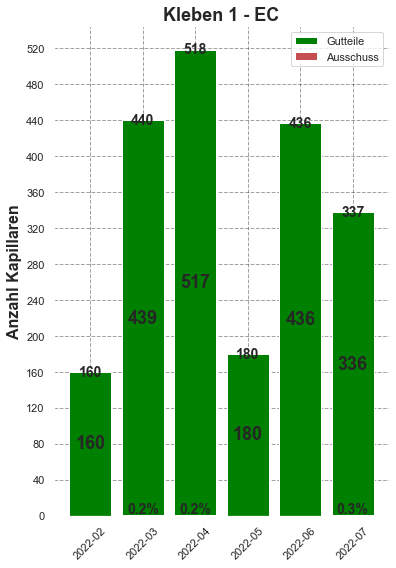

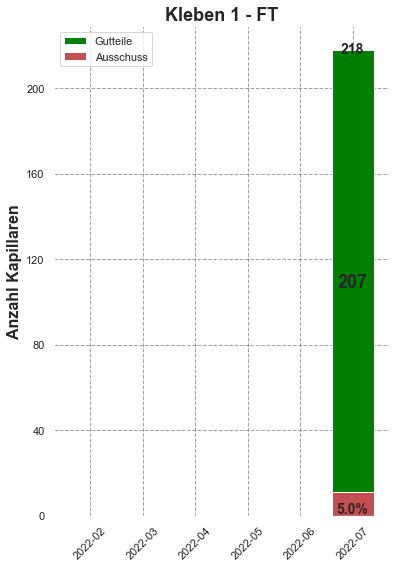

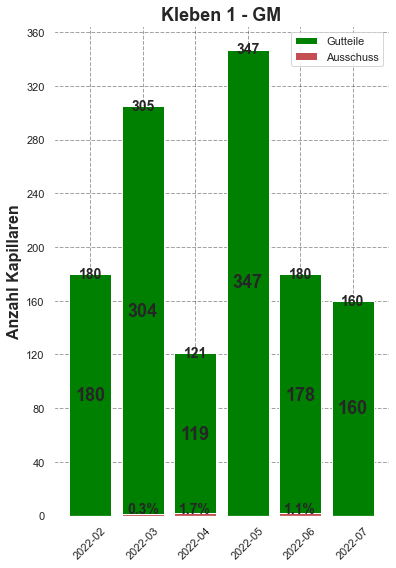

...

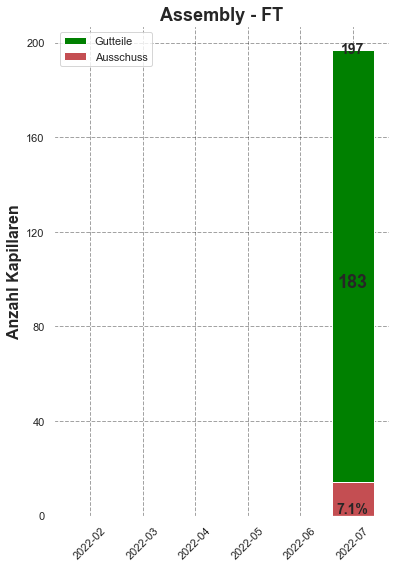

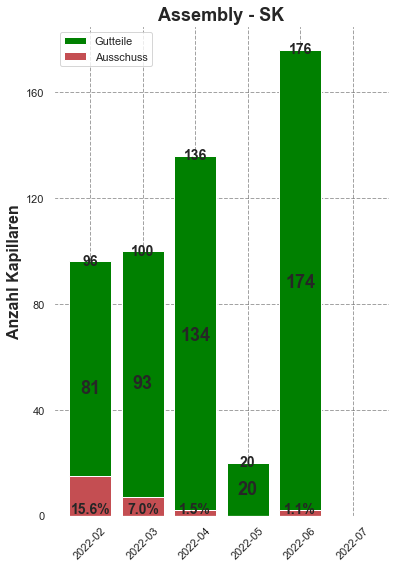

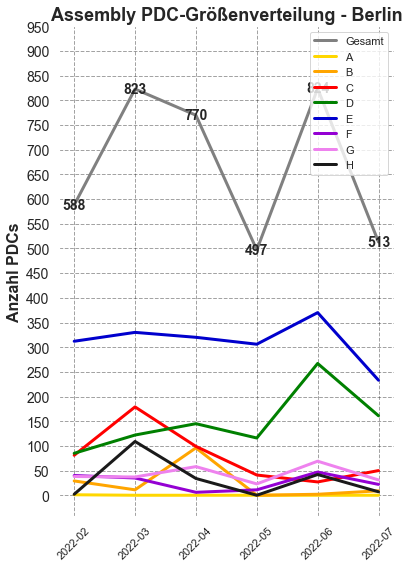

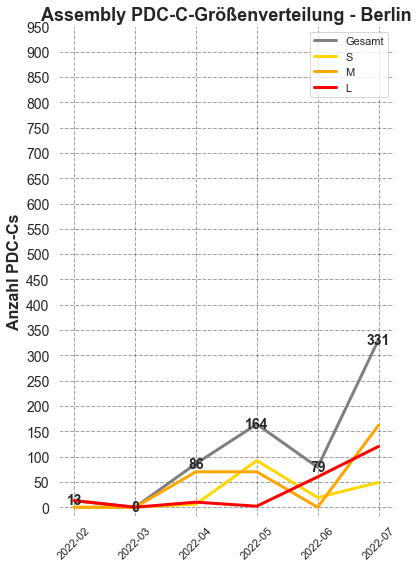

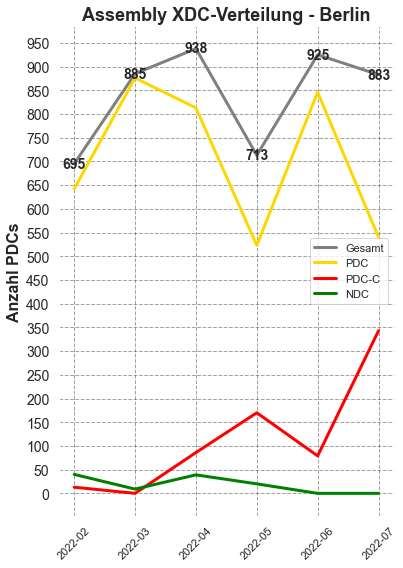

In [8]:
##############################################
### GENERAL BONDING & ASSEMBLY THROUGHPUTS ###

df_K12Ass_Total = df_DB_trunc[df_DB_trunc["Kleben1_Datum"].notnull()].reset_index(drop=True)
df_K12Ass_Dortmund = df_DB_trunc[(df_DB_trunc["Kleben1_Ort"]=="Dortmund") & 
                                (df_DB_trunc["Kleben1_Datum"].notnull())].reset_index(drop=True)
df_K12Ass_Berlin = df_DB_trunc[(df_DB_trunc["Kleben1_Ort"]=="Berlin") & 
                              df_DB_trunc["Kleben1_Datum"].notnull()].reset_index(drop=True)
df_DB_trunc_Kselect_List = [df_K12Ass_Total, df_K12Ass_Dortmund, df_K12Ass_Berlin]
df_DB_trunc_Kselect_Town = ["All", "Dortmund", "Berlin"]

for s in range(len(df_DB_trunc_Kselect_List)):
    
    df_K_Select = df_DB_trunc_Kselect_List[s]

    ### K1 pro Monat ###
    K1_Count, K2_Count, Ass_Count = [], [], []
    
    K1_ScrapCount, K2_ScrapCount, Ass_ScrapCount = [], [], []
    K1_ScrapRate, K2_ScrapRate, Ass_ScrapRate = [], [], []
    
    PDC_K1_Count, PDCC_K1_Count, NDC_K1_Count = [], [], []
    PDC_K2_Count, PDCC_K2_Count, NDC_K2_Count = [], [], []
    PDC_Ass_Count, PDCC_Ass_Count, NDC_Ass_Count = [], [], []
    PDC_Ass_ScrapCount, PDCC_Ass_ScrapCount, NDC_Ass_ScrapCount = [], [], []
    PDC_Ass_YieldCount, PDCC_Ass_YieldCount, NDC_Ass_YieldCount = [], [], []
    
    PDC_A_K1_Count, PDC_B_K1_Count, PDC_C_K1_Count, PDC_D_K1_Count = [], [], [], []
    PDC_E_K1_Count, PDC_F_K1_Count, PDC_G_K1_Count, PDC_H_K1_Count = [], [], [], []
    
    PDC_A_K2_Count, PDC_B_K2_Count, PDC_C_K2_Count, PDC_D_K2_Count = [], [], [], []
    PDC_E_K2_Count, PDC_F_K2_Count, PDC_G_K2_Count, PDC_H_K2_Count = [], [], [], []
    
    PDC_A_Ass_Count, PDC_B_Ass_Count, PDC_C_Ass_Count, PDC_D_Ass_Count = [], [], [], []
    PDC_E_Ass_Count, PDC_F_Ass_Count, PDC_G_Ass_Count, PDC_H_Ass_Count = [], [], [], []
    PDC_A_Ass_ScrapCount, PDC_B_Ass_ScrapCount = [], []
    PDC_C_Ass_ScrapCount, PDC_D_Ass_ScrapCount = [], []
    PDC_E_Ass_ScrapCount, PDC_F_Ass_ScrapCount = [], []
    PDC_G_Ass_ScrapCount, PDC_H_Ass_ScrapCount = [], []
    PDC_A_Ass_YieldCount, PDC_B_Ass_YieldCount = [], []
    PDC_C_Ass_YieldCount, PDC_D_Ass_YieldCount = [], []
    PDC_E_Ass_YieldCount, PDC_F_Ass_YieldCount = [], []
    PDC_G_Ass_YieldCount, PDC_H_Ass_YieldCount = [], []
    
    PDCC_S_Ass_Count, PDCC_M_Ass_Count, PDCC_L_Ass_Count = [], [], []
    PDCC_S_Ass_ScrapCount, PDCC_M_Ass_ScrapCount, PDCC_L_Ass_ScrapCount = [], [], []
    PDCC_S_Ass_YieldCount, PDCC_M_Ass_YieldCount, PDCC_L_Ass_YieldCount = [], [], []

    ### CHECK XDC COUNTS, SIZE DISTRIBUTIONS AND SCRAP RATES OF K1 / K2 / ASSEMBLY PER MONTH ###
    K1_OP_Set_Cleaned = [op for op in list(sorted(set(df_DB_trunc["Kleben1_Personal"].dropna()))) if op != "0"]
    for k1month in LastNMonths:
        # COUNT ALL XDCs IN K1
        K1_Count_Counter = len(df_K_Select[df_K_Select["K1_Month"]==k1month])
        K1_Count.append(K1_Count_Counter)
        # COUNT ALL XDCs SCRAP IN K1
        K1_ScrapCount_Counter = (len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
               (df_K_Select["Defekt_Arbeitsschritt_ID"]==8)]))
        K1_ScrapCount.append(K1_ScrapCount_Counter)
        # CALC SCRAPRATE OF ALL XDCs IN K1
        if K1_Count_Counter != 0:
            K1_ScrapRate_Counter = np.around((K1_ScrapCount_Counter/K1_Count_Counter)*100,1)
            K1_ScrapRate.append(K1_ScrapRate_Counter)
        else:
            K1_ScrapRate.append(0)
        # COUNT ALL PDCs / PDC-Cs / NDCs IN K1
        PDC_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC")])
        PDCC_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC-C")])
        NDC_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="NDC")])
        PDC_K1_Count.append(PDC_Count_Counter)
        PDCC_K1_Count.append(PDCC_Count_Counter)
        NDC_K1_Count.append(NDC_Count_Counter)
        # COUNT ALL PDCs OF CERTAIN SIZE IN K1
        PDC_A_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==1)])
        PDC_B_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==2)])   
        PDC_C_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==3)])
        PDC_D_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==4)])
        PDC_E_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==5)])
        PDC_F_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==6)])
        PDC_G_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==7)])
        PDC_H_K1_Count_Counter = len(df_K_Select[(df_K_Select["K1_Month"]==k1month) & 
                                    (df_K_Select["Familie"]=="PDC") & 
                                                (df_K_Select["Produktion_Groesse"]==8)])
        PDC_A_K1_Count.append(PDC_A_K1_Count_Counter)
        PDC_B_K1_Count.append(PDC_B_K1_Count_Counter)
        PDC_C_K1_Count.append(PDC_C_K1_Count_Counter)
        PDC_D_K1_Count.append(PDC_D_K1_Count_Counter)
        PDC_E_K1_Count.append(PDC_E_K1_Count_Counter)
        PDC_F_K1_Count.append(PDC_F_K1_Count_Counter)
        PDC_G_K1_Count.append(PDC_G_K1_Count_Counter)
        PDC_H_K1_Count.append(PDC_H_K1_Count_Counter)

    ###

    df_K2_Select = df_K_Select[df_K_Select["Defekt_Arbeitsschritt_ID"]!=8].reset_index(drop=True)
    K2_OP_Set_Cleaned = [op for op in list(sorted(set(df_DB_trunc["Kleben2_Personal"].dropna()))) if op != "0"]
    for k2month in LastNMonths:
        # COUNT ALL XDCs IN K2
        K2_Count_Counter = len(df_K2_Select[df_K2_Select["K2_Month"]==k2month])
        K2_Count.append(K2_Count_Counter)
        # COUNT ALL XDCs SCRAP IN K2
        K2_ScrapCount_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
               (df_K2_Select["Defekt_Arbeitsschritt_ID"]==9)])
        K2_ScrapCount.append(K2_ScrapCount_Counter)
        # CALC SCRAPRATE OF ALL XDCs IN K2
        if K2_Count_Counter != 0:
            K2_ScrapRate_Counter = np.around((K2_ScrapCount_Counter/K2_Count_Counter)*100,1)
            K2_ScrapRate.append(K2_ScrapRate_Counter)
        else:
            K2_ScrapRate.append(0)
        # COUNT ALL PDCs / PDC-Cs / NDCs IN K2
        PDC_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC")])
        PDCC_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC-C")])
        NDC_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="NDC")])
        PDC_K2_Count.append(PDC_Counter)
        PDCC_K2_Count.append(PDCC_Counter)
        NDC_K2_Count.append(NDC_Counter)
        # COUNT ALL PDCs OF CERTAIN SIZE IN K2
        PDC_A_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==1)])
        PDC_B_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==2)])   
        PDC_C_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==3)])
        PDC_D_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==4)])
        PDC_E_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==5)])
        PDC_F_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==6)])
        PDC_G_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==7)])
        PDC_H_K2_Count_Counter = len(df_K2_Select[(df_K2_Select["K2_Month"]==k2month) & 
                                    (df_K2_Select["Familie"]=="PDC") & 
                                                (df_K2_Select["Produktion_Groesse"]==8)])
        PDC_A_K2_Count.append(PDC_A_K2_Count_Counter)
        PDC_B_K2_Count.append(PDC_B_K2_Count_Counter)
        PDC_C_K2_Count.append(PDC_C_K2_Count_Counter)
        PDC_D_K2_Count.append(PDC_D_K2_Count_Counter)
        PDC_E_K2_Count.append(PDC_E_K2_Count_Counter)
        PDC_F_K2_Count.append(PDC_F_K2_Count_Counter)
        PDC_G_K2_Count.append(PDC_G_K2_Count_Counter)
        PDC_H_K2_Count.append(PDC_H_K2_Count_Counter)

    ###

    df_Ass = df_K2_Select[(df_K2_Select["Defekt_Arbeitsschritt_ID"]!=8) & 
                       (df_K2_Select["Defekt_Arbeitsschritt_ID"]!=9)].reset_index(drop=True)
    Ass_OP_Set_Cleaned = [op for op in list(sorted(set(df_DB_trunc["Assembley_Personal"].dropna()))) if op != "0"]
    for assmonth in LastNMonths:
        # COUNT ALL XDCs SCRAP IN ASS
        Ass_Count_Counter = len(df_Ass[df_Ass["Ass_Month"]==assmonth])
        Ass_Count.append(Ass_Count_Counter)
        # COUNT ALL XDCs SCRAP IN ASS
        Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
               (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        Ass_ScrapCount.append(Ass_ScrapCount_Counter)
        # CALC SCRAPRATE OF ALL XDCs IN ASS
        if Ass_Count_Counter != 0:
            Ass_ScrapRate_Counter = np.around((Ass_ScrapCount_Counter/Ass_Count_Counter)*100,1)
            Ass_ScrapRate.append(Ass_ScrapRate_Counter)
        else:
            Ass_ScrapRate.append(0)
        
        # COUNT ALL PDCs / PDC-Cs / NDCs IN ASSEMBLY (TOTAL COUNT W/ SCRAP COUNT)
        PDC_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC")])
        PDCC_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC-C")])
        NDC_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="NDC")])
        PDC_Ass_Count.append(PDC_Ass_Count_Counter)
        PDCC_Ass_Count.append(PDCC_Ass_Count_Counter)
        NDC_Ass_Count.append(NDC_Ass_Count_Counter)
        
        # COUNT ALL PDCs / PDC-Cs / NDCs IN ASSEMBLY (SCRAP ONLY)
        PDC_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") &
                                          (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDCC_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC-C") &
                                          (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        NDC_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="NDC") &
                                          (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_Ass_ScrapCount.append(PDC_Ass_ScrapCount_Counter)
        PDCC_Ass_ScrapCount.append(PDCC_Ass_ScrapCount_Counter)
        NDC_Ass_ScrapCount.append(NDC_Ass_ScrapCount_Counter)
        
        # CALCULATE FINAL YIELD OF ALL PDCs/PDCCs/NDCs OF CERTAIN SIZE IN ASSEMBLY 
        # (TOTAL COUNT - SCRAP COUNT)
        PDC_Ass_YieldCount_Counter = PDC_Ass_Count_Counter - PDC_Ass_ScrapCount_Counter
        PDCC_Ass_YieldCount_Counter = PDCC_Ass_Count_Counter - PDCC_Ass_ScrapCount_Counter
        NDC_Ass_YieldCount_Counter = NDC_Ass_Count_Counter - NDC_Ass_ScrapCount_Counter
        PDC_Ass_YieldCount.append(PDC_Ass_YieldCount_Counter)
        PDCC_Ass_YieldCount.append(PDCC_Ass_YieldCount_Counter)
        NDC_Ass_YieldCount.append(NDC_Ass_YieldCount_Counter)
        
        # COUNT ALL PDCs OF CERTAIN SIZE IN ASSEMBLY (TOTAL = WITH SCRAP)
        PDC_A_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==1)])
        PDC_B_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==2)])   
        PDC_C_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==3)])
        PDC_D_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==4)])
        PDC_E_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==5)])
        PDC_F_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==6)])
        PDC_G_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==7)])
        PDC_H_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==8)])
        PDC_A_Ass_Count.append(PDC_A_Ass_Count_Counter)
        PDC_B_Ass_Count.append(PDC_B_Ass_Count_Counter)
        PDC_C_Ass_Count.append(PDC_C_Ass_Count_Counter)
        PDC_D_Ass_Count.append(PDC_D_Ass_Count_Counter)
        PDC_E_Ass_Count.append(PDC_E_Ass_Count_Counter)
        PDC_F_Ass_Count.append(PDC_F_Ass_Count_Counter)
        PDC_G_Ass_Count.append(PDC_G_Ass_Count_Counter)
        PDC_H_Ass_Count.append(PDC_H_Ass_Count_Counter)
        
        # COUNT ALL PDCs OF CERTAIN SIZE IN ASSEMBLY (SCRAP ONLY)
        PDC_A_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==1) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_B_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==2) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])   
        PDC_C_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==3) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_D_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==4) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_E_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==5) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_F_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==6) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_G_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==7) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_H_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                    (df_Ass["Familie"]=="PDC") & 
                                                (df_Ass["Produktion_Groesse"]==8) &
                                                 (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDC_A_Ass_ScrapCount.append(PDC_A_Ass_ScrapCount_Counter)
        PDC_B_Ass_ScrapCount.append(PDC_B_Ass_ScrapCount_Counter)
        PDC_C_Ass_ScrapCount.append(PDC_C_Ass_ScrapCount_Counter)
        PDC_D_Ass_ScrapCount.append(PDC_D_Ass_ScrapCount_Counter)
        PDC_E_Ass_ScrapCount.append(PDC_E_Ass_ScrapCount_Counter)
        PDC_F_Ass_ScrapCount.append(PDC_F_Ass_ScrapCount_Counter)
        PDC_G_Ass_ScrapCount.append(PDC_G_Ass_ScrapCount_Counter)
        PDC_H_Ass_ScrapCount.append(PDC_H_Ass_ScrapCount_Counter)
        
        # CALCULATE FINAL YIELD OF ALL PDCs OF CERTAIN SIZE IN ASSEMBLY (TOTAL COUNT - SCRAP COUNT)
        PDC_A_Ass_YieldCount_Counter = PDC_A_Ass_Count_Counter - PDC_A_Ass_ScrapCount_Counter
        PDC_B_Ass_YieldCount_Counter = PDC_B_Ass_Count_Counter - PDC_B_Ass_ScrapCount_Counter
        PDC_C_Ass_YieldCount_Counter = PDC_C_Ass_Count_Counter - PDC_C_Ass_ScrapCount_Counter
        PDC_D_Ass_YieldCount_Counter = PDC_D_Ass_Count_Counter - PDC_D_Ass_ScrapCount_Counter
        PDC_E_Ass_YieldCount_Counter = PDC_E_Ass_Count_Counter - PDC_E_Ass_ScrapCount_Counter
        PDC_F_Ass_YieldCount_Counter = PDC_F_Ass_Count_Counter - PDC_F_Ass_ScrapCount_Counter
        PDC_G_Ass_YieldCount_Counter = PDC_G_Ass_Count_Counter - PDC_G_Ass_ScrapCount_Counter
        PDC_H_Ass_YieldCount_Counter = PDC_H_Ass_Count_Counter - PDC_H_Ass_ScrapCount_Counter
        PDC_A_Ass_YieldCount.append(PDC_A_Ass_YieldCount_Counter)
        PDC_B_Ass_YieldCount.append(PDC_B_Ass_YieldCount_Counter)
        PDC_C_Ass_YieldCount.append(PDC_C_Ass_YieldCount_Counter)
        PDC_D_Ass_YieldCount.append(PDC_D_Ass_YieldCount_Counter)
        PDC_E_Ass_YieldCount.append(PDC_E_Ass_YieldCount_Counter)
        PDC_F_Ass_YieldCount.append(PDC_F_Ass_YieldCount_Counter)
        PDC_G_Ass_YieldCount.append(PDC_G_Ass_YieldCount_Counter)
        PDC_H_Ass_YieldCount.append(PDC_H_Ass_YieldCount_Counter)
        
        # COUNT ALL PDC-Cs OF CERTAIN SIZE IN ASSEMBLY (TOTAL = WITH SCRAPS)
        PDCC_S_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                              (df_Ass["Familie"]=="PDC-C") & 
                                              ((df_Ass["Produktion_Groesse"]==11) | 
                                               (df_Ass["Produktion_Groesse"]==1) |
                                               (df_Ass["Produktion_Groesse"]==2) |
                                               (df_Ass["Produktion_Groesse"]==3))])
        PDCC_M_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                              (df_Ass["Familie"]=="PDC-C") & 
                                              ((df_Ass["Produktion_Groesse"]==12) | 
                                               (df_Ass["Produktion_Groesse"]==4) |
                                               (df_Ass["Produktion_Groesse"]==5))])
        PDCC_L_Ass_Count_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                              (df_Ass["Familie"]=="PDC-C") & 
                                              ((df_Ass["Produktion_Groesse"]==13) | 
                                               (df_Ass["Produktion_Groesse"]==6) |
                                               (df_Ass["Produktion_Groesse"]==7))])
        PDCC_S_Ass_Count.append(PDCC_S_Ass_Count_Counter)
        PDCC_M_Ass_Count.append(PDCC_M_Ass_Count_Counter)
        PDCC_L_Ass_Count.append(PDCC_L_Ass_Count_Counter)
        
        # COUNT ALL PDC-Cs OF CERTAIN SIZE IN ASSEMBLY (SCRAPS ONLY)
        PDCC_S_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                              (df_Ass["Familie"]=="PDC-C") & 
                                              ((df_Ass["Produktion_Groesse"]==11) | 
                                               (df_Ass["Produktion_Groesse"]==1) |
                                               (df_Ass["Produktion_Groesse"]==2) |
                                               (df_Ass["Produktion_Groesse"]==3)) &
                                             (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDCC_M_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                              (df_Ass["Familie"]=="PDC-C") & 
                                              ((df_Ass["Produktion_Groesse"]==12) | 
                                               (df_Ass["Produktion_Groesse"]==4) |
                                               (df_Ass["Produktion_Groesse"]==5)) &
                                             (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDCC_L_Ass_ScrapCount_Counter = len(df_Ass[(df_Ass["Ass_Month"]==assmonth) & 
                                              (df_Ass["Familie"]=="PDC-C") & 
                                              ((df_Ass["Produktion_Groesse"]==13) | 
                                               (df_Ass["Produktion_Groesse"]==6) |
                                               (df_Ass["Produktion_Groesse"]==7)) &
                                             (df_Ass["Defekt_Arbeitsschritt_ID"]==10)])
        PDCC_S_Ass_ScrapCount.append(PDCC_S_Ass_ScrapCount_Counter) 
        PDCC_M_Ass_ScrapCount.append(PDCC_M_Ass_ScrapCount_Counter) 
        PDCC_L_Ass_ScrapCount.append(PDCC_L_Ass_ScrapCount_Counter)
        
        # CALCULATE FINAL YIELD OF ALL PDCCs OF CERTAIN SIZE IN ASSEMBLY (TOTAL COUNT - SCRAP COUNT)
        PDCC_S_Ass_YieldCount_Counter = PDCC_S_Ass_Count_Counter - PDCC_S_Ass_ScrapCount_Counter
        PDCC_M_Ass_YieldCount_Counter = PDCC_M_Ass_Count_Counter - PDCC_M_Ass_ScrapCount_Counter
        PDCC_L_Ass_YieldCount_Counter = PDCC_L_Ass_Count_Counter - PDCC_L_Ass_ScrapCount_Counter
        PDCC_S_Ass_YieldCount.append(PDCC_S_Ass_YieldCount_Counter)
        PDCC_M_Ass_YieldCount.append(PDCC_M_Ass_YieldCount_Counter)
        PDCC_L_Ass_YieldCount.append(PDCC_L_Ass_YieldCount_Counter)

    ### DATAFRAME HANDLING ###

    df_BondingAssThroughput = pd.DataFrame()
    df_BondingAssThroughput["Month"] = LastNMonths
    df_BondingAssThroughput["K1_Count"] = K1_Count
    df_BondingAssThroughput["K1_PDC_Count"] = PDC_K1_Count
    df_BondingAssThroughput["K1_PDC_A_Count"] = PDC_A_K1_Count
    df_BondingAssThroughput["K1_PDC_B_Count"] = PDC_B_K1_Count
    df_BondingAssThroughput["K1_PDC_C_Count"] = PDC_C_K1_Count
    df_BondingAssThroughput["K1_PDC_D_Count"] = PDC_D_K1_Count
    df_BondingAssThroughput["K1_PDC_E_Count"] = PDC_E_K1_Count
    df_BondingAssThroughput["K1_PDC_F_Count"] = PDC_F_K1_Count
    df_BondingAssThroughput["K1_PDC_G_Count"] = PDC_G_K1_Count
    df_BondingAssThroughput["K1_PDC_H_Count"] = PDC_H_K1_Count
    df_BondingAssThroughput["K1_PDCC_Count"] = PDCC_K1_Count
    df_BondingAssThroughput["K1_NDC_Count"] = NDC_K1_Count
    df_BondingAssThroughput["K1_ScrapCount"] = K1_ScrapCount
    df_BondingAssThroughput["K1_ScrapRate[%]"] = K1_ScrapRate

    df_BondingAssThroughput["K2_Count"] = K2_Count
    df_BondingAssThroughput["K2_PDC_Count"] = PDC_K2_Count
    df_BondingAssThroughput["K2_PDC_A_Count"] = PDC_A_K2_Count
    df_BondingAssThroughput["K2_PDC_B_Count"] = PDC_B_K2_Count
    df_BondingAssThroughput["K2_PDC_C_Count"] = PDC_C_K2_Count
    df_BondingAssThroughput["K2_PDC_D_Count"] = PDC_D_K2_Count
    df_BondingAssThroughput["K2_PDC_E_Count"] = PDC_E_K2_Count
    df_BondingAssThroughput["K2_PDC_F_Count"] = PDC_F_K2_Count
    df_BondingAssThroughput["K2_PDC_G_Count"] = PDC_G_K2_Count
    df_BondingAssThroughput["K2_PDC_H_Count"] = PDC_H_K2_Count
    df_BondingAssThroughput["K2_PDCC_Count"] = PDCC_K2_Count
    df_BondingAssThroughput["K2_NDC_Count"] = NDC_K2_Count
    df_BondingAssThroughput["K2_ScrapCount"] = K2_ScrapCount
    df_BondingAssThroughput["K2_ScrapRate[%]"] = K2_ScrapRate

    df_BondingAssThroughput["Ass_Count"] = Ass_Count
    df_BondingAssThroughput["Ass_PDC_Count"] = PDC_Ass_Count
    df_BondingAssThroughput["Ass_PDC_ScrapCount"] = PDC_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_YieldCount"] = PDC_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDC_A_Count"] = PDC_A_Ass_Count
    df_BondingAssThroughput["Ass_PDC_B_Count"] = PDC_B_Ass_Count
    df_BondingAssThroughput["Ass_PDC_C_Count"] = PDC_C_Ass_Count
    df_BondingAssThroughput["Ass_PDC_D_Count"] = PDC_D_Ass_Count
    df_BondingAssThroughput["Ass_PDC_E_Count"] = PDC_E_Ass_Count
    df_BondingAssThroughput["Ass_PDC_F_Count"] = PDC_F_Ass_Count
    df_BondingAssThroughput["Ass_PDC_G_Count"] = PDC_G_Ass_Count
    df_BondingAssThroughput["Ass_PDC_H_Count"] = PDC_H_Ass_Count
    df_BondingAssThroughput["Ass_PDC_A_ScrapCount"] = PDC_A_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_B_ScrapCount"] = PDC_B_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_C_ScrapCount"] = PDC_C_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_D_ScrapCount"] = PDC_D_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_E_ScrapCount"] = PDC_E_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_F_ScrapCount"] = PDC_F_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_G_ScrapCount"] = PDC_G_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_H_ScrapCount"] = PDC_H_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_A_YieldCount"] = PDC_A_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDC_B_YieldCount"] = PDC_B_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDC_C_YieldCount"] = PDC_C_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDC_D_YieldCount"] = PDC_D_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDC_E_YieldCount"] = PDC_E_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDC_F_YieldCount"] = PDC_F_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDC_G_YieldCount"] = PDC_G_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDC_H_YieldCount"] = PDC_H_Ass_YieldCount
    
    df_BondingAssThroughput["Ass_PDCC_Count"] = PDCC_Ass_Count
    df_BondingAssThroughput["Ass_PDCC_ScrapCount"] = PDCC_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDCC_YieldCount"] = PDCC_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDCC_S_Count"] = PDCC_S_Ass_Count
    df_BondingAssThroughput["Ass_PDCC_S_ScrapCount"] = PDCC_S_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDCC_S_YieldCount"] = PDCC_S_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDCC_M_Count"] = PDCC_M_Ass_Count
    df_BondingAssThroughput["Ass_PDCC_M_ScrapCount"] = PDCC_M_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDCC_M_YieldCount"] = PDCC_M_Ass_YieldCount
    df_BondingAssThroughput["Ass_PDCC_L_Count"] = PDCC_L_Ass_Count
    df_BondingAssThroughput["Ass_PDCC_L_ScrapCount"] = PDCC_L_Ass_ScrapCount
    df_BondingAssThroughput["Ass_PDCC_L_YieldCount"] = PDCC_L_Ass_YieldCount

    df_BondingAssThroughput["Ass_NDC_Count"] = NDC_Ass_Count
    df_BondingAssThroughput["Ass_NDC_ScrapCount"] = NDC_Ass_ScrapCount
    df_BondingAssThroughput["Ass_NDC_YieldCount"] = NDC_Ass_YieldCount
    df_BondingAssThroughput["Ass_ScrapCount"] = Ass_ScrapCount
    df_BondingAssThroughput["Ass_ScrapRate[%]"] = Ass_ScrapRate

    writeCSV = df_BondingAssThroughput.to_csv(savePath + df_DB_trunc_Kselect_Town[s] + "_Kleben_Throughputs.csv", sep=";", index=False)
    ### GENERAL BONDING & ASSEMBLY THROUGHPUTS ###
    ##############################################
    
    
    ########################################################
    ### AMOUNTS OF SUCCESSFULLY ASSEMBLED XDCs PER MONTH ###
    df_Ass_PDC_noDefects = df_Ass[(df_Ass["Defekt_Arbeitsschritt_ID"]==1) & 
                                 (df_Ass["Familie"]=="PDC")].reset_index(drop=True)
    df_Ass_PDCC_noDefects = df_Ass[(df_Ass["Defekt_Arbeitsschritt_ID"]==1) & 
                                 (df_Ass["Familie"]=="PDC-C")].reset_index(drop=True)
    df_Ass_NDC_noDefects = df_Ass[(df_Ass["Defekt_Arbeitsschritt_ID"]==1) & 
                                 (df_Ass["Familie"]=="NDC")].reset_index(drop=True)

    ### HOW MANY PDCs OF WHICH SIZE WERE SUCCESSFULLY ASSEMBLED PER MONTH ###
    df_Ass_PDC_finalCounts = pd.DataFrame()
    PDCSizeList_Alias = ["A", "B", "C", "D", "E", "F", "G", "H"]
    PDCSizeList = list(np.arange(1,9))
    df_Ass_PDC_finalCounts["Groeße"] = PDCSizeList_Alias

    for time in LastNMonths:
        df_Ass_PDC_finalCounts[time] = [len(df_Ass_PDC_noDefects[(df_Ass_PDC_noDefects["Ass_Month"]==time) & 
                                                                 (df_Ass_PDC_noDefects["Produktion_Groesse"]==size)]) 
                                        for size in PDCSizeList]

    write_df_Ass_PDC_finalCounts_CSV = df_Ass_PDC_finalCounts.to_csv(savePath + "Assembly_FinalCounts_PDC_" + df_DB_trunc_Kselect_Town[s] + ".csv", sep=";", index=False)

    ### AMOUNTS OF SUCCESSFULLY ASSEMBLED XDCs PER MONTH ###
    ########################################################
    
    

    ###############################################
    ### PLOTTING - K1 / K2 / ASSEMBLY - GENERAL ###

    ### PLOTTING - K1 THROUGHPUTS ###
    fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
    plt.rcParams['axes.facecolor'] = 'white'
    plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.title("Kleben 1 - " + df_DB_trunc_Kselect_Town[s], fontsize=18, weight="bold")
    # PLOTTING DATA
    xdata = df_BondingAssThroughput["Month"]
    ydata1 = df_BondingAssThroughput["K1_Count"]
    ydata2 = df_BondingAssThroughput["K1_ScrapCount"]
    # PLOTTING
    plt.bar(xdata, ydata1, color="green", label="Gutteile")
    plt.bar(xdata, ydata2, color="r", label="Ausschuss")
    # AXIS HANDLING
    plt.ylabel("Anzahl Kapillaren", size=16, weight="bold")
    ymax_k1 = np.amax(df_BondingAssThroughput["K1_Count"])
    plt.yticks(list(range(0, ymax_k1+20, 40)))
    plt.xticks(rotation=45)
    # ANNOTATIONS
    for k1 in range(len(df_BondingAssThroughput)):
        # TOTAL COUNT
        Total_Count = df_BondingAssThroughput["K1_Count"][k1]
        Total_Count_String = str(df_BondingAssThroughput["K1_Count"][k1])
        Total_Count_X = k1
        Total_Count_Y = df_BondingAssThroughput["K1_Count"][k1]
        if Total_Count != 0:
            ax.annotate(Total_Count_String, (Total_Count_X, Total_Count_Y), 
                        ha="center", va="center", weight="bold", size=14)
        # SCRAP RATE
        Scrap_Rate = df_BondingAssThroughput["K1_ScrapRate[%]"][k1]
        Scrap_Rate_String = str(df_BondingAssThroughput["K1_ScrapRate[%]"][k1])
        Scrap_Rate_X = k1
        Scrap_Rate_Y = 10
        if Scrap_Rate != 0:
            ax.annotate(Scrap_Rate_String + "%", (Scrap_Rate_X, Scrap_Rate_Y), 
                        ha="center", va="center", weight="bold", size=14)
        # TOTAL YIELD (TOTAL COUNT - SCRAP)
        Total_Yield = int(np.around((Total_Count*((100-Scrap_Rate)/100)),0))
        Total_Yield_String = str(Total_Yield)
        Total_Yield_X = k1
        Total_Yield_Y = Total_Count/2
        if Total_Yield != 0:
            ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                        ha="center", va="center", weight="bold", size=18)
        
    # LEGEND
    plt.legend(loc="best")
    # SAVE PLOT
    plt.savefig(savePath_BondAss + "K1_Output_" + df_DB_trunc_Kselect_Town[s] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()
    
    ### PLOTTING K1 OP THROUGHPUTS ###
    for k1op in K1_OP_Set_Cleaned:

        K1_OP_Total_Count_List = []
        K1_OP_Scrap_Count_List = []
        K1_OP_Scrap_Count_Rate = []

        for k1month in LastNMonths:

            df_K1_OP_Select = df_K_Select[(df_K_Select["Kleben1_Personal"]==k1op) &
                               (df_K_Select["K1_Month"]==k1month)].reset_index(drop=True)

            K1_OP_Total_Count_Counter = len(df_K1_OP_Select)
            K1_OP_Scrap_Count_Counter = len(df_K1_OP_Select[df_K1_OP_Select["Defekt_Arbeitsschritt_ID"]==8])
            if K1_OP_Total_Count_Counter != 0:
                K1_OP_Scrap_Rate_Counter = np.around((K1_OP_Scrap_Count_Counter/K1_OP_Total_Count_Counter)*100,1)
            else:
                K1_OP_Scrap_Rate_Counter = 0
            K1_OP_Total_Count_List.append(K1_OP_Total_Count_Counter)
            K1_OP_Scrap_Count_List.append(K1_OP_Scrap_Count_Counter)
            K1_OP_Scrap_Count_Rate.append(K1_OP_Scrap_Rate_Counter)

        df_K1_OP_ThroughPut = pd.DataFrame()
        df_K1_OP_ThroughPut["Month"] = LastNMonths
        df_K1_OP_ThroughPut["K1_Total_Count"] = K1_OP_Total_Count_List
        df_K1_OP_ThroughPut["K1_Scrap_Count"] = K1_OP_Scrap_Count_List
        df_K1_OP_ThroughPut["K1_Scrap_Rate[%]"] = K1_OP_Scrap_Count_Rate

        ### PLOTTING - K2 THROUGHPUTS ###
        # PLOTTING DATA
        xdata = df_K1_OP_ThroughPut["Month"]
        ydata3 = df_K1_OP_ThroughPut["K1_Total_Count"]
        ydata4 = df_K1_OP_ThroughPut["K1_Scrap_Count"]

        if sum(ydata3) != 0:     # Don't plot if no data present

            fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
            plt.rcParams['axes.facecolor'] = 'white'
            plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
            plt.title("Kleben 1 - " + str(k1op), fontsize=18, weight="bold")

            # PLOTTING
            plt.bar(xdata, ydata3, color="green", label="Gutteile")
            plt.bar(xdata, ydata4, color="r", label="Ausschuss")
            # AXIS HANDLING
            plt.ylabel("Anzahl Kapillaren", size=16, weight="bold")
            ymax = np.amax(df_K1_OP_ThroughPut["K1_Total_Count"])
            plt.yticks(list(range(0, ymax+20, 40)))
            plt.xticks(rotation=45)
            # ANNOTATIONS
            for k1 in range(len(df_K1_OP_ThroughPut)):
                # TOTAL COUNT
                Total_Count = df_K1_OP_ThroughPut["K1_Total_Count"][k1]
                Total_Count_String = str(df_K1_OP_ThroughPut["K1_Total_Count"][k1])
                Total_Count_X = k1
                Total_Count_Y = df_K1_OP_ThroughPut["K1_Total_Count"][k1]
                if Total_Count != 0:
                    ax.annotate(Total_Count_String, (Total_Count_X, Total_Count_Y), 
                                ha="center", va="center", weight="bold", size=14)
                # SCRAP RATE
                Scrap_Rate = df_K1_OP_ThroughPut["K1_Scrap_Rate[%]"][k1]
                Scrap_Rate_String = str(df_K1_OP_ThroughPut["K1_Scrap_Rate[%]"][k1])
                Scrap_Rate_X = k1
                Scrap_Rate_Y = ymax/75
                if Scrap_Rate != 0:
                    ax.annotate(Scrap_Rate_String + "%", (Scrap_Rate_X, Scrap_Rate_Y), 
                                ha="center", va="center", weight="bold", size=14)
                # TOTAL YIELD (TOTAL COUNT - SCRAP)
                Total_Yield = int(np.around((Total_Count*((100-Scrap_Rate)/100)),0))
                Total_Yield_String = str(Total_Yield)
                Total_Yield_X = k1
                Total_Yield_Y = Total_Count/2
                if Total_Yield != 0:
                    ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                                ha="center", va="center", weight="bold", size=18)
            # LEGEND
            plt.legend(loc="best")
            # SAVE PLOT
            plt.savefig(savePath_BondAss + "K1_Output_" + str(k1op) + ".jpg", dpi=300, bbox_inches="tight")
            plt.show()

    ### PLOTTING - K2 THROUGHPUTS ###
    fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
    plt.rcParams['axes.facecolor'] = 'white'
    plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.title("Kleben 2 - " + df_DB_trunc_Kselect_Town[s], fontsize=18, weight="bold")
    # PLOTTING DATA
    xdata = df_BondingAssThroughput["Month"]
    ydata3 = df_BondingAssThroughput["K2_Count"]
    ydata4 = df_BondingAssThroughput["K2_ScrapCount"]
    # PLOTTING
    plt.bar(xdata, ydata3, color="green", label="Gutteile")
    plt.bar(xdata, ydata4, color="r", label="Ausschuss")
    # AXIS HANDLING
    plt.ylabel("Anzahl Kapillaren", size=16, weight="bold")
    ymax_k2 = np.amax(df_BondingAssThroughput["K2_Count"])
    plt.yticks(list(range(0, ymax_k2+20, 40)))
    plt.xticks(rotation=45)
    # ANNOTATIONS
    for k2 in range(len(df_BondingAssThroughput)):
        # TOTAL COUNT
        Total_Count = df_BondingAssThroughput["K2_Count"][k2]
        Total_Count_String = str(df_BondingAssThroughput["K2_Count"][k2])
        Total_Count_X = k2
        Total_Count_Y = df_BondingAssThroughput["K2_Count"][k2]
        if Total_Count != 0:
            ax.annotate(Total_Count_String, (Total_Count_X, Total_Count_Y), 
                        ha="center", va="center", weight="bold", size=14)
        # SCRAP RATE
        Scrap_Rate = df_BondingAssThroughput["K2_ScrapRate[%]"][k2]
        Scrap_Rate_String = str(df_BondingAssThroughput["K2_ScrapRate[%]"][k2])
        Scrap_Rate_X = k2
        Scrap_Rate_Y = 10
        if Scrap_Rate != 0:
            ax.annotate(Scrap_Rate_String + "%", (Scrap_Rate_X, Scrap_Rate_Y), 
                        ha="center", va="center", weight="bold", size=14)
        # TOTAL YIELD (TOTAL COUNT - SCRAP)
        Total_Yield = int(np.around((Total_Count*((100-Scrap_Rate)/100)),0))
        Total_Yield_String = str(Total_Yield)
        Total_Yield_X = k2
        Total_Yield_Y = Total_Count/2
        if Total_Yield != 0:
            ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                        ha="center", va="center", weight="bold", size=18)
        
        
    # LEGEND
    plt.legend(loc="best")
    # SAVE PLOT
    plt.savefig(savePath_BondAss + "K2_Output_" + df_DB_trunc_Kselect_Town[s] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()
    
    ### PLOTTING K2 OP THROUGHPUTS ###
    for k2op in K2_OP_Set_Cleaned:

        K2_OP_Total_Count_List = []
        K2_OP_Scrap_Count_List = []
        K2_OP_Scrap_Count_Rate = []

        for k2month in LastNMonths:

            df_K2_OP_Select = df_K2_Select[(df_K2_Select["Kleben2_Personal"]==k2op) &
                               (df_K2_Select["K2_Month"]==k2month)].reset_index(drop=True)

            K2_OP_Total_Count_Counter = len(df_K2_OP_Select)
            K2_OP_Scrap_Count_Counter = len(df_K2_OP_Select[df_K2_OP_Select["Defekt_Arbeitsschritt_ID"]==9])
            if K2_OP_Total_Count_Counter != 0:
                K2_OP_Scrap_Rate_Counter = np.around((K2_OP_Scrap_Count_Counter/K2_OP_Total_Count_Counter)*100,1)
            else:
                K2_OP_Scrap_Rate_Counter = 0
            K2_OP_Total_Count_List.append(K2_OP_Total_Count_Counter)
            K2_OP_Scrap_Count_List.append(K2_OP_Scrap_Count_Counter)
            K2_OP_Scrap_Count_Rate.append(K2_OP_Scrap_Rate_Counter)

        df_K2_OP_ThroughPut = pd.DataFrame()
        df_K2_OP_ThroughPut["Month"] = LastNMonths
        df_K2_OP_ThroughPut["K2_Total_Count"] = K2_OP_Total_Count_List
        df_K2_OP_ThroughPut["K2_Scrap_Count"] = K2_OP_Scrap_Count_List
        df_K2_OP_ThroughPut["K2_Scrap_Rate[%]"] = K2_OP_Scrap_Count_Rate

        ### PLOTTING - K2 THROUGHPUTS ###
        # PLOTTING DATA
        xdata = df_K2_OP_ThroughPut["Month"]
        ydata3 = df_K2_OP_ThroughPut["K2_Total_Count"]
        ydata4 = df_K2_OP_ThroughPut["K2_Scrap_Count"]

        if sum(ydata3) != 0:     # Don't plot if no data present

            fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
            plt.rcParams['axes.facecolor'] = 'white'
            plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
            plt.title("Kleben 2 - " + str(k2op), fontsize=18, weight="bold")

            # PLOTTING
            plt.bar(xdata, ydata3, color="green", label="Gutteile")
            plt.bar(xdata, ydata4, color="r", label="Ausschuss")
            # AXIS HANDLING
            plt.ylabel("Anzahl Kapillaren", size=16, weight="bold")
            ymax = np.amax(df_K2_OP_ThroughPut["K2_Total_Count"])
            plt.yticks(list(range(0, ymax+20, 40)))
            plt.xticks(rotation=45)
            # ANNOTATIONS
            for k2 in range(len(df_K2_OP_ThroughPut)):
                # TOTAL COUNT
                Total_Count = df_K2_OP_ThroughPut["K2_Total_Count"][k2]
                Total_Count_String = str(df_K2_OP_ThroughPut["K2_Total_Count"][k2])
                Total_Count_X = k2
                Total_Count_Y = df_K2_OP_ThroughPut["K2_Total_Count"][k2]
                if Total_Count != 0:
                    ax.annotate(Total_Count_String, (Total_Count_X, Total_Count_Y), 
                                ha="center", va="center", weight="bold", size=14)
                # SCRAP RATE
                Scrap_Rate = df_K2_OP_ThroughPut["K2_Scrap_Rate[%]"][k2]
                Scrap_Rate_String = str(df_K2_OP_ThroughPut["K2_Scrap_Rate[%]"][k2])
                Scrap_Rate_X = k2
                Scrap_Rate_Y = ymax/75
                if Scrap_Rate != 0:
                    ax.annotate(Scrap_Rate_String + "%", (Scrap_Rate_X, Scrap_Rate_Y), 
                                ha="center", va="center", weight="bold", size=14)
                # TOTAL YIELD (TOTAL COUNT - SCRAP)
                Total_Yield = int(np.around((Total_Count*((100-Scrap_Rate)/100)),0))
                Total_Yield_String = str(Total_Yield)
                Total_Yield_X = k2
                Total_Yield_Y = Total_Count/2
                if Total_Yield != 0:
                    ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                                ha="center", va="center", weight="bold", size=18)
            # LEGEND
            plt.legend(loc="best")
            # SAVE PLOT
            plt.savefig(savePath_BondAss + "K2_Output_" + str(k2op) + ".jpg", dpi=300, bbox_inches="tight")

            plt.show()

    ### PLOTTING - Ass THROUGHPUTS ###
    fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
    plt.rcParams['axes.facecolor'] = 'white'
    plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.title("Assembly - " + df_DB_trunc_Kselect_Town[s], fontsize=18, weight="bold")
    # PLOTTING DATA
    xdata = df_BondingAssThroughput["Month"]
    ydata5 = df_BondingAssThroughput["Ass_Count"]
    ydata6 = df_BondingAssThroughput["Ass_ScrapCount"]
    # PLOTTING
    plt.bar(xdata, ydata5, color="green", label="Gutteile")
    plt.bar(xdata, ydata6, color="r", label="Ausschuss")
    # AXIS HANDLING
    plt.ylabel("Anzahl Kapillaren", size=16, weight="bold")
    ymax_ass = np.amax(df_BondingAssThroughput["Ass_Count"])
    plt.yticks(list(range(0, ymax_ass+20, 40)))
    plt.xticks(rotation=45)
    # ANNOTATIONS
    for ass in range(len(df_BondingAssThroughput)):
        # TOTAL COUNT
        Total_Count = df_BondingAssThroughput["Ass_Count"][ass]
        Total_Count_String = str(df_BondingAssThroughput["Ass_Count"][ass])
        Total_Count_X = ass
        Total_Count_Y = df_BondingAssThroughput["Ass_Count"][ass]
        if Total_Count != 0:
            ax.annotate(Total_Count_String, (Total_Count_X, Total_Count_Y), 
                        ha="center", va="center", weight="bold", size=14)
        # SCRAP RATE
        Scrap_Rate = df_BondingAssThroughput["Ass_ScrapRate[%]"][ass]
        Scrap_Rate_String = str(df_BondingAssThroughput["Ass_ScrapRate[%]"][ass])
        Scrap_Rate_X = ass
        Scrap_Rate_Y = 10
        if Scrap_Rate != 0:
            ax.annotate(Scrap_Rate_String + "%", (Scrap_Rate_X, Scrap_Rate_Y), 
                        ha="center", va="center", weight="bold", size=14)
        # TOTAL YIELD (TOTAL COUNT - SCRAP)
        Total_Yield = int(np.around((Total_Count*((100-Scrap_Rate)/100)),0))
        Total_Yield_String = str(Total_Yield)
        Total_Yield_X = ass
        Total_Yield_Y = Total_Count/2
        if Total_Yield != 0:
            ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                        ha="center", va="center", weight="bold", size=18)
        
    # LEGEND
    plt.legend(loc="best")
    # SAVE PLOT
    plt.savefig(savePath_BondAss + "Assembly_Output_" + df_DB_trunc_Kselect_Town[s] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()
    
    ### PLOTTING ASS OP THROUGHPUTS ###
    for assop in Ass_OP_Set_Cleaned:
    
        Ass_OP_Total_Count_List = []
        Ass_OP_Scrap_Count_List = []
        Ass_OP_Scrap_Count_Rate = []

        for k2month in LastNMonths:

            df_Ass_OP_Select = df_Ass[(df_Ass["Kleben2_Personal"]==assop) &
                               (df_Ass["Ass_Month"]==k2month)].reset_index(drop=True)

            Ass_OP_Total_Count_Counter = len(df_Ass_OP_Select)
            Ass_OP_Scrap_Count_Counter = len(df_Ass_OP_Select[df_Ass_OP_Select["Defekt_Arbeitsschritt_ID"]==10])
            if Ass_OP_Total_Count_Counter != 0:
                Ass_OP_Scrap_Rate_Counter = np.around((Ass_OP_Scrap_Count_Counter/Ass_OP_Total_Count_Counter)*100,1)
            else:
                Ass_OP_Scrap_Rate_Counter = 0
            Ass_OP_Total_Count_List.append(Ass_OP_Total_Count_Counter)
            Ass_OP_Scrap_Count_List.append(Ass_OP_Scrap_Count_Counter)
            Ass_OP_Scrap_Count_Rate.append(Ass_OP_Scrap_Rate_Counter)

        df_Ass_OP_ThroughPut = pd.DataFrame()
        df_Ass_OP_ThroughPut["Month"] = LastNMonths
        df_Ass_OP_ThroughPut["Ass_Total_Count"] = Ass_OP_Total_Count_List
        df_Ass_OP_ThroughPut["Ass_Scrap_Count"] = Ass_OP_Scrap_Count_List
        df_Ass_OP_ThroughPut["Ass_Scrap_Rate[%]"] = Ass_OP_Scrap_Count_Rate

        ### PLOTTING - K2 THROUGHPUTS ###
        # PLOTTING DATA
        xdata = df_Ass_OP_ThroughPut["Month"]
        ydata3 = df_Ass_OP_ThroughPut["Ass_Total_Count"]
        ydata4 = df_Ass_OP_ThroughPut["Ass_Scrap_Count"]

        if sum(ydata3) != 0:     # Don't plot if no data present

            fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
            plt.rcParams['axes.facecolor'] = 'white'
            plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
            plt.title("Assembly - " + str(assop), fontsize=18, weight="bold")

            # PLOTTING
            plt.bar(xdata, ydata3, color="green", label="Gutteile")
            plt.bar(xdata, ydata4, color="r", label="Ausschuss")
            # AXIS HANDLING
            plt.ylabel("Anzahl Kapillaren", size=16, weight="bold")
            ymax = np.amax(df_Ass_OP_ThroughPut["Ass_Total_Count"])
            plt.yticks(list(range(0, ymax+20, 40)))
            plt.xticks(rotation=45)
            # ANNOTATIONS
            for k2 in range(len(df_Ass_OP_ThroughPut)):
                # TOTAL COUNT
                Total_Count = df_Ass_OP_ThroughPut["Ass_Total_Count"][k2]
                Total_Count_String = str(df_Ass_OP_ThroughPut["Ass_Total_Count"][k2])
                Total_Count_X = k2
                Total_Count_Y = df_Ass_OP_ThroughPut["Ass_Total_Count"][k2]
                if Total_Count != 0:
                    ax.annotate(Total_Count_String, (Total_Count_X, Total_Count_Y), 
                                ha="center", va="center", weight="bold", size=14)
                # SCRAP RATE
                Scrap_Rate = df_Ass_OP_ThroughPut["Ass_Scrap_Rate[%]"][k2]
                Scrap_Rate_String = str(df_Ass_OP_ThroughPut["Ass_Scrap_Rate[%]"][k2])
                Scrap_Rate_X = k2
                Scrap_Rate_Y = ymax/75
                if Scrap_Rate != 0:
                    ax.annotate(Scrap_Rate_String + "%", (Scrap_Rate_X, Scrap_Rate_Y), 
                                ha="center", va="center", weight="bold", size=14)
                # TOTAL YIELD (TOTAL COUNT - SCRAP)
                Total_Yield = int(np.around((Total_Count*((100-Scrap_Rate)/100)),0))
                Total_Yield_String = str(Total_Yield)
                Total_Yield_X = k2
                Total_Yield_Y = Total_Count/2
                if Total_Yield != 0:
                    ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                                ha="center", va="center", weight="bold", size=18)
            # LEGEND
            plt.legend(loc="best")
            # SAVE PLOT
            plt.savefig(savePath_BondAss + "Ass_Output_" + str(assop) + ".jpg", dpi=300, bbox_inches="tight")
            plt.show()

    ### PLOTTING - K1 / K2 / ASSEMBLY - GENERAL ###
    ###############################################
    
    
    ### PLOTTING - ASS PDC-SIZE DISTRIBUTIONS OF FINAL YIELDS (TOTAL COUNTS - SCRAPS) ###
    fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
    plt.rcParams['axes.facecolor'] = 'white'
    plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.title("Assembly PDC-Größenverteilung - " + df_DB_trunc_Kselect_Town[s], fontsize=18, weight="bold")

    labels = ["Gesamt", "A", "B", "C", "D", "E", "F", "G", "H"]
    colors = ["grey", "gold", "orange", "red", "green", "mediumblue", "darkviolet", "violet", "k"]

    # PLOTTING DATA
    xdata = df_BondingAssThroughput["Month"]
    ydata = [df_BondingAssThroughput["Ass_PDC_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_A_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_B_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_C_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_D_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_E_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_F_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_G_YieldCount"],
        df_BondingAssThroughput["Ass_PDC_H_YieldCount"]]
    # PLOTTING
    for y in range(len(ydata)):
        plt.plot(xdata, ydata[y], label=labels[y], c=colors[y], linewidth=3)
    # AXIS HANDLING
    plt.ylabel("Anzahl PDCs", size=16, weight="bold")
    ymax_ass = np.amax(df_BondingAssThroughput["Ass_Count"])
    plt.yticks(list(range(0, ymax_ass+20, 50)), size=14)
    plt.xticks(rotation=45)
    # ANNOTATIONS
    for ass in range(len(df_BondingAssThroughput)):
        # TOTAL YIELD
        Total_Yield = df_BondingAssThroughput["Ass_PDC_YieldCount"][ass]
        Total_Yield_String = str(df_BondingAssThroughput["Ass_PDC_YieldCount"][ass])
        Total_Yield_X = ass
        Total_Yield_Y = df_BondingAssThroughput["Ass_PDC_YieldCount"][ass]
        ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                    ha="center", va="center", weight="bold", size=14)
    # LEGEND
    plt.legend(loc="best")
    # SAVE PLOT
    plt.savefig(savePath_BondAss + "Assembly_PDC-Größenverteilung_" + df_DB_trunc_Kselect_Town[s] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()
    
    ### PLOTTING - ASS PDCC-SIZE DISTRIBUTIONS OF FINAL YIELDS (TOTAL COUNTS - SCRAPS) ###
    fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
    plt.rcParams['axes.facecolor'] = 'white'
    plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.title("Assembly PDC-C-Größenverteilung - " + df_DB_trunc_Kselect_Town[s], fontsize=18, weight="bold")

    labels = ["Gesamt", "S", "M", "L"]
    colors = ["grey", "gold", "orange", "red", "green", "mediumblue", "darkviolet", "violet", "k"]

    # PLOTTING DATA
    xdata = df_BondingAssThroughput["Month"]
    ydata = [df_BondingAssThroughput["Ass_PDCC_YieldCount"],
        df_BondingAssThroughput["Ass_PDCC_S_YieldCount"],
        df_BondingAssThroughput["Ass_PDCC_M_YieldCount"],
        df_BondingAssThroughput["Ass_PDCC_L_YieldCount"]]
    # PLOTTING
    for y in range(len(ydata)):
        plt.plot(xdata, ydata[y], label=labels[y], c=colors[y], linewidth=3)
    # AXIS HANDLING
    plt.ylabel("Anzahl PDC-Cs", size=16, weight="bold")
    ymax_ass = np.amax(df_BondingAssThroughput["Ass_Count"])
    plt.yticks(list(range(0, ymax_ass+20, 50)), size=14)
    plt.xticks(rotation=45)
    # ANNOTATIONS
    for ass in range(len(df_BondingAssThroughput)):
        # TOTAL YIELD
        Total_Yield = df_BondingAssThroughput["Ass_PDCC_YieldCount"][ass]
        Total_Yield_String = str(df_BondingAssThroughput["Ass_PDCC_YieldCount"][ass])
        Total_Yield_X = ass
        Total_Yield_Y = df_BondingAssThroughput["Ass_PDCC_YieldCount"][ass]
        ax.annotate(Total_Yield_String, (Total_Yield_X, Total_Yield_Y), 
                    ha="center", va="center", weight="bold", size=14)
    # LEGEND
    plt.legend(loc="best")
    # SAVE PLOT
    plt.savefig(savePath_BondAss + "Assembly_PDC-C-Größenverteilung_" + df_DB_trunc_Kselect_Town[s] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()

    ### PLOTTING - ASS XDC DISTRIBUTIONS ###
    fig, ax = plt.subplots(figsize=(len(df_BondingAssThroughput["Month"]),9))
    plt.rcParams['axes.facecolor'] = 'white'
    plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.title("Assembly XDC-Verteilung - " + df_DB_trunc_Kselect_Town[s], fontsize=18, weight="bold")

    labels = ["Gesamt", "PDC", "PDC-C", "NDC"]
    colors = ["grey", "gold", "red", "green", "mediumblue", "darkviolet", "violet", "k"]

    # PLOTTING DATA
    xdata = df_BondingAssThroughput["Month"]
    ydata = [df_BondingAssThroughput["Ass_Count"],
             df_BondingAssThroughput["Ass_PDC_Count"],
             df_BondingAssThroughput["Ass_PDCC_Count"],
             df_BondingAssThroughput["Ass_NDC_Count"]]
    # PLOTTING
    for y in range(len(ydata)):
        plt.plot(xdata, ydata[y], label=labels[y], c=colors[y], linewidth=3)
    # AXIS HANDLING
    plt.ylabel("Anzahl PDCs", size=16, weight="bold")
    ymax_ass = np.amax(df_BondingAssThroughput["Ass_Count"])
    plt.yticks(list(range(0, ymax_ass+20, 50)), size=14)
    plt.xticks(rotation=45)
    # ANNOTATIONS
    for ass in range(len(df_BondingAssThroughput)):
        # TOTAL COUNT
        ax.annotate(str(df_BondingAssThroughput["Ass_Count"][ass]), 
                    (ass, df_BondingAssThroughput["Ass_Count"][ass]), 
                    ha="center", va="center", weight="bold", size=14)
    # LEGEND
    plt.legend(loc="best")
    # SAVE PLOT
    plt.savefig(savePath_BondAss + "Assembly_XDC-Verteilung_" + df_DB_trunc_Kselect_Town[s] + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()

Berlin (B) / Dortmund (D)? B


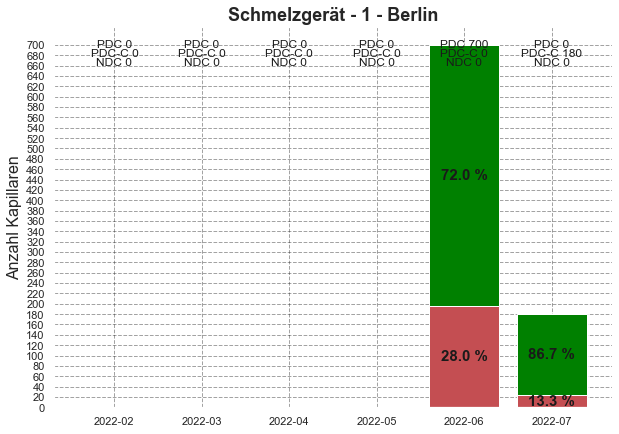

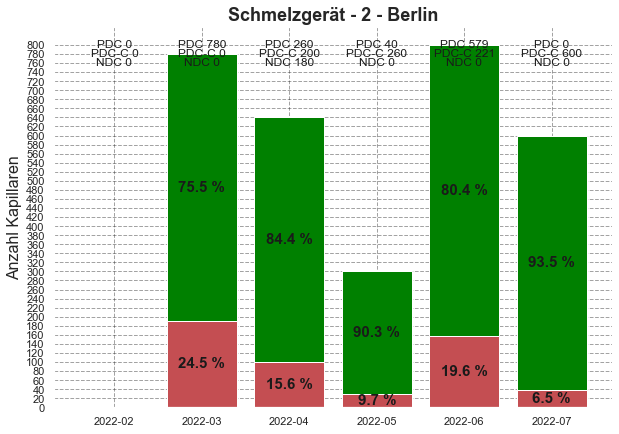

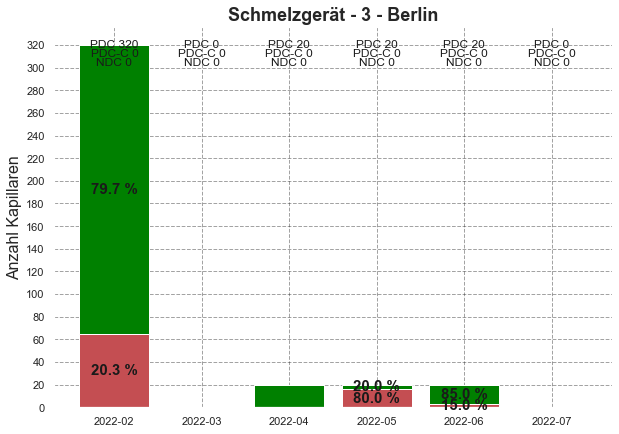

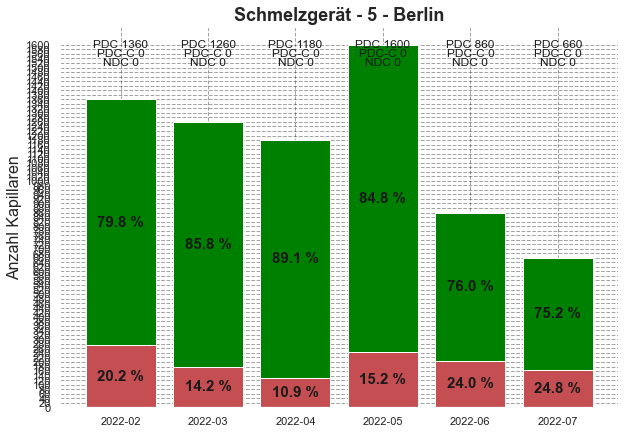

In [9]:
#######################
### MELTING DEVICES ###
#######################

SiteSelector = str(input("Berlin (B) / Dortmund (D)?")).lower()
if SiteSelector == "b":
    ProdSite = "Berlin"
else:
    ProdSite = "Dortmund"
df_DB_trunc = df_DB_trunc[df_DB_trunc["Schmelzen_Ort"]==ProdSite]
#df_DB_trunc = df_DB_trunc[df_DB_trunc["Schmelzen_Ort"]==ProdSite]
MeltDevice_List = list(df_DB_trunc["Schmelzen_Geraet"])
MeltDevice_List = [int(md) if md > 0 else 0 for md in MeltDevice_List]
MeltDevice_List_Set = sorted([int(md) for md in list(set(MeltDevice_List))])

df_MDThroughPut = pd.DataFrame()

MDTimeList, MDList, MDKapsCountList = [], [], []
MDKapsCountTypePDC, MDKapsCountTypePDCC, MDKapsCountTypeNDC = [], [], []
MDKapsCountScrapList, MDKapsCountGoodList = [], []
MDKapsCountScrapPercList, MDKapsCountGoodPercList = [], []

for month in range(len(LastNMonths)):
    for MD in range(len(MeltDevice_List_Set)):
        MDTimeList.append(LastNMonths[month])
        MDList.append(MeltDevice_List_Set[MD])
        KapCount_perMDmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Geraet"]==MeltDevice_List_Set[MD])])
        KapCountTypePDC_perMDmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) & (df_DB_trunc["Familie"]=="PDC")])
        KapCountTypePDCC_perMDmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) & (df_DB_trunc["Familie"]=="PDC-C")])
        KapCountTypeNDC_perMDmonth = len(df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) & (df_DB_trunc["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) & (df_DB_trunc["Familie"]=="NDC")])
        MDKapsCountList.append(KapCount_perMDmonth)
        
        # Check amount of scrapped capillaries for melting-reasons (NS1:V, NS1:S, NS1:eV)
        df_checkScrap = df_DB_trunc[(df_DB_trunc["Schmelzen_Month"]==LastNMonths[month]) 
                                     & (df_DB_trunc["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                                     & (df_DB_trunc["Defekt_Arbeitsschritt_ID"]==3) 
                                     & ((df_DB_trunc["Defekt_Grund_ID"]==6) 
                                        | (df_DB_trunc["Defekt_Grund_ID"]==7) 
                                        | (df_DB_trunc["Defekt_Grund_ID"]==9))]
        MeltScrap = len(df_checkScrap)
        # Calculate scrap rate from above amount
        if KapCount_perMDmonth != 0:
            MeltScrapPerc = np.around((MeltScrap/KapCount_perMDmonth)*100,1)
        else:
            MeltScrapPerc = 0
        # Calculate good parts 
        MeltGoodPerc = 100 - MeltScrapPerc
        # Append results to dataframe
        MDKapsCountGoodList.append(KapCount_perMDmonth-MeltScrap)
        MDKapsCountScrapList.append(KapCount_perMDmonth-(KapCount_perMDmonth-MeltScrap))
        MDKapsCountScrapPercList.append(MeltScrapPerc)
        MDKapsCountGoodPercList.append(MeltGoodPerc)
        MDKapsCountTypePDC.append(KapCountTypePDC_perMDmonth)
        MDKapsCountTypePDCC.append(KapCountTypePDCC_perMDmonth)
        MDKapsCountTypeNDC.append(KapCountTypeNDC_perMDmonth)

df_MDThroughPut["Year_Month"] = MDTimeList
df_MDThroughPut["Schmelzen_Geraet"] = MDList
df_MDThroughPut["Kapillaren_geschmolzen"] = MDKapsCountList
df_MDThroughPut["Ausschuss"] = MDKapsCountScrapList
df_MDThroughPut["Gutteile"] = MDKapsCountGoodList
df_MDThroughPut["Ausschuss [%]"] = MDKapsCountScrapPercList
df_MDThroughPut["Gutteile [%]"] = MDKapsCountGoodPercList
df_MDThroughPut["# PDC"] = MDKapsCountTypePDC
df_MDThroughPut["# PDC-C"] = MDKapsCountTypePDCC
df_MDThroughPut["# NDC"] = MDKapsCountTypeNDC

for MD in range(len(MeltDevice_List_Set)):
    xdata1 = df_MDThroughPut[df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]]["Year_Month"]
    ydata1 = df_MDThroughPut[df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]]["Kapillaren_geschmolzen"]
    xdata2 = df_MDThroughPut[df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]]["Year_Month"]
    ydata2 = df_MDThroughPut[df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]]["Ausschuss"]
    if max(ydata1) != 0 and max(ydata2) != 0:
    
        # Config
        plt.figure(figsize=(10,7))
        plt.rcParams['axes.facecolor'] = 'white'
        plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
        plt.title("Schmelzgerät - " + str(MeltDevice_List_Set[MD]) + " - " + ProdSite, 
                  fontsize=18, weight="bold")
        # Plotting data
        plt.bar(xdata1, ydata1, color="green")
        plt.bar(xdata2, ydata2, color="r")
        # Axis handling
        plt.ylabel("Anzahl Kapillaren", size=16)
        plt.yticks(list(range(0, np.amax(df_MDThroughPut[df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]]["Kapillaren_geschmolzen"])+10, 20)))
        # Annotations
        for time in range(len(LastNMonths)):
            ScrapXstring = str(float(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                             & (df_MDThroughPut["Year_Month"]==LastNMonths[time])]["Ausschuss [%]"])) + " %"
            ScrapYvalue = max(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                             & (df_MDThroughPut["Year_Month"]==LastNMonths[time])]["Ausschuss"])/2
            GoodXstring = str(float(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                             & (df_MDThroughPut["Year_Month"]==LastNMonths[time])]["Gutteile [%]"])) + " %"
            GoodYvalue = ScrapYvalue + max(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                             & (df_MDThroughPut["Year_Month"]==LastNMonths[time])]["Kapillaren_geschmolzen"])/2
            # Ausschusse
            if ScrapYvalue != 0:
                plt.annotate(ScrapXstring, (time, ScrapYvalue) ,fontsize=15, ha="center", va="center", color="k", weight="bold")
                plt.annotate(GoodXstring, (time, GoodYvalue) ,fontsize=15, ha="center", va="center", color="k", weight="bold")

            maxY = max(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD])]["Kapillaren_geschmolzen"])

            CountPDCstring = "PDC " + str(int(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                             & (df_MDThroughPut["Year_Month"]==LastNMonths[time])]["# PDC"]))
            CountPDCCstring = "PDC-C " + str(int(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                             & (df_MDThroughPut["Year_Month"]==LastNMonths[time])]["# PDC-C"]))
            CountNDCstring = "NDC " + str(int(df_MDThroughPut[(df_MDThroughPut["Schmelzen_Geraet"]==MeltDevice_List_Set[MD]) 
                             & (df_MDThroughPut["Year_Month"]==LastNMonths[time])]["# NDC"]))

            #if len(CountPDCstring) > 5:
            plt.annotate(CountPDCstring, (time, maxY) ,fontsize=12, ha="center", va="center", color="k")
            #elif len(CountPDCCstring) > 5:
            plt.annotate(CountPDCCstring, (time, maxY-(maxY/40)) ,fontsize=12, ha="center", va="center", color="k")
            #elif len(CountNDCstring) > 5:
            plt.annotate(CountNDCstring, (time, maxY-(maxY/20)) ,fontsize=12, ha="center", va="center", color="k")

        plt.savefig(savePath_MD_TP_Melt + "Output_MD_" + str(MeltDevice_List_Set[MD]) \
                    + "_" + ProdSite + ".jpg", dpi=300, bbox_inches="tight")

        plt.show()
    else:
        pass

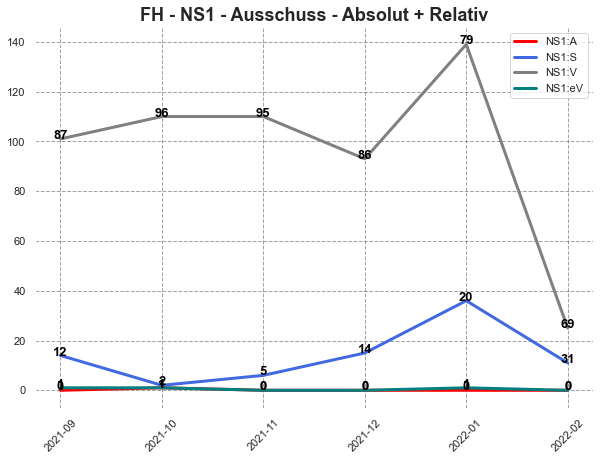

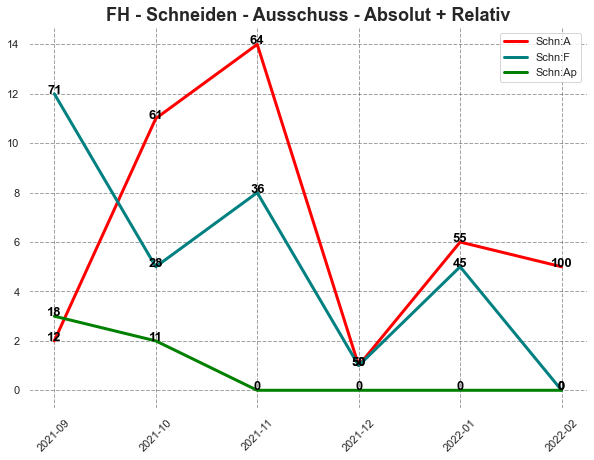

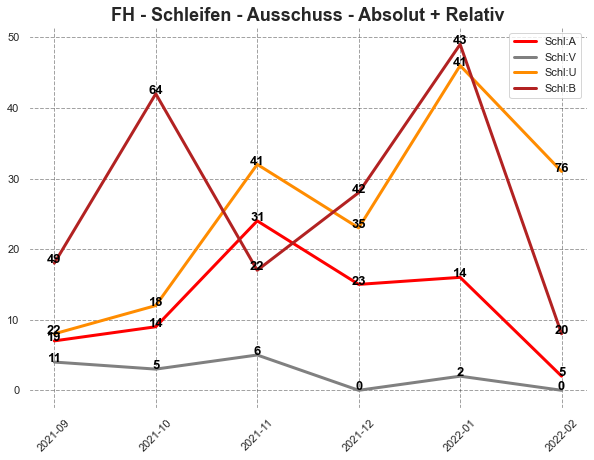

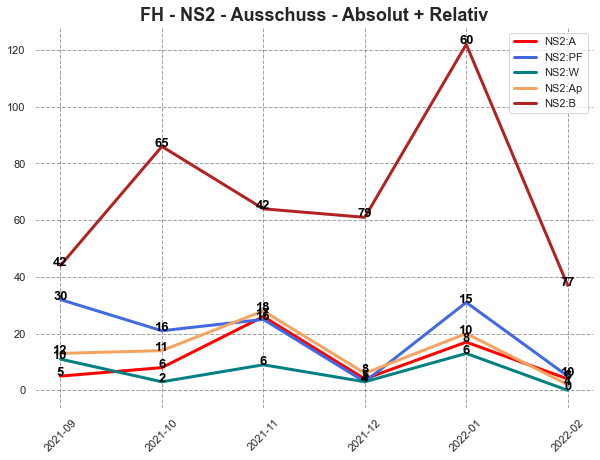

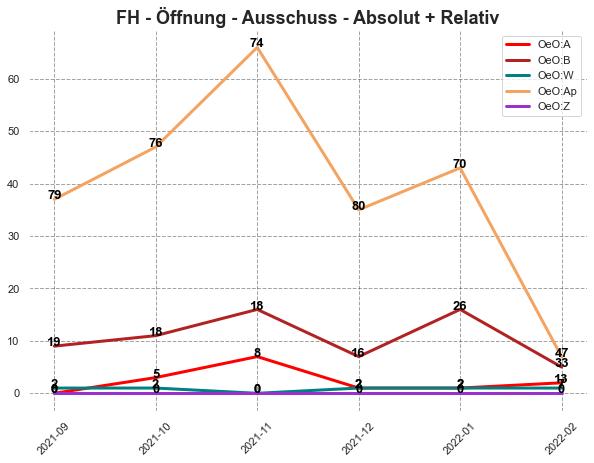

...

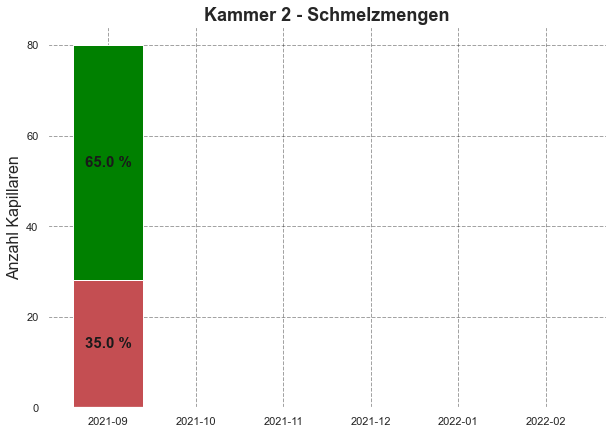

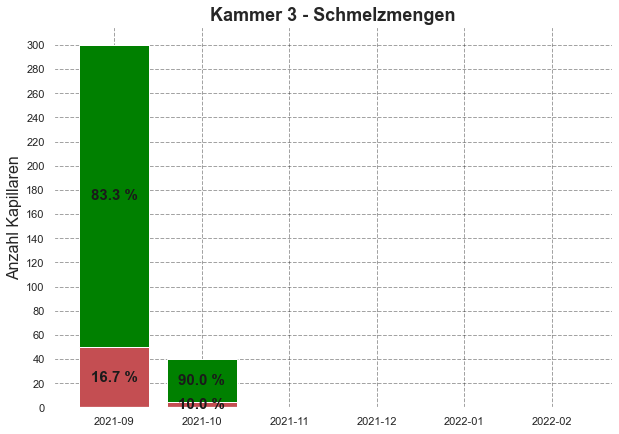

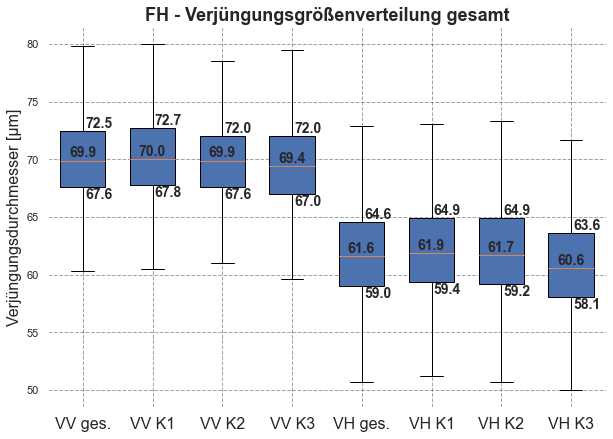

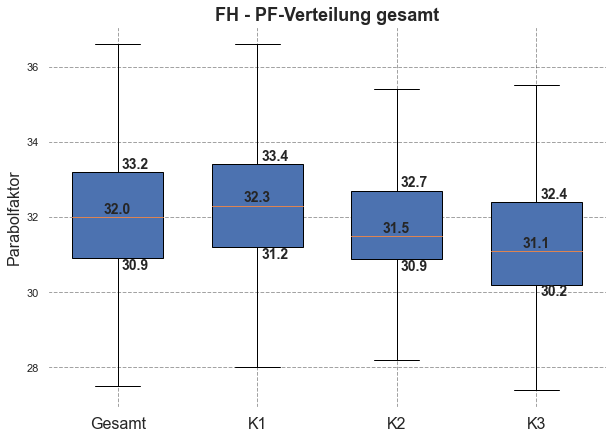

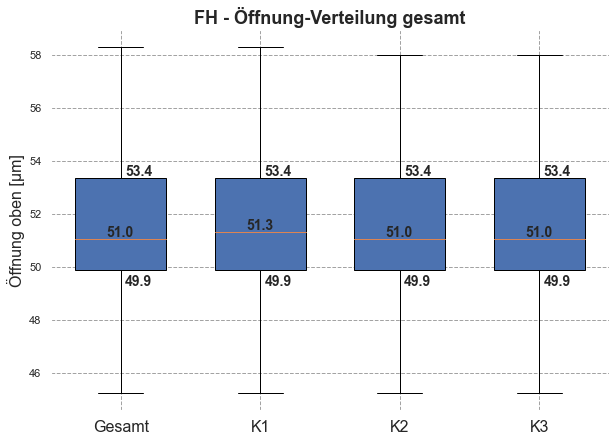

In [12]:
"""
- Plot monthly!
"""

###########################################################################################
##############################  #####   #   #  ######   ###################################
##############################  #       #   #  #        ###################################
##############################  #####   #####  ######   ###################################
##############################  #       #   #       #   ###################################
##############################  #       #   #  ######   ###################################
###########################################################################################

### FILTERS
# Filter for df entries of FH device
df_FH5 = df_DB_trunc[(df_DB_trunc["Schmelzen_Ort"]=="Berlin") &
            (df_DB_trunc["Schmelzen_Geraet"]==5)].reset_index(drop=True)
# Filter for df entries of FH device that have a comment
df_FH5_Kammern = df_FH5[df_FH5["Kommentar_Produktion"].notnull()]
# Filter for entries of chamber 1/2/3
df_FH5_Kammer1 = df_FH5_Kammern[df_FH5_Kammern["Kommentar_Produktion"].str.contains("ammer 1")]
df_FH5_Kammer2 = df_FH5_Kammern[df_FH5_Kammern["Kommentar_Produktion"].str.contains("ammer 2")]
df_FH5_Kammer3 = df_FH5_Kammern[df_FH5_Kammern["Kommentar_Produktion"].str.contains("ammer 3")]

########################################################
### TIME-BASED ABOLUTE SCRAP RATE ANALYSIS - MONTHLY ###
########################################################

# Clean dataframe of unscrapped nozzles
df_FH5_clean = df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"]!=1) & 
                                 (df_FH5["Defekt_Grund_ID"]!=1)].reset_index(drop=True)

# Construct dataframe to populate with scrap data
df_scrapAbsolute = pd.DataFrame(columns=LastNMonths)
df_scrapAbsolute.insert(0, "Defekt_Grund", ["Kapillaren geschmolzen", "NS1 gesamt", "NS1:A", "NS1:S", "NS1:V", "NS1:ev", 
                             "Schneiden gesamt", "Schn:A", "Schn:F", "Schn:Ap",
                             "Schleifen gesamt", "Schl:A", "Schl:V", "Schl:U", "Schl:B",
                             "NS2 gesamt", "NS2:A", "NS2:PF", "NS2:W", "NS2:Ap", "NS2:B",
                             "OeO gesamt", "OeO:A", "OeO:B", "OeO:W", "OeO:Ap", "OeO:Z"])

# Count scrap occurances in respective periods and assign to respective period column in dataframe
for period in range(len(LastNMonths)):
    DateScrapAbsoluteList = []
    # Kapillaren gesamt
    DateScrapAbsoluteList.append(len(df_FH5[df_FH5["Schmelzen_Month"]==LastNMonths[period]]))
    # NS1 gesamt
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)]))
    # NS1:A
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & 
       (df_FH5_clean["Defekt_Grund_ID"]==2)]))
    # NS1:S
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & 
       (df_FH5_clean["Defekt_Grund_ID"]==6)]))
    # NS1:V
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & 
       (df_FH5_clean["Defekt_Grund_ID"]==7)]))
    # NS1:eV
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & 
       (df_FH5_clean["Defekt_Grund_ID"]==9)]))
    
    # Schneiden gesamt
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)]))
    # Schn:A
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4) & 
       (df_FH5_clean["Defekt_Grund_ID"]==2)]))
    # Schn:F
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4) & 
       (df_FH5_clean["Defekt_Grund_ID"]==12)]))
    # Schn:Ap
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4) & 
       (df_FH5_clean["Defekt_Grund_ID"]==13)]))

    # Schleifen gesamt
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)]))
    # Schl:A
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & 
       (df_FH5_clean["Defekt_Grund_ID"]==2)]))
    # Schl:V
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & 
       (df_FH5_clean["Defekt_Grund_ID"]==17)]))
    # Schl:U
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & 
       (df_FH5_clean["Defekt_Grund_ID"]==5)]))
    # Schl:B
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & 
       (df_FH5_clean["Defekt_Grund_ID"]==31)]))

    # NS2 gesamt
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)]))
    # NS2:A
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & 
       (df_FH5_clean["Defekt_Grund_ID"]==2)]))
    # NS2:PF
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & 
       (df_FH5_clean["Defekt_Grund_ID"]==10)]))
    # NS2:W
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & 
       (df_FH5_clean["Defekt_Grund_ID"]==11)]))
    # NS2:Ap
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & 
       (df_FH5_clean["Defekt_Grund_ID"]==13)]))
    # NS2:B
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & 
       (df_FH5_clean["Defekt_Grund_ID"]==31)]))

    # OeO gesamt
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)]))
    # OeO:A
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & 
       (df_FH5_clean["Defekt_Grund_ID"]==2)]))
    # OeO:B
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & 
       (df_FH5_clean["Defekt_Grund_ID"]==31)]))
    # OeO:W
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & 
       (df_FH5_clean["Defekt_Grund_ID"]==11)]))
    # OeO:Ap
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & 
       (df_FH5_clean["Defekt_Grund_ID"]==13)]))
    # OeO:Z
    DateScrapAbsoluteList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
       (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & 
       (df_FH5_clean["Defekt_Grund_ID"]==14)]))
    df_scrapAbsolute.iloc[:,period+1] = DateScrapAbsoluteList
    
write_df_scrapAbsolute = df_scrapAbsolute.to_csv(savePath + "Ausschuss_Absolut_FH5.csv", sep=";", index=False)

#########################################################
### TIME-BASED RELATIVE SCRAP RATE ANALYSIS - MONTHLY ###
#########################################################

df_scrapRelative = pd.DataFrame(columns=LastNMonths)
df_scrapRelative.insert(0, "Defekt_Grund", ["NS1 gesamt", "NS1:A [%]", "NS1:S [%]", "NS1:V [%]", "NS1:ev [%]",
                                            "Schneiden gesamt", "Schn:A [%]", "Schn:F [%]", "Schn:Ap [%]", 
                                            "Schleifen gesamt", "Schl:A [%]", "Schl:V [%]", "Schl:U [%]", "Schl:B [%]",
                                            "NS2 gesamt", "NS2:A [%]", "NS2:PF [%]", "NS2:W [%]", "NS2:Ap [%]", "NS2:B [%]",
                                            "OeO gesamt", "OeO:A [%]", "OeO:B [%]", "OeO:W [%]", "OeO:Ap [%]", "OeO:Z [%]"])

# Count scrap occurances in respective periods and assign to respective period column in dataframe
for period in range(len(LastNMonths)):
    DateScrapRelativeList = []
    # NS1 gesamt
    DateScrapRelativeList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)]))
    # NS1:A
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_FH5_clean["Defekt_Grund_ID"]==2)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
    else:
        DateScrapRelativeList.append(0)
    # NS1:S
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_FH5_clean["Defekt_Grund_ID"]==6)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
    else:
        DateScrapRelativeList.append(0)
    # NS1:V
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_FH5_clean["Defekt_Grund_ID"]==7)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
    else:
        DateScrapRelativeList.append(0)
    # NS1:eV
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3) & (df_FH5_clean["Defekt_Grund_ID"]==9)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==3)])))*100)
    else:
        DateScrapRelativeList.append(0)
    # Schneiden gesamt
    DateScrapRelativeList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)]))
    # Schn:A
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4) & (df_FH5_clean["Defekt_Grund_ID"]==2)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)])))*100)
    else:
        DateScrapRelativeList.append(0)
    # Schn:F
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4) & (df_FH5_clean["Defekt_Grund_ID"]==12)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)])))*100)    
    else:
        DateScrapRelativeList.append(0)
    # Schn:Ap
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4) & (df_FH5_clean["Defekt_Grund_ID"]==13)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==4)])))*100)    
    else:
        DateScrapRelativeList.append(0)

    # Schleifen gesamt
    DateScrapRelativeList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)]))
    # Schl:A
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_FH5_clean["Defekt_Grund_ID"]==2)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
    else:
        DateScrapRelativeList.append(0)
    # Schl:V
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_FH5_clean["Defekt_Grund_ID"]==17)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
    else:
        DateScrapRelativeList.append(0)
    # Schl:U
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_FH5_clean["Defekt_Grund_ID"]==5)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
    else:
        DateScrapRelativeList.append(0)
    # Schl:B
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])) >0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5) & (df_FH5_clean["Defekt_Grund_ID"]==31)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==5)])))*100)     
    else:
        DateScrapRelativeList.append(0)

    # NS2 gesamt
    DateScrapRelativeList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)]))
    # NS2:A
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_FH5_clean["Defekt_Grund_ID"]==2)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)    
    else:
        DateScrapRelativeList.append(0)
    # NS2:PF
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_FH5_clean["Defekt_Grund_ID"]==10)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)      
    else:
        DateScrapRelativeList.append(0)
    # NS2:W
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_FH5_clean["Defekt_Grund_ID"]==11)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)      
    else:
        DateScrapRelativeList.append(0)
    # NS2:Ap
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_FH5_clean["Defekt_Grund_ID"]==13)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)  
    else:
        DateScrapRelativeList.append(0)
    # NS2:B
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6) & (df_FH5_clean["Defekt_Grund_ID"]==31)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==6)])))*100)  
    else:
        DateScrapRelativeList.append(0)

    # OeO gesamt
    DateScrapRelativeList.append(len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)]))
    # OeO:A
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_FH5_clean["Defekt_Grund_ID"]==2)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)     
    else:
        DateScrapRelativeList.append(0)
    # OeO:B
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_FH5_clean["Defekt_Grund_ID"]==31)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
    else:
        DateScrapRelativeList.append(0)
    # OeO:W
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_FH5_clean["Defekt_Grund_ID"]==11)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
    else:
        DateScrapRelativeList.append(0)
    # OeO:Ap
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_FH5_clean["Defekt_Grund_ID"]==13)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
    else:
        DateScrapRelativeList.append(0)
    # OeO:Z
    if (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                         (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])) > 0:
        DateScrapRelativeList.append(((len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
           (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7) & (df_FH5_clean["Defekt_Grund_ID"]==14)])) /  
                                     (len(df_FH5_clean[(df_FH5_clean["Schmelzen_Month"]==LastNMonths[period]) & 
                                                             (df_FH5_clean["Defekt_Arbeitsschritt_ID"]==7)])))*100)      
    else:
        DateScrapRelativeList.append(0)
    df_scrapRelative.iloc[:,period+1] = DateScrapRelativeList
    
write_df_scrapRelative = df_scrapRelative.to_csv(savePath + "Ausschuss_Relative_FH5.csv", sep=";", index=False)


##########################################################
### PLOTTING TIME-BASED ABSOLUTE + RELATIVE SCRAP DATA ###
##########################################################

### PLOT NS1 ABSOLUTE & RELATIVE SCRAP RATES ###
fig, ax1 = plt.subplots(figsize=(10,7))  # NS1
ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[2,1:]), label="NS1:A", linewidth=3, color="red") # NS1:A
ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[3,1:]), label="NS1:S", linewidth=3, color="royalblue") # NS1:S
ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[4,1:]), label="NS1:V", linewidth=3, color="grey") # NS1:V
ax1.plot(LastNMonths, list(df_scrapAbsolute.iloc[5,1:]), label="NS1:eV", linewidth=3, color="teal") # NS1:eV

ax1.set_facecolor("white")
ax1.grid(color="k", axis="both", linestyle="--", alpha=0.4)
plt.xticks(rotation=45)
ax1.set_title("FH - NS1 - Ausschuss - Absolut + Relativ", fontsize=18, weight="bold")
ax1.legend()

### TEXT ANNOTATIONS - NS1 SCRAPS ###
NS1AtextAnnotList = [int(np.around(df_scrapRelative.iloc[1,1+a],0)) for a in range(len(df_scrapRelative.iloc[1,1:]))]
NS1StextAnnotList = [int(np.around(df_scrapRelative.iloc[2,1+a],0)) for a in range(len(df_scrapRelative.iloc[2,1:]))]
NS1VtextAnnotList = [int(np.around(df_scrapRelative.iloc[3,1+a],0)) for a in range(len(df_scrapRelative.iloc[3,1:]))]
NS1eVtextAnnotList = [int(np.around(df_scrapRelative.iloc[4,1+a],0)) for a in range(len(df_scrapRelative.iloc[4,1:]))]

### ANNOTATE RELATIVE SCRAP RATES ###
for date in range(len(LastNMonths)):
    ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[2,date+1], NS1AtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[3,date+1], NS1StextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[4,date+1], NS1VtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax1.text(LastNMonths[date], df_scrapAbsolute.iloc[5,date+1], NS1eVtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    
plt.savefig(savePath_FH + "FH_Auswertung_NS1_Ausschussverlauf" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()
######################################################################################################################

### PLOT SCHNEIDEN ABSOLUTE & RELATIVE SCRAP RATES ###
fig, ax2 = plt.subplots(figsize=(10,7)) # Schneiden
ax2.plot(LastNMonths, list(df_scrapAbsolute.iloc[7,1:]), label="Schn:A", linewidth=3, color="red") # Schn:A
ax2.plot(LastNMonths, list(df_scrapAbsolute.iloc[8,1:]), label="Schn:F", linewidth=3, color="teal") # Schn:F
ax2.plot(LastNMonths, list(df_scrapAbsolute.iloc[9,1:]), label="Schn:Ap", linewidth=3, color="green") # Schn:Ap

ax2.set_facecolor("white")
ax2.grid(color="k", axis="both", linestyle="--", alpha=0.4)
plt.xticks(rotation=45)
ax2.set_title("FH - Schneiden - Ausschuss - Absolut + Relativ", fontsize=18, weight="bold")
ax2.legend()

### TEXT ANNOTATIONS - SCHNEIDEN SCRAPS ###
SchnAtextAnnotList = [int(np.around(df_scrapRelative.iloc[6,1+a],0)) for a in range(len(df_scrapRelative.iloc[6,1:]))]
SchnFtextAnnotList = [int(np.around(df_scrapRelative.iloc[7,1+a],0)) for a in range(len(df_scrapRelative.iloc[7,1:]))]
SchnAptextAnnotList = [int(np.around(df_scrapRelative.iloc[8,1+a],0)) for a in range(len(df_scrapRelative.iloc[6,1:]))]

### ANNOTATE RELATIVE SCRAP RATES ###
for date in range(len(LastNMonths)):
    ax2.text(LastNMonths[date], df_scrapAbsolute.iloc[7,date+1], SchnAtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax2.text(LastNMonths[date], df_scrapAbsolute.iloc[8,date+1], SchnFtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax2.text(LastNMonths[date], df_scrapAbsolute.iloc[9,date+1], SchnAptextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    
plt.savefig(savePath_FH + "FH_Auswertung_Schneiden_Ausschussverlauf" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()
######################################################################################################################

### PLOT SCHLEIFEN ABSOLUTE & RELATIVE SCRAP RATES ###
fig, ax3 = plt.subplots(figsize=(10,7)) # Schleifen
ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[11,1:]), label="Schl:A", linewidth=3, color="red") # Schl:A
ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[12,1:]), label="Schl:V", linewidth=3, color="grey") # Schl:V
ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[13,1:]), label="Schl:U", linewidth=3, color="darkorange") # Schl:U
ax3.plot(LastNMonths, list(df_scrapAbsolute.iloc[14,1:]), label="Schl:B", linewidth=3, color="firebrick") # Schl:B

ax3.set_facecolor("white")
ax3.grid(color="k", axis="both", linestyle="--", alpha=0.4)
plt.xticks(rotation=45)
ax3.set_title("FH - Schleifen - Ausschuss - Absolut + Relativ", fontsize=18, weight="bold")
ax3.legend()

### TEXT ANNOTATIONS - SCHLEIFEN SCRAPS ###
SchlAtextAnnotList = [int(np.around(df_scrapRelative.iloc[10,1+a],0)) for a in range(len(df_scrapRelative.iloc[9,1:]))]
SchlVtextAnnotList = [int(np.around(df_scrapRelative.iloc[11,1+a],0)) for a in range(len(df_scrapRelative.iloc[10,1:]))]
SchlUtextAnnotList = [int(np.around(df_scrapRelative.iloc[12,1+a],0)) for a in range(len(df_scrapRelative.iloc[11,1:]))]
SchlBtextAnnotList = [int(np.around(df_scrapRelative.iloc[13,1+a],0)) for a in range(len(df_scrapRelative.iloc[12,1:]))]

### ANNOTATE RELATIVE SCRAP RATES ###
for date in range(len(LastNMonths)):
    ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[11,date+1], SchlAtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[12,date+1], SchlVtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[13,date+1], SchlUtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax3.text(LastNMonths[date], df_scrapAbsolute.iloc[14,date+1], SchlBtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    
plt.savefig(savePath_FH + "FH_Auswertung_Schleifen_Ausschussverlauf" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()
######################################################################################################################

### PLOT NS2 ABSOLUTE & RELATIVE SCRAP RATES ###
fig, ax4 = plt.subplots(figsize=(10,7)) # NS2
ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[16,1:]), label="NS2:A", linewidth=3, color="red") # NS2:A
ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[17,1:]), label="NS2:PF", linewidth=3, color="royalblue") # NS2:PF
ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[18,1:]), label="NS2:W", linewidth=3, color="teal") # NS2:W
ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[19,1:]), label="NS2:Ap", linewidth=3, color="sandybrown") # NS2:Ap
ax4.plot(LastNMonths, list(df_scrapAbsolute.iloc[20,1:]), label="NS2:B", linewidth=3, color="firebrick") # NS2:B

ax4.set_facecolor("white")
ax4.grid(color="k", axis="both", linestyle="--", alpha=0.4)
plt.xticks(rotation=45)
ax4.set_title("FH - NS2 - Ausschuss - Absolut + Relativ", fontsize=18, weight="bold")
ax4.legend()

### TEXT ANNOTATIONS - NS2 SCRAPS ###
NS2AtextAnnotList = [int(np.around(df_scrapRelative.iloc[15,1+a],0)) for a in range(len(df_scrapRelative.iloc[14,1:]))]
NS2PFtextAnnotList = [int(np.around(df_scrapRelative.iloc[16,1+a],0)) for a in range(len(df_scrapRelative.iloc[15,1:]))]
NS2WtextAnnotList = [int(np.around(df_scrapRelative.iloc[17,1+a],0)) for a in range(len(df_scrapRelative.iloc[16,1:]))]
NS2AptextAnnotList = [int(np.around(df_scrapRelative.iloc[18,1+a],0)) for a in range(len(df_scrapRelative.iloc[17,1:]))]
NS2BtextAnnotList = [int(np.around(df_scrapRelative.iloc[19,1+a],0)) for a in range(len(df_scrapRelative.iloc[18,1:]))]

### ANNOTATE RELATIVE SCRAP RATES ###
for date in range(len(LastNMonths)):
    ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[16,date+1], NS2AtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[17,date+1], NS2PFtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[18,date+1], NS2WtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[19,date+1], NS2AptextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax4.text(LastNMonths[date], df_scrapAbsolute.iloc[20,date+1], NS2BtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    
plt.savefig(savePath_FH + "FH_Auswertung_NS2_Ausschussverlauf" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()
######################################################################################################################

### PLOT OeO ABSOLUTE & RELATIVE SCRAP RATES ###
fig, ax5 = plt.subplots(figsize=(10,7)) # OeO
ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[22,1:]), label="OeO:A", linewidth=3, color="red") # OeO:A
ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[23,1:]), label="OeO:B", linewidth=3, color="firebrick") # OeO:B
ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[24,1:]), label="OeO:W", linewidth=3, color="teal") # OeO:W
ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[25,1:]), label="OeO:Ap", linewidth=3, color="sandybrown") # OeO:Ap
ax5.plot(LastNMonths, list(df_scrapAbsolute.iloc[26,1:]), label="OeO:Z", linewidth=3, color="darkorchid") # OeO:Z

ax5.set_facecolor("white")
ax5.grid(color="k", axis="both", linestyle="--", alpha=0.4)
plt.xticks(rotation=45)
plt.title("FH - Öffnung - Ausschuss - Absolut + Relativ", fontsize=18, weight="bold")
ax5.legend()

### TEXT ANNOTATIONS - OeO SCRAPS ###
OeOAtextAnnotList = [int(np.around(df_scrapRelative.iloc[21,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
OeOBtextAnnotList = [int(np.around(df_scrapRelative.iloc[22,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
OeOWtextAnnotList = [int(np.around(df_scrapRelative.iloc[23,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
OeOAptextAnnotList = [int(np.around(df_scrapRelative.iloc[24,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]
OeOZtextAnnotList = [int(np.around(df_scrapRelative.iloc[25,1+a],0)) for a in range(len(df_scrapRelative.iloc[20,1:]))]

### ANNOTATE RELATIVE SCRAP RATES ###
for date in range(len(LastNMonths)):
    ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[22,date+1], OeOAtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[23,date+1], OeOBtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[24,date+1], OeOWtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[25,date+1], OeOAptextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    ax5.text(LastNMonths[date], df_scrapAbsolute.iloc[26,date+1], OeOZtextAnnotList[date], fontsize=13, 
             ha="center", color="black", weight="bold")
    
plt.savefig(savePath_FH + "FH_Auswertung_OeO_Ausschussverlauf" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()
################################################

#############################################
### PROCESS SCRAP RATE ANALYSIS - OVERALL ###
#############################################
# CHECK HOW MANY CAPILLARIES WERE SCRAPPED IN EACH PRODUCTION STEP
NS1Scrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 3])
SchneidenScrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 4])
SchleifenScrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 5])
NS2Scrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 6])
OKScrap_FH_ = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 7) & (df_FH5["Defekt_Grund_ID"] != 1)])

# SUCCESSIVE CALCULATION HOW MANY CAPILLARIES LEFT AFTER EACH PRODUCTION STEP
Scrap_FH_Sum = sum((NS1Scrap_FH_, SchleifenScrap_FH_, SchneidenScrap_FH_, NS2Scrap_FH_, OKScrap_FH_))
Kaps_FH_Gesamt = len(df_FH5)
Kaps_FH_NachNS1Gesamt = Kaps_FH_Gesamt - NS1Scrap_FH_
Kaps_FH_NachSchneidenGesamt = Kaps_FH_NachNS1Gesamt - SchneidenScrap_FH_
Kaps_FH_NachSchleifenGesamt = Kaps_FH_NachSchneidenGesamt - SchleifenScrap_FH_
Kaps_FH_NachNS2Gesamt = Kaps_FH_NachSchleifenGesamt - NS2Scrap_FH_
Kaps_FH_NachÖOGesamt = Kaps_FH_NachNS2Gesamt - OKScrap_FH_

# CALCULATE RESPECTIVE SUCCESSIVE SCRAP RATE OF PRODUCTION STEPS
NS1Scrap_FH_RateSuc = np.around((len(df_FH5) - Kaps_FH_NachNS1Gesamt) / len(df_FH5) * 100, 1)
SchneidenScrap_FH_RateSuc = np.around((Kaps_FH_NachNS1Gesamt - Kaps_FH_NachSchneidenGesamt) / Kaps_FH_NachNS1Gesamt * 100, 1)
SchleifenScrap_FH_RateSuc = np.around((Kaps_FH_NachSchneidenGesamt - Kaps_FH_NachSchleifenGesamt) / Kaps_FH_NachSchneidenGesamt * 100, 1)
NS2Scrap_FH_RateSuc = np.around((Kaps_FH_NachSchleifenGesamt - Kaps_FH_NachNS2Gesamt) / Kaps_FH_NachSchleifenGesamt * 100, 1)
ÖOScrap_FH_RateSuc = np.around((Kaps_FH_NachNS2Gesamt - Kaps_FH_NachÖOGesamt) / Kaps_FH_NachNS2Gesamt * 100, 1)

df_Scrap_FH_Analysis = {"Schritt" : ["Gesamt", "NS1", "Schneiden", "Schleifen", "NS2", "ÖO"], 
                    "Anzahl" : [Kaps_FH_Gesamt, Kaps_FH_NachNS1Gesamt, Kaps_FH_NachSchneidenGesamt, 
                                Kaps_FH_NachSchleifenGesamt, Kaps_FH_NachNS2Gesamt, Kaps_FH_NachÖOGesamt], 
                    "Ausschuss sukz. [%]" : [0, NS1Scrap_FH_RateSuc, SchneidenScrap_FH_RateSuc, 
                                             SchleifenScrap_FH_RateSuc, NS2Scrap_FH_RateSuc, ÖOScrap_FH_RateSuc]}
df_Scrap_FH_Analysis = pd.DataFrame(df_Scrap_FH_Analysis)

# PLOT ABSOLUTE AND SUCCESSIVE SCRAP RATES
Scrap_FH_CountRates = [[Kaps_FH_NachÖOGesamt, Kaps_FH_NachNS2Gesamt - Kaps_FH_NachÖOGesamt],
                   [Kaps_FH_NachNS2Gesamt, Kaps_FH_NachSchleifenGesamt - Kaps_FH_NachNS2Gesamt],
                   [Kaps_FH_NachSchleifenGesamt, Kaps_FH_NachSchneidenGesamt - Kaps_FH_NachSchleifenGesamt],
                   [Kaps_FH_NachSchneidenGesamt, Kaps_FH_NachNS1Gesamt - Kaps_FH_NachSchneidenGesamt],
                   [Kaps_FH_NachNS1Gesamt, Kaps_FH_Gesamt - Kaps_FH_NachNS1Gesamt],
                   [Kaps_FH_Gesamt]]

scrap1 = pd.DataFrame(Scrap_FH_CountRates[::-1], 
                      index=list(df_Scrap_FH_Analysis["Schritt"])).plot(kind="bar", stacked=True, color=["grey", "r", "w"], 
                                                              edgecolor="k", linewidth=0.8, fontsize=12, width=0.7, 
                                                              figsize=(10,8), rot=0)
scrap1.grid(color="k", axis="both", linestyle="--", alpha=0.4)
scrap1.set_ylabel("Anzahl Kapillaren", fontsize=16)
scrap1.set_facecolor("white")

# Text labels for absolute counts
Kaps_FH_GesamtText = scrap1.text(0, 0+(0.01*Kaps_FH_Gesamt), Kaps_FH_Gesamt, fontsize=15, ha="center", color="white", weight="bold")
Kaps_FH_NachNS1GesamtText = scrap1.text(1, 0+(0.01*Kaps_FH_Gesamt), Kaps_FH_NachNS1Gesamt, fontsize=15, ha="center", color="white", weight="bold")
Kaps_FH_NachSchneidenGesamtText = scrap1.text(2, 0+(0.01*Kaps_FH_Gesamt), Kaps_FH_NachSchneidenGesamt, fontsize=15, ha="center", color="white", weight="bold")
Kaps_FH_NachSchleifenGesamtText = scrap1.text(3, 0+(0.01*Kaps_FH_Gesamt), Kaps_FH_NachSchleifenGesamt, fontsize=15, ha="center", color="white", weight="bold")
Kaps_FH_NachNS2GesamtText = scrap1.text(4, 0+(0.01*Kaps_FH_Gesamt), Kaps_FH_NachNS2Gesamt, fontsize=15, ha="center", color="white", weight="bold")
Kaps_FH_NachÖOGesamtText = scrap1.text(5, 0+(0.01*Kaps_FH_Gesamt), Kaps_FH_NachÖOGesamt, fontsize=15, ha="center", color="white", weight="bold")

# Text labels for relative (successive) scrap rates
Kaps_FH_NachNS1GesamtScrap_FH_Text = scrap1.text(1, Kaps_FH_NachNS1Gesamt + (0.5*(Kaps_FH_Gesamt - Kaps_FH_NachNS1Gesamt)/2), str(NS1Scrap_FH_RateSuc) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachSchneidenGesamtScrap_FH_Text = scrap1.text(2, Kaps_FH_NachSchneidenGesamt + (0.5*(Kaps_FH_NachNS1Gesamt - Kaps_FH_NachSchneidenGesamt)/2), str(SchneidenScrap_FH_RateSuc) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachSchleifenGesamtScrap_FH_Text = scrap1.text(3, Kaps_FH_NachSchleifenGesamt + (0.5*(Kaps_FH_NachSchneidenGesamt - Kaps_FH_NachSchleifenGesamt)/2), str(SchleifenScrap_FH_RateSuc) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachNS2GesamtScrap_FH_Text = scrap1.text(4, Kaps_FH_NachNS2Gesamt + (0.5*(Kaps_FH_NachSchleifenGesamt - Kaps_FH_NachNS2Gesamt)/2), str(NS2Scrap_FH_RateSuc) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachÖOGesamtScrap_FH_Text = scrap1.text(5, Kaps_FH_NachÖOGesamt + (0.5*(Kaps_FH_NachNS2Gesamt - Kaps_FH_NachÖOGesamt)/2), str(ÖOScrap_FH_RateSuc) + "%", fontsize=15, ha="center", color="k", weight="bold")

# Text labels for absolute scrap rates
Kaps_FH_NachSchmelzenGesamtScrap_FH_Text = scrap1.text(0, 0+(0.05*Kaps_FH_Gesamt), "0 %", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachNS1GesamtScrap_FH_Text = scrap1.text(1, 0+(0.05*Kaps_FH_Gesamt), str(np.around(((Kaps_FH_Gesamt-Kaps_FH_NachNS1Gesamt)/Kaps_FH_Gesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachSchneidenGesamtScrap_FH_Text = scrap1.text(2, 0+(0.05*Kaps_FH_Gesamt), str(np.around(((Kaps_FH_Gesamt-Kaps_FH_NachSchneidenGesamt)/Kaps_FH_Gesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachSchleifenGesamtScrap_FH_Text = scrap1.text(3, 0+(0.05*Kaps_FH_Gesamt), str(np.around(((Kaps_FH_Gesamt-Kaps_FH_NachSchleifenGesamt)/Kaps_FH_Gesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachNS2GesamtScrap_FH_Text = scrap1.text(4, 0+(0.05*Kaps_FH_Gesamt), str(np.around(((Kaps_FH_Gesamt-Kaps_FH_NachNS2Gesamt)/Kaps_FH_Gesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")
Kaps_FH_NachÖOGesamtScrap_FH_Text = scrap1.text(5, 0+(0.05*Kaps_FH_Gesamt), str(np.around(((Kaps_FH_Gesamt-Kaps_FH_NachÖOGesamt)/Kaps_FH_Gesamt)*100,1)) + "%", fontsize=15, ha="center", color="k", weight="bold")

#scrap1.legend(["Anzahl", "Prozessschritt-Ausschuss", "Gesamt-Ausschuss"], loc="best")
scrap1.legend([])
scrap1.set_title("FH - Produktion - Sukzessiver Ausschuss", fontsize=18, weight="bold")
plt.savefig(savePath_FH + "FH_Auswertung_Ausschuss_Sukzessiv" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()


###### ### PROCESS SCRAP RATE ANALYSIS - SPECIFIC ###
##############################################
NS1Scrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 3])
NS1Scrap_FH_A = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 3) & (df_FH5["Defekt_Grund_ID"] == 2)]) #NS1:A
NS1Scrap_FH_S = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 3) & (df_FH5["Defekt_Grund_ID"] == 6)]) #NS1:S
NS1Scrap_FH_V = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 3) & (df_FH5["Defekt_Grund_ID"] == 7)]) #NS1:V
NS1Scrap_FH_eV = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 3) & (df_FH5["Defekt_Grund_ID"] == 9)]) #NS1:eV

# NS1Scrap_FH_ Rates
NS1Scrap_FH_Arate = np.around((NS1Scrap_FH_A/NS1Scrap_FH_)*100,1)
NS1Scrap_FH_Srate = np.around((NS1Scrap_FH_S/NS1Scrap_FH_)*100,1)
NS1Scrap_FH_Vrate = np.around((NS1Scrap_FH_V/NS1Scrap_FH_)*100,1)
NS1Scrap_FH_eVrate = np.around((NS1Scrap_FH_eV/NS1Scrap_FH_)*100,1)
sumN1scrap = NS1Scrap_FH_Arate + NS1Scrap_FH_Srate + NS1Scrap_FH_Vrate + NS1Scrap_FH_eVrate

SchneidenScrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 4])
SchneidenScrap_FH_A = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"]== 4) & (df_FH5["Defekt_Grund_ID"] == 2)]) #Schn:A
SchneidenScrap_FH_F = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 4) & (df_FH5["Defekt_Grund_ID"] == 12)]) #Schn:F
SchneidenScrap_FH_Ap = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"]== 4) & (df_FH5["Defekt_Grund_ID"] == 13)]) #Schn:Ap

# SchneidenScrap_FH_ Rates
SchneidenScrap_FH_Arate = np.around((SchneidenScrap_FH_A/SchneidenScrap_FH_)*100,1)
SchneidenScrap_FH_Frate = np.around((SchneidenScrap_FH_F/SchneidenScrap_FH_)*100,1)
SchneidenScrap_FH_Aprate = np.around((SchneidenScrap_FH_Ap/SchneidenScrap_FH_)*100,1)
sumSchneidenscrap = SchneidenScrap_FH_Arate + SchneidenScrap_FH_Frate + SchneidenScrap_FH_Aprate
    
SchleifenScrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 5])
SchleifenScrap_FH_A = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 5) & (df_FH5["Defekt_Grund_ID"] == 2)]) #Schl:A
SchleifenScrap_FH_V = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 5) & (df_FH5["Defekt_Grund_ID"] == 17)]) #Schl:V
SchleifenScrap_FH_U = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 5) & (df_FH5["Defekt_Grund_ID"] == 5)]) #Schl:U
SchleifenScrap_FH_B = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 5) & (df_FH5["Defekt_Grund_ID"] == 31)]) #Schl:B

# SchleifenScrap_FH_ Rates
SchleifenScrap_FH_Arate = np.around((SchleifenScrap_FH_A/SchleifenScrap_FH_)*100,1)
SchleifenScrap_FH_Vrate = np.around((SchleifenScrap_FH_V/SchleifenScrap_FH_)*100,1)
SchleifenScrap_FH_Urate = np.around((SchleifenScrap_FH_U/SchleifenScrap_FH_)*100,1)
SchleifenScrap_FH_Brate = np.around((SchleifenScrap_FH_B/SchleifenScrap_FH_)*100,1)
sumSchleifenscrap = SchleifenScrap_FH_Arate + SchleifenScrap_FH_Vrate + SchleifenScrap_FH_Urate + SchleifenScrap_FH_Brate

NS2Scrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 6])
NS2Scrap_FH_A = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 6) & (df_FH5["Defekt_Grund_ID"] == 2)]) #NS2:A
NS2Scrap_FH_PF = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 6) & (df_FH5["Defekt_Grund_ID"] == 10)]) #NS2:PF
NS2Scrap_FH_W = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 6) & (df_FH5["Defekt_Grund_ID"] == 11)]) #NS2:W
NS2Scrap_FH_Ap = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 6) & (df_FH5["Defekt_Grund_ID"] == 13)]) #NS2:Ap
NS2Scrap_FH_B = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 6) & (df_FH5["Defekt_Grund_ID"] == 31)]) #NS2:B

# NS2Scrap_FH_ Rates
NS2Scrap_FH_Arate = np.around((NS2Scrap_FH_A/NS2Scrap_FH_)*100,1)
NS2Scrap_FH_PFrate = np.around((NS2Scrap_FH_PF/NS2Scrap_FH_)*100,1)
NS2Scrap_FH_Wrate = np.around((NS2Scrap_FH_W/NS2Scrap_FH_)*100,1)
NS2Scrap_FH_Aprate = np.around((NS2Scrap_FH_Ap/NS2Scrap_FH_)*100,1)
NS2Scrap_FH_Brate = np.around((NS2Scrap_FH_B/NS2Scrap_FH_)*100,1)
sumNS2scrap = NS2Scrap_FH_Arate + NS2Scrap_FH_PFrate + NS2Scrap_FH_Wrate + NS2Scrap_FH_Aprate + NS2Scrap_FH_Brate

OKScrap_FH_ = len(df_FH5[df_FH5["Defekt_Arbeitsschritt_ID"] == 7])
OKScrap_FH_A = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 7) & (df_FH5["Defekt_Grund_ID"] == 2)]) #ÖO:A
OKScrap_FH_B = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 7) & (df_FH5["Defekt_Grund_ID"] == 31)]) #ÖO:B
OKScrap_FH_W = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 7) & (df_FH5["Defekt_Grund_ID"] == 11)]) #ÖO:W
OKScrap_FH_Ap = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 7) & (df_FH5["Defekt_Grund_ID"] == 13)]) #ÖO:Ap
OKScrap_FH_Z = len(df_FH5[(df_FH5["Defekt_Arbeitsschritt_ID"] == 7) & (df_FH5["Defekt_Grund_ID"] == 14)]) #ÖO:Z
# OKScrap_FH_ Rates
OKScrap_FH_Arate = np.around((OKScrap_FH_A/OKScrap_FH_)*100,1)
OKScrap_FH_Brate = np.around((OKScrap_FH_B/OKScrap_FH_)*100,1)
OKScrap_FH_Wrate = np.around((OKScrap_FH_W/OKScrap_FH_)*100,1)
OKScrap_FH_Aprate = np.around((OKScrap_FH_Ap/OKScrap_FH_)*100,1)
OKScrap_FH_Zrate = np.around((OKScrap_FH_Z/OKScrap_FH_)*100,1)
sumOKscrap = OKScrap_FH_Arate + OKScrap_FH_Brate + OKScrap_FH_Wrate + OKScrap_FH_Aprate + OKScrap_FH_Zrate


SukzScrap_FH_CountRates = [[NS1Scrap_FH_Arate, NS1Scrap_FH_Vrate, NS1Scrap_FH_Srate, NS1Scrap_FH_eVrate],
                      [SchneidenScrap_FH_Arate, SchneidenScrap_FH_Frate, SchneidenScrap_FH_Aprate],
                      [SchleifenScrap_FH_Arate, SchleifenScrap_FH_Vrate, SchleifenScrap_FH_Urate, SchleifenScrap_FH_Brate],
                      [NS2Scrap_FH_Arate, NS2Scrap_FH_PFrate, NS2Scrap_FH_Wrate, NS2Scrap_FH_Aprate, NS2Scrap_FH_Brate],
                      [OKScrap_FH_Arate, OKScrap_FH_Brate, OKScrap_FH_Wrate, OKScrap_FH_Aprate, OKScrap_FH_Zrate]]

scrap2 = pd.DataFrame(SukzScrap_FH_CountRates,index=list(df_ScrapAnalysis["Schritt"][1:])).plot(kind="bar", stacked=True, color=["grey", "r", "w", "y", "b"], 
                                                              edgecolor="k", linewidth=0.8, fontsize=12, width=0.7, 
                                                              figsize=(10,8), rot=0, yticks=np.arange(0,110,10))
scrap2.set_title("FH - %-Verteilung Ausschussgründe", fontsize=18, weight="bold")
scrap2.grid(color="k", axis="both", linestyle="--", alpha=0.4)
scrap2.set_ylabel("Ausschussanteil [%]", fontsize=16)
scrap2.set_facecolor("white")

scrap2.legend([])

# Text labels for absolute counts
NS1Scrap_FH_ArateText = scrap2.text(0, NS1Scrap_FH_Arate/2, "A = "+str(NS1Scrap_FH_Arate), fontsize=15, ha="center", color="black", weight="bold")
NS1Scrap_FH_VrateText = scrap2.text(0, (((NS1Scrap_FH_Arate+NS1Scrap_FH_Vrate)/2)), "V = "+str(NS1Scrap_FH_Vrate), fontsize=15, ha="center", color="black", weight="bold")
NS1Scrap_FH_SrateText = scrap2.text(0, 100-NS1Scrap_FH_eVrate-(NS1Scrap_FH_Srate/2), "S = "+str(NS1Scrap_FH_Srate), fontsize=15, ha="center", color="black", weight="bold")
NS1Scrap_FH_eVrateText = scrap2.text(0, 100, "eV = "+str(NS1Scrap_FH_eVrate), fontsize=15, ha="center", color="black", weight="bold")
#
SchneidenScrap_FH_ArateText = scrap2.text(1, SchneidenScrap_FH_Arate/2, "A = "+str(SchneidenScrap_FH_Arate), fontsize=15, ha="center", color="black", weight="bold")
SchneidenScrap_FH_FrateText = scrap2.text(1, SchneidenScrap_FH_Arate+(SchneidenScrap_FH_Frate/2), "F = "+str(SchneidenScrap_FH_Frate), fontsize=15, ha="center", color="black", weight="bold")
SchneidenScrap_FH_AprateText = scrap2.text(1, SchneidenScrap_FH_Arate+SchneidenScrap_FH_Frate+(SchneidenScrap_FH_Aprate/2), "Ap = "+str(SchneidenScrap_FH_Aprate), fontsize=15, ha="center", color="black", weight="bold")
#
SchleifenScrap_FH_ArateText = scrap2.text(2, SchleifenScrap_FH_Arate/2, "A = "+str(SchleifenScrap_FH_Arate), fontsize=15, ha="center", color="black", weight="bold")
SchleifenScrap_FH_VrateText = scrap2.text(2, SchleifenScrap_FH_Arate+(SchleifenScrap_FH_Vrate/2), "V = "+str(SchleifenScrap_FH_Vrate), fontsize=15, ha="center", color="black", weight="bold")
SchleifenScrap_FH_UrateText = scrap2.text(2, SchleifenScrap_FH_Arate+SchleifenScrap_FH_Vrate+(SchleifenScrap_FH_Urate/2), "U = "+str(SchleifenScrap_FH_Urate), fontsize=15, ha="center", color="black", weight="bold")
SchleifenScrap_FH_BrateText = scrap2.text(2, 100-(SchleifenScrap_FH_Brate/2), "B = "+str(SchleifenScrap_FH_Brate), fontsize=15, ha="center", color="black", weight="bold")
#
NS2Scrap_FH_ArateText = scrap2.text(3, NS2Scrap_FH_Arate/2, "A = "+str(NS2Scrap_FH_Arate), fontsize=15, ha="center", color="black", weight="bold")
NS2Scrap_FH_PFrateText = scrap2.text(3, NS2Scrap_FH_Arate+(NS2Scrap_FH_PFrate/2), "PF = "+str(NS2Scrap_FH_PFrate), fontsize=15, ha="center", color="black", weight="bold")
NS2Scrap_FH_WrateText = scrap2.text(3, NS2Scrap_FH_Arate+NS2Scrap_FH_PFrate+(NS2Scrap_FH_Wrate/2), "W = "+str(NS2Scrap_FH_Wrate), fontsize=15, ha="center", color="black", weight="bold")
NS2Scrap_FH_AprateText = scrap2.text(3, 100-NS2Scrap_FH_Brate-(NS2Scrap_FH_Aprate/2), "Ap = "+str(NS2Scrap_FH_Aprate), fontsize=15, ha="center", color="black", weight="bold")
NS2Scrap_FH_BrateText = scrap2.text(3, 100-(NS2Scrap_FH_Brate/2), "B = "+str(NS2Scrap_FH_Brate), fontsize=15, ha="center", color="black", weight="bold")
#
OKScrap_FH_ArateText = scrap2.text(4, OKScrap_FH_Arate/2, "A = "+str(OKScrap_FH_Arate), fontsize=15, ha="center", color="black", weight="bold")
OKScrap_FH_BrateText = scrap2.text(4, OKScrap_FH_Arate+(OKScrap_FH_Brate/2), "B = "+str(OKScrap_FH_Brate), fontsize=15, ha="center", color="black", weight="bold")
OKScrap_FH_WrateText = scrap2.text(4, OKScrap_FH_Arate+OKScrap_FH_Brate+(OKScrap_FH_Wrate/2), "W = "+str(OKScrap_FH_Wrate), fontsize=15, ha="center", color="black", weight="bold")
OKScrap_FH_AprateText = scrap2.text(4, 100-(OKScrap_FH_Aprate/2), "Ap = "+str(OKScrap_FH_Aprate), fontsize=15, ha="center", color="black", weight="bold")
OKScrap_FH_ZrateText = scrap2.text(4, 100-(OKScrap_FH_Zrate/2), "Z = "+str(OKScrap_FH_Zrate), fontsize=15, ha="center", color="black", weight="bold")

plt.savefig(savePath_FH + "FH_Auswertung_Prozentuale_Ausschussverteilung" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()


####################################
### PLOTTING MELT OUTPUT OVERALL ###
####################################

### COUNTS
# Count all melted capillaries per chamber
FH5K1_KapsCountAll = len(df_FH5_Kammer1)
FH5K2_KapsCountAll = len(df_FH5_Kammer2)
FH5K3_KapsCountAll = len(df_FH5_Kammer3)
# Count all good capillaries per chamber
FH5K1_KapsCountGood = len(df_FH5_Kammer1[(df_FH5_Kammer1["Defekt_Arbeitsschritt_ID"]!=3)])# & (df_FH5_Kammer1["OeO_OeO"]!=0)])
FH5K2_KapsCountGood = len(df_FH5_Kammer2[(df_FH5_Kammer2["Defekt_Arbeitsschritt_ID"]!=3)])# & (df_FH5_Kammer2["OeO_OeO"]!=0)])
FH5K3_KapsCountGood = len(df_FH5_Kammer3[(df_FH5_Kammer3["Defekt_Arbeitsschritt_ID"]!=3)])# & (df_FH5_Kammer3["OeO_OeO"]!=0)])
# Count all bad capillaries per chamber
FH5K1_KapsCountBad = FH5K1_KapsCountAll - FH5K1_KapsCountGood
FH5K2_KapsCountBad = FH5K2_KapsCountAll - FH5K2_KapsCountGood
FH5K3_KapsCountBad = FH5K3_KapsCountAll - FH5K3_KapsCountGood
### RATES
# Calculate scrap rates
if FH5K1_KapsCountAll != 0:
    FH5K1_KapsBadRate = np.around(((FH5K1_KapsCountAll-FH5K1_KapsCountGood)/FH5K1_KapsCountAll)*100,1)
else:
    FH5K1_KapsBadRate = 0
if FH5K2_KapsCountAll != 0:
    FH5K2_KapsBadRate = np.around(((FH5K2_KapsCountAll-FH5K2_KapsCountGood)/FH5K2_KapsCountAll)*100,1)
else:
    FH5K2_KapsBadRate = 0
if FH5K3_KapsCountAll != 0:
    FH5K3_KapsBadRate = np.around(((FH5K3_KapsCountAll-FH5K3_KapsCountGood)/FH5K3_KapsCountAll)*100,1)
else:
    FH5K3_KapsBadRate = 0
# Calculate IO parts rates
FH5K1_KapsGoodRate = np.around((100 - FH5K1_KapsBadRate),1)
FH5K2_KapsGoodRate = np.around((100 - FH5K2_KapsBadRate),1)
FH5K3_KapsGoodRate = np.around((100 - FH5K3_KapsBadRate),1)

### PLOTTING ###
FHKdata = [[FH5K1_KapsCountBad, FH5K1_KapsCountAll-FH5K1_KapsCountBad],
        [FH5K2_KapsCountBad, FH5K2_KapsCountAll-FH5K2_KapsCountBad],
        [FH5K3_KapsCountBad, FH5K3_KapsCountAll-FH5K3_KapsCountBad]]

FHKplot = pd.DataFrame(FHKdata, index=["Kammer 1", "Kammer 2", "Kammer 3"]).plot(kind="bar", stacked=True, color=["r", "green"], 
                                                              edgecolor="k", linewidth=0.8, fontsize=12, width=0.7, 
                                                              figsize=(10,7), rot=0)
FHKplot.set_ylabel("Anzahl Kapillaren", size=16)
FHKplot.set_title("FH - Schmelzmengen insgesamt", size=18, weight="bold")
FHKplot.set_facecolor("white")
FHKplot.grid(color="k", axis="both", linestyle="--", alpha=0.4)
FHKplot.legend(["Ausschuss", "Gutteile"])

### ANNOTATIONS
# Number of melted capillaries per chamber
K1textAbsNum = FHKplot.text(0, max([FH5K1_KapsCountAll, FH5K2_KapsCountAll, FH5K3_KapsCountAll])/100, 
                            str(FH5K1_KapsCountAll), fontsize=15, ha="center", color="white", weight="bold")
K2textAbsNum = FHKplot.text(1, max([FH5K1_KapsCountAll, FH5K2_KapsCountAll, FH5K3_KapsCountAll])/100, 
                            str(FH5K2_KapsCountAll), fontsize=15, ha="center", color="white", weight="bold")
K3textAbsNum = FHKplot.text(2, max([FH5K1_KapsCountAll, FH5K2_KapsCountAll, FH5K3_KapsCountAll])/100, 
                            str(FH5K3_KapsCountAll), fontsize=15, ha="center", color="white", weight="bold")
# Scrap rates
K1textScrap = FHKplot.text(0, FH5K1_KapsCountBad/2, str(FH5K1_KapsBadRate)+" %", fontsize=15, ha="center", color="k", weight="bold")
K2textScrap = FHKplot.text(1, FH5K2_KapsCountBad/2, str(FH5K2_KapsBadRate)+" %", fontsize=15, ha="center", color="k", weight="bold")
K3textScrap = FHKplot.text(2, FH5K3_KapsCountBad/2, str(FH5K3_KapsBadRate)+" %", fontsize=15, ha="center", color="k", weight="bold")
# IO part rate
K1textGood = FHKplot.text(0, FH5K1_KapsCountBad+(FH5K1_KapsCountGood/2.5), str(FH5K1_KapsGoodRate)+" %", fontsize=15, ha="center", color="k", weight="bold")
K2textGood = FHKplot.text(1, FH5K2_KapsCountBad+(FH5K2_KapsCountGood/2.5), str(FH5K2_KapsGoodRate)+" %", fontsize=15, ha="center", color="k", weight="bold")
K3textGood = FHKplot.text(2, FH5K3_KapsCountBad+(FH5K3_KapsCountGood/2.5), str(FH5K3_KapsGoodRate)+" %", fontsize=15, ha="center", color="k", weight="bold")

plt.savefig(savePath_FH + "FH_Schmelzleistung_Gesamt" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()


##################################################
### PLOTTING MELT OUTPUT PER CHAMBER AND MONTH ###
##################################################

### CREATE NEEDED LISTS / DF
KammerNameList = ["Kammer 1", "Kammer 2", "Kammer 3"]
KammerNameList2 = ["K1", "K2", "K3"]
KammerAliasComment = ["ammer 1", "ammer 2", "ammer 3"]
# Create empty DF to be populated
df_FH5_SchmelzThroughPut = pd.DataFrame(columns=("Year_Month", "Kammer", "Kapillaren_geschmolzen", "NS1_Gutteile", "NS1_Schlechtteile", "Gutteile [%]", "Ausschuss [%]"))
# Create empty lists that populate DF
SchmelzTimeList, KammerCountList, KammerKapsCountList = [], [], []
NS1gutteile, NS1schlechtteile, NS1scrapRate = [], [], []
NS1gutPerc, NS1schlechtPerc = [], []

# Populate lsits
for month in range(len(LastNMonths)):
    for kammer in range(len(KammerNameList)):
        SchmelzTimeList.append(LastNMonths[month])
        KammerCountList.append(KammerNameList[kammer])
        TotalKapCount = len(df_FH5[(df_FH5["Schmelzen_Month"]==LastNMonths[month]) & (df_FH5["Kommentar_Produktion"].str.contains(KammerAliasComment[kammer]))])
        KammerKapsCountList.append(TotalKapCount)
        GutteileKapCount = len(df_FH5[(df_FH5["Schmelzen_Month"]==LastNMonths[month]) & (df_FH5["Kommentar_Produktion"].str.contains(KammerAliasComment[kammer]) & (df_FH5["Defekt_Arbeitsschritt_ID"]!=3))])
        NS1gutteile.append(GutteileKapCount)
        NS1schlechtteile.append(TotalKapCount - GutteileKapCount)
        if TotalKapCount != 0:
            NS1gutPerc.append(np.around((GutteileKapCount/TotalKapCount)*100, 1))
        else:
            NS1gutPerc.append(0)
        if TotalKapCount != 0:
            NS1schlechtPerc.append(np.around(((TotalKapCount - GutteileKapCount)/TotalKapCount)*100, 1))
        else:
            NS1schlechtPerc.append(0)
        
### ASSIGN VALUE-LISTS TO COLUMNS
df_FH5_SchmelzThroughPut["Year_Month"] = SchmelzTimeList
df_FH5_SchmelzThroughPut["Kammer"] = KammerCountList
df_FH5_SchmelzThroughPut["Kapillaren_geschmolzen"] = KammerKapsCountList
df_FH5_SchmelzThroughPut["NS1_Gutteile"] = NS1gutteile
df_FH5_SchmelzThroughPut["NS1_Schlechtteile"] = NS1schlechtteile
df_FH5_SchmelzThroughPut["Gutteile [%]"] = NS1gutPerc
df_FH5_SchmelzThroughPut["Ausschuss [%]"] = NS1schlechtPerc

### PLOTTING TIME- AND CHAMBER-BASED MELT OUTPUT ###
for kammer in range(len(KammerNameList)):
    plt.figure(figsize=(10,7))
    plt.rcParams['axes.facecolor'] = 'white'
    plt.grid(color="k", axis="both", linestyle="--", alpha=0.4)
    plt.title(KammerNameList[kammer] + " - Schmelzmengen", fontsize=18, weight="bold")
    
    # Plotting data
    plt.bar(df_FH5_SchmelzThroughPut[df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]]["Year_Month"], df_FH5_SchmelzThroughPut[df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]]["Kapillaren_geschmolzen"], color="green")
    plt.bar(df_FH5_SchmelzThroughPut[df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]]["Year_Month"], df_FH5_SchmelzThroughPut[df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]]["NS1_Schlechtteile"], color="r")
    
    # Axis handling
    plt.ylabel("Anzahl Kapillaren", size=16)
    plt.yticks(list(range(0, np.amax(df_FH5_SchmelzThroughPut[df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]]["Kapillaren_geschmolzen"])+10, 20)))
    
    # Annotations
    for time in range(len(LastNMonths)):
        ScrapXstring = str(float(df_FH5_SchmelzThroughPut[(df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]) 
                         & (df_FH5_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["Ausschuss [%]"])) + " %"
        ScrapYvalue = max(df_FH5_SchmelzThroughPut[(df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]) 
                         & (df_FH5_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["NS1_Schlechtteile"])/2
        GoodXstring = str(float(df_FH5_SchmelzThroughPut[(df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]) 
                         & (df_FH5_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["Gutteile [%]"])) + " %"
        GoodYvalue = ScrapYvalue + max(df_FH5_SchmelzThroughPut[(df_FH5_SchmelzThroughPut["Kammer"]==KammerNameList[kammer]) 
                         & (df_FH5_SchmelzThroughPut["Year_Month"]==LastNMonths[time])]["Kapillaren_geschmolzen"])/2
        # Ausschusse
        if ScrapYvalue != 0:
            plt.annotate(ScrapXstring, (time, ScrapYvalue) ,fontsize=15, ha="center", va="center", color="k", weight="bold")
            plt.annotate(GoodXstring, (time, GoodYvalue) ,fontsize=15, ha="center", va="center", color="k", weight="bold")

    plt.savefig(savePath_FH + "FH_Schmelzleistung_" + str(KammerNameList2[kammer]) + ".jpg", dpi=300, bbox_inches="tight")
    plt.show()


#########################################
### PLOTTING TAPER SIZE DISTRIBUTIONS ###
#########################################

### Alle Kammern ###
dataGes = [df_FH5["NS1_Durchmesser_vorne"], df_FH5_Kammer1["NS1_Durchmesser_vorne"],
 df_FH5_Kammer2["NS1_Durchmesser_vorne"],df_FH5_Kammer3["NS1_Durchmesser_vorne"],
 df_FH5["NS1_Durchmesser_hinten"], df_FH5_Kammer1["NS1_Durchmesser_hinten"],
 df_FH5_Kammer2["NS1_Durchmesser_hinten"], df_FH5_Kammer3["NS1_Durchmesser_hinten"]]

### PLOTTING TAPER ANALYSIS (MEDIAN, 25-/75-IQR) ###
figFH, axFH = plt.subplots(figsize=(10,7))
axFH.boxplot(dataGes, showfliers=False, widths=0.65, patch_artist = True)
axFH.grid(color="k", axis="both", linestyle="--", alpha=0.4)
axFH.set_title('FH - Verjüngungsgrößenverteilung gesamt', weight="bold", size=18)
axFH.set_facecolor("white")
plt.xticks(list(np.arange(1,9)), ["VV ges.", "VV K1", "VV K2", "VV K3", "VH ges.", "VH K1", "VH K2", "VH K3"], size=16)
plt.ylabel("Verjüngungsdurchmesser [µm]", size=16)

### ANNOTATIONS
# Median VV
plt.annotate(str(np.around(df_FH5["NS1_Durchmesser_vorne"].describe()[5],1)), (0.8, df_FH5["NS1_Durchmesser_vorne"].describe()[5]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1["NS1_Durchmesser_vorne"].describe()[5],1)), (1.8, df_FH5_Kammer1["NS1_Durchmesser_vorne"].describe()[5]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2["NS1_Durchmesser_vorne"].describe()[5],1)), (2.8, df_FH5_Kammer2["NS1_Durchmesser_vorne"].describe()[5]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3["NS1_Durchmesser_vorne"].describe()[5],1)), (3.8, df_FH5_Kammer3["NS1_Durchmesser_vorne"].describe()[5]+0.3), weight="bold", size=14)
# Median VH
plt.annotate(str(np.around(df_FH5["NS1_Durchmesser_hinten"].describe()[5],1)), (4.8, df_FH5["NS1_Durchmesser_hinten"].describe()[5]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1["NS1_Durchmesser_hinten"].describe()[5],1)), (5.8, df_FH5_Kammer1["NS1_Durchmesser_hinten"].describe()[5]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2["NS1_Durchmesser_hinten"].describe()[5],1)), (6.8, df_FH5_Kammer2["NS1_Durchmesser_hinten"].describe()[5]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3["NS1_Durchmesser_hinten"].describe()[5],1)), (7.8, df_FH5_Kammer3["NS1_Durchmesser_hinten"].describe()[5]+0.3), weight="bold", size=14)
# Q25 VV
plt.annotate(str(np.around(df_FH5["NS1_Durchmesser_vorne"].describe()[4],1)), (1.03, df_FH5["NS1_Durchmesser_vorne"].describe()[4]-1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1["NS1_Durchmesser_vorne"].describe()[4],1)), (2.03, df_FH5_Kammer1["NS1_Durchmesser_vorne"].describe()[4]-1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2["NS1_Durchmesser_vorne"].describe()[4],1)), (3.03, df_FH5_Kammer2["NS1_Durchmesser_vorne"].describe()[4]-1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3["NS1_Durchmesser_vorne"].describe()[4],1)), (4.03, df_FH5_Kammer3["NS1_Durchmesser_vorne"].describe()[4]-1), weight="bold", size=14)
# Q25 VH
plt.annotate(str(np.around(df_FH5["NS1_Durchmesser_hinten"].describe()[4],1)), (5.03, df_FH5["NS1_Durchmesser_hinten"].describe()[4]-1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1["NS1_Durchmesser_hinten"].describe()[4],1)), (6.03, df_FH5_Kammer1["NS1_Durchmesser_hinten"].describe()[4]-1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2["NS1_Durchmesser_hinten"].describe()[4],1)), (7.03, df_FH5_Kammer2["NS1_Durchmesser_hinten"].describe()[4]-1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3["NS1_Durchmesser_hinten"].describe()[4],1)), (8.03, df_FH5_Kammer3["NS1_Durchmesser_hinten"].describe()[4]-1), weight="bold", size=14)
# Q75 VV
plt.annotate(str(np.around(df_FH5["NS1_Durchmesser_vorne"].describe()[6],1)), (1.03, df_FH5["NS1_Durchmesser_vorne"].describe()[6]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1["NS1_Durchmesser_vorne"].describe()[6],1)), (2.03, df_FH5_Kammer1["NS1_Durchmesser_vorne"].describe()[6]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2["NS1_Durchmesser_vorne"].describe()[6],1)), (3.03, df_FH5_Kammer2["NS1_Durchmesser_vorne"].describe()[6]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3["NS1_Durchmesser_vorne"].describe()[6],1)), (4.03, df_FH5_Kammer3["NS1_Durchmesser_vorne"].describe()[6]+0.3), weight="bold", size=14)
# Q75 VH
plt.annotate(str(np.around(df_FH5["NS1_Durchmesser_hinten"].describe()[6],1)), (5.03, df_FH5["NS1_Durchmesser_hinten"].describe()[6]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1["NS1_Durchmesser_hinten"].describe()[6],1)), (6.03, df_FH5_Kammer1["NS1_Durchmesser_hinten"].describe()[6]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2["NS1_Durchmesser_hinten"].describe()[6],1)), (7.03, df_FH5_Kammer2["NS1_Durchmesser_hinten"].describe()[6]+0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3["NS1_Durchmesser_hinten"].describe()[6],1)), (8.03, df_FH5_Kammer3["NS1_Durchmesser_hinten"].describe()[6]+0.3), weight="bold", size=14)

plt.savefig(savePath_FH + "FH_Verjüngungsgrößen_Verteilung" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()

###############################################
### PLOTTING PARABOLIC FACTOR DISTRIBUTIONS ###
###############################################

### FILTERS
# Filter for entries having values for PF
df_FH5_PFclean = df_FH5[df_FH5["NS2_Parabolic_Factor"]!=0]
# Filter for entries having value for PF not null for chambers 1/2/3
df_FH5_Kammer1_PFclean = df_FH5_Kammer1[df_FH5_Kammer1["NS2_Parabolic_Factor"]!=0]
df_FH5_Kammer2_PFclean = df_FH5_Kammer2[df_FH5_Kammer2["NS2_Parabolic_Factor"]!=0]
df_FH5_Kammer3_PFclean = df_FH5_Kammer3[df_FH5_Kammer3["NS2_Parabolic_Factor"]!=0]

### Alle Kammern ###
dataPFGes = [df_FH5_PFclean["NS2_Parabolic_Factor"], 
           df_FH5_Kammer1_PFclean["NS2_Parabolic_Factor"],
           df_FH5_Kammer2_PFclean["NS2_Parabolic_Factor"],
           df_FH5_Kammer3_PFclean["NS2_Parabolic_Factor"]]

### PLOTTING PARABOLIC FACTOR ANALYSIS (MEDIAN, 25-/75-IQR) ###
figFH, axFH = plt.subplots(figsize=(10,7))
axFH.boxplot(dataPFGes, showfliers=False, widths=0.65, patch_artist = True)
axFH.grid(color="k", axis="both", linestyle="--", alpha=0.4)
axFH.set_title('FH - PF-Verteilung gesamt', weight="bold", size=18)
axFH.set_facecolor("white")
plt.xticks(list(np.arange(1,5)), ["Gesamt", "K1", "K2", "K3"], size=16)
plt.ylabel("Parabolfaktor", size=16)

### ANNOTATIONS
# Median PF
plt.annotate(str(np.around(df_FH5_PFclean["NS2_Parabolic_Factor"].describe()[5],1)), (0.9, df_FH5_PFclean["NS2_Parabolic_Factor"].describe()[5]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1_PFclean["NS2_Parabolic_Factor"].describe()[5],1)), (1.9, df_FH5_Kammer1_PFclean["NS2_Parabolic_Factor"].describe()[5]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2_PFclean["NS2_Parabolic_Factor"].describe()[5],1)), (2.9, df_FH5_Kammer2_PFclean["NS2_Parabolic_Factor"].describe()[5]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3_PFclean["NS2_Parabolic_Factor"].describe()[5],1)), (3.9, df_FH5_Kammer3_PFclean["NS2_Parabolic_Factor"].describe()[5]+0.1), weight="bold", size=14)
# Q25 PF
plt.annotate(str(np.around(df_FH5_PFclean["NS2_Parabolic_Factor"].describe()[4],1)), (1.03, df_FH5_PFclean["NS2_Parabolic_Factor"].describe()[4]-0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1_PFclean["NS2_Parabolic_Factor"].describe()[4],1)), (2.03, df_FH5_Kammer1_PFclean["NS2_Parabolic_Factor"].describe()[4]-0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2_PFclean["NS2_Parabolic_Factor"].describe()[4],1)), (3.03, df_FH5_Kammer2_PFclean["NS2_Parabolic_Factor"].describe()[4]-0.3), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3_PFclean["NS2_Parabolic_Factor"].describe()[4],1)), (4.03, df_FH5_Kammer3_PFclean["NS2_Parabolic_Factor"].describe()[4]-0.3), weight="bold", size=14)
# Q75 PF
plt.annotate(str(np.around(df_FH5_PFclean["NS2_Parabolic_Factor"].describe()[6],1)), (1.03, df_FH5_PFclean["NS2_Parabolic_Factor"].describe()[6]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer1_PFclean["NS2_Parabolic_Factor"].describe()[6],1)), (2.03, df_FH5_Kammer1_PFclean["NS2_Parabolic_Factor"].describe()[6]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer2_PFclean["NS2_Parabolic_Factor"].describe()[6],1)), (3.03, df_FH5_Kammer2_PFclean["NS2_Parabolic_Factor"].describe()[6]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(df_FH5_Kammer3_PFclean["NS2_Parabolic_Factor"].describe()[6],1)), (4.03, df_FH5_Kammer3_PFclean["NS2_Parabolic_Factor"].describe()[6]+0.1), weight="bold", size=14)

plt.savefig(savePath_FH + "FH_Parabolfaktoren_Verteilung" + ".jpg", dpi=300, bbox_inches="tight")
plt.show()

###########################################
### PLOTTING ORIFICE SIZE DISTRIBUTIONS ###
###########################################

### FILTERS
# Filter for entries having values for orifice
df_FH5_ÖOclean = df_FH5[df_FH5["OeO_OeO"]!=0]
# Filter for entries having values for orifice for chambers 1/2/3
df_FH5_Kammer1_ÖOclean = df_FH5_Kammer1[df_FH5_Kammer1["OeO_OeO"]!=0]
df_FH5_Kammer2_ÖOclean = df_FH5_Kammer2[df_FH5_Kammer2["OeO_OeO"]!=0]
df_FH5_Kammer3_ÖOclean = df_FH5_Kammer3[df_FH5_Kammer3["OeO_OeO"]!=0]

### Alle Kammern ###
dataPFGes = [df_FH5_ÖOclean["OeO_OeO"], 
           df_FH5_Kammer1_ÖOclean["OeO_OeO"],
           df_FH5_Kammer2_ÖOclean["OeO_OeO"],
           df_FH5_Kammer3_ÖOclean["OeO_OeO"]]

### PLOT ORIFICE ANALYSIS (MEDIAN, 25-/75-IQR) ###
figFH, axFH = plt.subplots(figsize=(10,7))
axFH.boxplot(dataPFGes, showfliers=False, widths=0.65, patch_artist = True)
axFH.grid(color="k", axis="both", linestyle="--", alpha=0.4)
axFH.set_title('FH - Öffnung-Verteilung gesamt', weight="bold", size=18)
axFH.set_facecolor("white")
plt.xticks(list(np.arange(1,5)), ["Gesamt", "K1", "K2", "K3"], size=16)
plt.ylabel("Öffnung oben [µm]", size=16)

### ANNOTATIONS
# Median ÖO
plt.annotate(str(np.around(list(np.percentile(df_FH5_ÖOclean["OeO_OeO"],[25,50,75]))[1],1)), (0.9, list(np.percentile(df_FH5_ÖOclean["OeO_OeO"],[25,50,75]))[1]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer1_ÖOclean["OeO_OeO"],[25,50,75]))[1],1)), (1.9, list(np.percentile(df_FH5_Kammer1_ÖOclean["OeO_OeO"],[25,50,75]))[1]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer2_ÖOclean["OeO_OeO"],[25,50,75]))[1],1)), (2.9, list(np.percentile(df_FH5_Kammer2_ÖOclean["OeO_OeO"],[25,50,75]))[1]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer3_ÖOclean["OeO_OeO"],[25,50,75]))[1],1)), (3.9, list(np.percentile(df_FH5_Kammer3_ÖOclean["OeO_OeO"],[25,50,75]))[1]+0.1), weight="bold", size=14)
# Q25 ÖO
plt.annotate(str(np.around(list(np.percentile(df_FH5_ÖOclean["OeO_OeO"],[25,50,75]))[0],1)), (1.03, list(np.percentile(df_FH5_ÖOclean["OeO_OeO"],[25,50,75]))[0]-0.6), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer1_ÖOclean["OeO_OeO"],[25,50,75]))[0],1)), (2.03, list(np.percentile(df_FH5_Kammer1_ÖOclean["OeO_OeO"],[25,50,75]))[0]-0.6), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer2_ÖOclean["OeO_OeO"],[25,50,75]))[0],1)), (3.03, list(np.percentile(df_FH5_Kammer2_ÖOclean["OeO_OeO"],[25,50,75]))[0]-0.6), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer3_ÖOclean["OeO_OeO"],[25,50,75]))[0],1)), (4.03, list(np.percentile(df_FH5_Kammer3_ÖOclean["OeO_OeO"],[25,50,75]))[0]-0.6), weight="bold", size=14)
# Q75 ÖO
plt.annotate(str(np.around(list(np.percentile(df_FH5_ÖOclean["OeO_OeO"],[25,50,75]))[2],1)), (1.03, list(np.percentile(df_FH5_ÖOclean["OeO_OeO"],[25,50,75]))[2]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer1_ÖOclean["OeO_OeO"],[25,50,75]))[2],1)), (2.03, list(np.percentile(df_FH5_Kammer1_ÖOclean["OeO_OeO"],[25,50,75]))[2]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer2_ÖOclean["OeO_OeO"],[25,50,75]))[2],1)), (3.03, list(np.percentile(df_FH5_Kammer2_ÖOclean["OeO_OeO"],[25,50,75]))[2]+0.1), weight="bold", size=14)
plt.annotate(str(np.around(list(np.percentile(df_FH5_Kammer3_ÖOclean["OeO_OeO"],[25,50,75]))[2],1)), (4.03, list(np.percentile(df_FH5_Kammer3_ÖOclean["OeO_OeO"],[25,50,75]))[2]+0.1), weight="bold", size=14)

plt.savefig(savePath_FH + "FH_Öffnungsgrößen_Verteilung"  + ".jpg", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
### CHECK HOW MANY NOZZLES HANDED OVER TO BQC PER CALENDER WEEK - BERLIN ###
df_Berlin_Nozzles2BQC = df_DB_Berlin[df_DB_Berlin["Uebergabe_Datum_QC"].notnull()].reset_index(drop=True)
df_Berlin_Nozzles2BQC = df_Berlin_Nozzles2BQC[pd.DataFrame(df_Berlin_Nozzles2BQC["Uebergabe_BQC_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Berlin_Nozzles2BQC = df_Berlin_Nozzles2BQC[((df_Berlin_Nozzles2BQC["Defekt_Arbeitsschritt_ID"]>10) |
            (df_Berlin_Nozzles2BQC["Defekt_Arbeitsschritt_ID"]==1))].reset_index(drop=True)
lst_B = list(df_Berlin_Nozzles2BQC["Uebergabe_Datum_QC"].dropna())
# creating a dictionary containing a date 
dict = {'Date': lst_B}
# converting the dictionary to a dataframe 
df = pd.DataFrame.from_dict(dict) 
# converting the date to the required format 
df['Date'] = pd.to_datetime(df['Date'], errors ='coerce') 
df.astype('int64').dtypes 
# extracting the week from the date 
cwListB = df['Date'].dt.week
Counter(cwListB)

In [ ]:
### DETERMINE TIMEFRAME TO PLOT ###
LastNMonths = []
TimeFrame = int(input("die letzten X Monate: "))
TimeFrame = list(range(0,TimeFrame,1))
for l in TimeFrame:
    last_month = dt.datetime.now() - relativedelta(months=l)
    last_month_ = format(last_month, '%Y-%m')
    LastNMonths.append(last_month_)
    
LastNMonths = LastNMonths[::-1]

#LastNMonths = LastNMonths[:-4]
LastNMonths = LastNMonths[-4:]
LastNMonths

In [ ]:
### CHECK HOW MANY NOZZLES HANDED OVER TO BQC PER CALENDER WEEK - BERLIN ###
df_Dortmund_Nozzles2BQC = df_DB_Dortmund[df_DB_Dortmund["Uebergabe_Datum_QC"].notnull()].reset_index(drop=True)
df_Dortmund_Nozzles2BQC = df_Dortmund_Nozzles2BQC[pd.DataFrame(df_Dortmund_Nozzles2BQC["Uebergabe_BQC_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
df_Dortmund_Nozzles2BQC = df_Dortmund_Nozzles2BQC[((df_Dortmund_Nozzles2BQC["Defekt_Arbeitsschritt_ID"]>10) |
            (df_Dortmund_Nozzles2BQC["Defekt_Arbeitsschritt_ID"]==1))].reset_index(drop=True)
lst_DO = list(df_Dortmund_Nozzles2BQC["Uebergabe_Datum_QC"].dropna())
# creating a dictionary containing a date 
dict = {'Date': lst_DO}
# converting the dictionary to a dataframe 
df = pd.DataFrame.from_dict(dict) 
# converting the date to the required format 
df['Date'] = pd.to_datetime(df['Date'], errors ='coerce') 
df.astype('int64').dtypes 
# extracting the week from the date 
cwListDO = df['Date'].dt.week
Counter(cwListDO)

In [15]:
df_DB_trunc_select = df_DB_trunc[(df_DB_trunc["EK_Month"].notnull()) &
                                (df_DB_trunc["Familie"]=="PDC") &
                                (df_DB_trunc["NS1_Durchmesser_vorne"]>0) &
                                (df_DB_trunc["NS1_Durchmesser_hinten"]>0) &
                                (df_DB_trunc["OeO_OeO"]>0) &
                                (df_DB_trunc["NS2_Parabolic_Factor"]>0) &
                                (df_DB_trunc["NS2_15xLength"]>0)].reset_index(drop=True)

#############
### PDC50 ###
df_PDC50 = df_DB_trunc_select[(df_DB_trunc_select["EK_Volumen"]>=150) & 
                              (df_DB_trunc_select["EK_Volumen"]<=220)].reset_index(drop=True)

PDC50_VV = df_PDC50["NS1_Durchmesser_vorne"]
PDC50_VH = df_PDC50["NS1_Durchmesser_hinten"]
PDC50_OeO = df_PDC50["OeO_OeO"]
PDC50_PF = df_PDC50["NS2_Parabolic_Factor"]
PDC50_15x = df_PDC50["NS2_15xLength"]

PDC50_VV_Q1 = np.around(df_PDC50["NS1_Durchmesser_vorne"].describe()[4],1)
PDC50_VV_Median = np.around(df_PDC50["NS1_Durchmesser_vorne"].describe()[5],1)
PDC50_VV_Q3 = np.around(df_PDC50["NS1_Durchmesser_vorne"].describe()[6],1)

PDC50_VH_Q1 = np.around(df_PDC50["NS1_Durchmesser_hinten"].describe()[4],1)
PDC50_VH_Median = np.around(df_PDC50["NS1_Durchmesser_hinten"].describe()[5],1)
PDC50_VH_Q3 = np.around(df_PDC50["NS1_Durchmesser_hinten"].describe()[6],1)

PDC50_OeO_Q1 = np.around(df_PDC50["OeO_OeO"].describe()[4],1)
PDC50_OeO_Median = np.around(df_PDC50["OeO_OeO"].describe()[5],1)
PDC50_OeO_Q3 = np.around(df_PDC50["OeO_OeO"].describe()[6],1)

PDC50_PF_Q1 = np.around(df_PDC50["NS2_Parabolic_Factor"].describe()[4],1)
PDC50_PF_Median = np.around(df_PDC50["NS2_Parabolic_Factor"].describe()[5],1)
PDC50_PF_Q3 = np.around(df_PDC50["NS2_Parabolic_Factor"].describe()[6],1)

PDC50_15x_Q1 = np.around(df_PDC50["NS2_15xLength"].describe()[4],1)
PDC50_15x_Median = np.around(df_PDC50["NS2_15xLength"].describe()[5],1)
PDC50_15x_Q3 = np.around(df_PDC50["NS2_15xLength"].describe()[6],1)
### PDC50 ###
#############

#############
### PDC60 ###
df_PDC60 = df_DB_trunc_select[(df_DB_trunc_select["EK_Volumen"]>=220) & 
                              (df_DB_trunc_select["EK_Volumen"]<=300)].reset_index(drop=True)

PDC60_VV = df_PDC60["NS1_Durchmesser_vorne"]
PDC60_VH = df_PDC60["NS1_Durchmesser_hinten"]
PDC60_OeO = df_PDC60["OeO_OeO"]
PDC60_PF = df_PDC60["NS2_Parabolic_Factor"]
PDC60_15x = df_PDC60["NS2_15xLength"]

PDC60_VV_Q1 = np.around(df_PDC60["NS1_Durchmesser_vorne"].describe()[4],1)
PDC60_VV_Median = np.around(df_PDC60["NS1_Durchmesser_vorne"].describe()[5],1)
PDC60_VV_Q3 = np.around(df_PDC60["NS1_Durchmesser_vorne"].describe()[6],1)

PDC60_VH_Q1 = np.around(df_PDC60["NS1_Durchmesser_hinten"].describe()[4],1)
PDC60_VH_Median = np.around(df_PDC60["NS1_Durchmesser_hinten"].describe()[5],1)
PDC60_VH_Q3 = np.around(df_PDC60["NS1_Durchmesser_hinten"].describe()[6],1)

PDC60_OeO_Q1 = np.around(df_PDC60["OeO_OeO"].describe()[4],1)
PDC60_OeO_Median = np.around(df_PDC60["OeO_OeO"].describe()[5],1)
PDC60_OeO_Q3 = np.around(df_PDC60["OeO_OeO"].describe()[6],1)

PDC60_PF_Q1 = np.around(df_PDC60["NS2_Parabolic_Factor"].describe()[4],1)
PDC60_PF_Median = np.around(df_PDC60["NS2_Parabolic_Factor"].describe()[5],1)
PDC60_PF_Q3 = np.around(df_PDC60["NS2_Parabolic_Factor"].describe()[6],1)

PDC60_15x_Q1 = np.around(df_PDC60["NS2_15xLength"].describe()[4],1)
PDC60_15x_Median = np.around(df_PDC60["NS2_15xLength"].describe()[5],1)
PDC60_15x_Q3 = np.around(df_PDC60["NS2_15xLength"].describe()[6],1)
### PDC60 ###
#############

#############
### PDC70 ###
df_PDC70 = df_DB_trunc_select[(df_DB_trunc_select["EK_Volumen"]>=300) & 
                              (df_DB_trunc_select["EK_Volumen"]<=360)].reset_index(drop=True)

PDC70_VV = df_PDC70["NS1_Durchmesser_vorne"]
PDC70_VH = df_PDC70["NS1_Durchmesser_hinten"]
PDC70_OeO = df_PDC70["OeO_OeO"]
PDC70_PF = df_PDC70["NS2_Parabolic_Factor"]
PDC70_15x = df_PDC70["NS2_15xLength"]

PDC70_VV_Q1 = np.around(df_PDC70["NS1_Durchmesser_vorne"].describe()[4],1)
PDC70_VV_Median = np.around(df_PDC70["NS1_Durchmesser_vorne"].describe()[5],1)
PDC70_VV_Q3 = np.around(df_PDC70["NS1_Durchmesser_vorne"].describe()[6],1)

PDC70_VH_Q1 = np.around(df_PDC70["NS1_Durchmesser_hinten"].describe()[4],1)
PDC70_VH_Median = np.around(df_PDC70["NS1_Durchmesser_hinten"].describe()[5],1)
PDC70_VH_Q3 = np.around(df_PDC70["NS1_Durchmesser_hinten"].describe()[6],1)

PDC70_OeO_Q1 = np.around(df_PDC70["OeO_OeO"].describe()[4],1)
PDC70_OeO_Median = np.around(df_PDC70["OeO_OeO"].describe()[5],1)
PDC70_OeO_Q3 = np.around(df_PDC70["OeO_OeO"].describe()[6],1)

PDC70_PF_Q1 = np.around(df_PDC70["NS2_Parabolic_Factor"].describe()[4],1)
PDC70_PF_Median = np.around(df_PDC70["NS2_Parabolic_Factor"].describe()[5],1)
PDC70_PF_Q3 = np.around(df_PDC70["NS2_Parabolic_Factor"].describe()[6],1)

PDC70_15x_Q1 = np.around(df_PDC70["NS2_15xLength"].describe()[4],1)
PDC70_15x_Median = np.around(df_PDC70["NS2_15xLength"].describe()[5],1)
PDC70_15x_Q3 = np.around(df_PDC70["NS2_15xLength"].describe()[6],1)

### PDC70 ###
#############

#############
### PDC80 ###
df_PDC80 = df_DB_trunc_select[(df_DB_trunc_select["EK_Volumen"]>=360) & 
                              (df_DB_trunc_select["EK_Volumen"]<=440)].reset_index(drop=True)

PDC80_VV = df_PDC80["NS1_Durchmesser_vorne"]
PDC80_VH = df_PDC80["NS1_Durchmesser_hinten"]
PDC80_OeO = df_PDC80["OeO_OeO"]
PDC80_PF = df_PDC80["NS2_Parabolic_Factor"]
PDC80_15x = df_PDC80["NS2_15xLength"]

PDC80_VV_Q1 = np.around(df_PDC80["NS1_Durchmesser_vorne"].describe()[4],1)
PDC80_VV_Median = np.around(df_PDC80["NS1_Durchmesser_vorne"].describe()[5],1)
PDC80_VV_Q3 = np.around(df_PDC80["NS1_Durchmesser_vorne"].describe()[6],1)

PDC80_VH_Q1 = np.around(df_PDC80["NS1_Durchmesser_hinten"].describe()[4],1)
PDC80_VH_Median = np.around(df_PDC80["NS1_Durchmesser_hinten"].describe()[5],1)
PDC80_VH_Q3 = np.around(df_PDC80["NS1_Durchmesser_hinten"].describe()[6],1)

PDC80_OeO_Q1 = np.around(df_PDC80["OeO_OeO"].describe()[4],1)
PDC80_OeO_Median = np.around(df_PDC80["OeO_OeO"].describe()[5],1)
PDC80_OeO_Q3 = np.around(df_PDC80["OeO_OeO"].describe()[6],1)

PDC80_PF_Q1 = np.around(df_PDC80["NS2_Parabolic_Factor"].describe()[4],1)
PDC80_PF_Median = np.around(df_PDC80["NS2_Parabolic_Factor"].describe()[5],1)
PDC80_PF_Q3 = np.around(df_PDC80["NS2_Parabolic_Factor"].describe()[6],1)

PDC80_15x_Q1 = np.around(df_PDC80["NS2_15xLength"].describe()[4],1)
PDC80_15x_Median = np.around(df_PDC80["NS2_15xLength"].describe()[5],1)
PDC80_15x_Q3 = np.around(df_PDC80["NS2_15xLength"].describe()[6],1)
### PDC80 ###
#############

#############
### PDC90 ###
df_PDC90 = df_DB_trunc_select[(df_DB_trunc_select["EK_Volumen"]>=440) & 
                              (df_DB_trunc_select["EK_Volumen"]<=520)].reset_index(drop=True)

PDC90_VV = df_PDC90["NS1_Durchmesser_vorne"]
PDC90_VH = df_PDC90["NS1_Durchmesser_hinten"]
PDC90_OeO = df_PDC90["OeO_OeO"]
PDC90_PF = df_PDC90["NS2_Parabolic_Factor"]
PDC90_15x = df_PDC90["NS2_15xLength"]

PDC90_VV_Q1 = np.around(df_PDC90["NS1_Durchmesser_vorne"].describe()[4],1)
PDC90_VV_Median = np.around(df_PDC90["NS1_Durchmesser_vorne"].describe()[5],1)
PDC90_VV_Q3 = np.around(df_PDC90["NS1_Durchmesser_vorne"].describe()[6],1)

PDC90_VH_Q1 = np.around(df_PDC90["NS1_Durchmesser_hinten"].describe()[4],1)
PDC90_VH_Median = np.around(df_PDC90["NS1_Durchmesser_hinten"].describe()[5],1)
PDC90_VH_Q3 = np.around(df_PDC90["NS1_Durchmesser_hinten"].describe()[6],1)

PDC90_OeO_Q1 = np.around(df_PDC90["OeO_OeO"].describe()[4],1)
PDC90_OeO_Median = np.around(df_PDC90["OeO_OeO"].describe()[5],1)
PDC90_OeO_Q3 = np.around(df_PDC90["OeO_OeO"].describe()[6],1)

PDC90_PF_Q1 = np.around(df_PDC90["NS2_Parabolic_Factor"].describe()[4],1)
PDC90_PF_Median = np.around(df_PDC90["NS2_Parabolic_Factor"].describe()[5],1)
PDC90_PF_Q3 = np.around(df_PDC90["NS2_Parabolic_Factor"].describe()[6],1)

PDC90_15x_Q1 = np.around(df_PDC90["NS2_15xLength"].describe()[4],1)
PDC90_15x_Median = np.around(df_PDC90["NS2_15xLength"].describe()[5],1)
PDC90_15x_Q3 = np.around(df_PDC90["NS2_15xLength"].describe()[6],1)
### PDC90 ###
#############

##############
### PDC100 ###
df_PDC100 = df_DB_trunc_select[(df_DB_trunc_select["EK_Volumen"]>=520) & 
                               (df_DB_trunc_select["EK_Volumen"]<=600)].reset_index(drop=True)

PDC100_VV = df_PDC100["NS1_Durchmesser_vorne"]
PDC100_VH = df_PDC100["NS1_Durchmesser_hinten"]
PDC100_OeO = df_PDC100["OeO_OeO"]
PDC100_PF = df_PDC100["NS2_Parabolic_Factor"]
PDC100_15x = df_PDC100["NS2_15xLength"]

PDC100_VV_Q1 = np.around(df_PDC100["NS1_Durchmesser_vorne"].describe()[4],1)
PDC100_VV_Median = np.around(df_PDC100["NS1_Durchmesser_vorne"].describe()[5],1)
PDC100_VV_Q3 = np.around(df_PDC100["NS1_Durchmesser_vorne"].describe()[6],1)

PDC100_VH_Q1 = np.around(df_PDC100["NS1_Durchmesser_hinten"].describe()[4],1)
PDC100_VH_Median = np.around(df_PDC100["NS1_Durchmesser_hinten"].describe()[5],1)
PDC100_VH_Q3 = np.around(df_PDC100["NS1_Durchmesser_hinten"].describe()[6],1)

PDC100_OeO_Q1 = np.around(df_PDC100["OeO_OeO"].describe()[4],1)
PDC100_OeO_Median = np.around(df_PDC100["OeO_OeO"].describe()[5],1)
PDC100_OeO_Q3 = np.around(df_PDC100["OeO_OeO"].describe()[6],1)

PDC100_PF_Q1 = np.around(df_PDC100["NS2_Parabolic_Factor"].describe()[4],1)
PDC100_PF_Median = np.around(df_PDC100["NS2_Parabolic_Factor"].describe()[5],1)
PDC100_PF_Q3 = np.around(df_PDC100["NS2_Parabolic_Factor"].describe()[6],1)

PDC100_15x_Q1 = np.around(df_PDC100["NS2_15xLength"].describe()[4],1)
PDC100_15x_Median = np.around(df_PDC100["NS2_15xLength"].describe()[5],1)
PDC100_15x_Q3 = np.around(df_PDC100["NS2_15xLength"].describe()[6],1)
### PDC100 ###
##############

In [14]:
cols = ["Specs", "PDC50", "PDC60", "PDC70", "PDC80", "PDC90", "PDC100"]
Specs_List = ["VV_Q1", "VV_Median", "VV_Q3",
        "VH_Q1", "VH_Median", "VH_Q3",
        "OeO_Q1", "OeO_Median", "OeO_Q3",
        "PF_Q1", "PF_Median", "PF_Q3",
        "15x_Q1", "15x_Median", "15x_Q3"]
PDC50_List = [PDC50_VV_Q1, PDC50_VV_Median, PDC50_VV_Q3,
             PDC50_VH_Q1, PDC50_VH_Median, PDC50_VH_Q3,
             PDC50_OeO_Q1, PDC50_OeO_Median, PDC50_OeO_Q3,
             PDC50_PF_Q1, PDC50_PF_Median, PDC50_PF_Q3,
             PDC50_15x_Q1, PDC50_15x_Median, PDC50_15x_Q3]
PDC60_List = [PDC60_VV_Q1, PDC60_VV_Median, PDC60_VV_Q3,
             PDC60_VH_Q1, PDC60_VH_Median, PDC60_VH_Q3,
             PDC60_OeO_Q1, PDC60_OeO_Median, PDC60_OeO_Q3,
             PDC60_PF_Q1, PDC60_PF_Median, PDC60_PF_Q3,
             PDC60_15x_Q1, PDC60_15x_Median, PDC60_15x_Q3]
PDC70_List = [PDC70_VV_Q1, PDC70_VV_Median, PDC70_VV_Q3,
             PDC70_VH_Q1, PDC70_VH_Median, PDC70_VH_Q3,
             PDC70_OeO_Q1, PDC70_OeO_Median, PDC70_OeO_Q3,
             PDC70_PF_Q1, PDC70_PF_Median, PDC70_PF_Q3,
             PDC70_15x_Q1, PDC70_15x_Median, PDC70_15x_Q3]
PDC80_List = [PDC80_VV_Q1, PDC80_VV_Median, PDC80_VV_Q3,
             PDC80_VH_Q1, PDC80_VH_Median, PDC80_VH_Q3,
             PDC80_OeO_Q1, PDC80_OeO_Median, PDC80_OeO_Q3,
             PDC80_PF_Q1, PDC80_PF_Median, PDC80_PF_Q3,
             PDC80_15x_Q1, PDC80_15x_Median, PDC80_15x_Q3]
PDC90_List = [PDC90_VV_Q1, PDC90_VV_Median, PDC90_VV_Q3,
             PDC90_VH_Q1, PDC90_VH_Median, PDC90_VH_Q3,
             PDC90_OeO_Q1, PDC90_OeO_Median, PDC90_OeO_Q3,
             PDC90_PF_Q1, PDC90_PF_Median, PDC90_PF_Q3,
             PDC90_15x_Q1, PDC90_15x_Median, PDC90_15x_Q3]
PDC100_List = [PDC100_VV_Q1, PDC100_VV_Median, PDC100_VV_Q3,
             PDC100_VH_Q1, PDC100_VH_Median, PDC100_VH_Q3,
             PDC100_OeO_Q1, PDC100_OeO_Median, PDC100_OeO_Q3,
             PDC100_PF_Q1, PDC100_PF_Median, PDC100_PF_Q3,
             PDC100_15x_Q1, PDC100_15x_Median, PDC100_15x_Q3]

test = pd.DataFrame(columns=cols)
test["Specs"] = Specs_List
test["PDC50"] = PDC50_List
test["PDC60"] = PDC60_List
test["PDC70"] = PDC70_List
test["PDC80"] = PDC80_List
test["PDC90"] = PDC90_List
test["PDC100"] = PDC100_List
test

,Specs,PDC50,PDC60,PDC70,PDC80,PDC90,PDC100
0,VV_Q1,45.80,52.90,61.50,67.20,73.00,80.90
1,VV_Median,46.60,56.00,63.60,69.00,74.80,82.40
2,VV_Q3,48.60,58.10,65.60,70.90,76.80,82.70
3,VH_Q1,44.00,48.00,54.50,58.30,62.50,68.80
4,VH_Median,46.10,50.60,56.50,60.50,64.20,70.00
5,VH_Q3,48.20,53.60,59.00,62.70,66.80,71.20
6,OeO_Q1,35.30,39.30,46.30,50.40,54.50,60.00
7,OeO_Median,35.90,42.70,47.70,52.00,56.30,61.30
8,OeO_Q3,37.60,44.00,49.50,53.40,57.70,61.70
9,PF_Q1,32.80,32.50,31.70,31.10,30.20,29.70


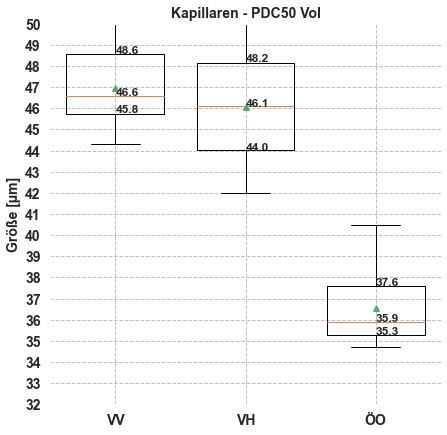

In [15]:
# MAIN
fig, ax = plt.subplots(figsize=(7,7))
ax.grid(color="grey", ls="--", alpha=0.5)
plt.title("Kapillaren - PDC50 Vol", size=14, weight="bold")

data = [list(PDC50_VV), list(PDC50_VH), list(PDC50_OeO)]
ticks = list(np.arange(1, len(data)+1))
xlabels = ["VV", "VH", "ÖO"]

# PLOT DATA
plt.boxplot(data, showfliers=False, showmeans=True, widths=0.75)

# AXIS HANDLING
plt.xticks(ticks, xlabels, size=14, weight="bold")
plt.ylim([PDC50_OeO_Q1-1, PDC50_VV_Q3+1])
plt.yticks((np.arange(int(PDC50_OeO_Q1)-3, int(PDC50_VV_Q3)+3, 1)), size=14, weight="bold")
plt.ylabel("Größe [µm]", size=14, weight="bold")

# ANNOTATIONS
plt.annotate(str(PDC50_VV_Q1), (1, PDC50_VV_Q1), size=12, weight="bold")
plt.annotate(str(PDC50_VV_Q3), (1, PDC50_VV_Q3), size=12, weight="bold")
plt.annotate(str(PDC50_VV_Median), (1, PDC50_VV_Median), size=12, weight="bold")
plt.annotate(str(PDC50_VH_Q1), (2, PDC50_VH_Q1), size=12, weight="bold")
plt.annotate(str(PDC50_VH_Q3), (2, PDC50_VH_Q3), size=12, weight="bold")
plt.annotate(str(PDC50_VH_Median), (2, PDC50_VH_Median), size=12, weight="bold")
plt.annotate(str(PDC50_OeO_Q1), (3, PDC50_OeO_Q1), size=12, weight="bold")
plt.annotate(str(PDC50_OeO_Q3), (3, PDC50_OeO_Q3), size=12, weight="bold")
plt.annotate(str(PDC50_OeO_Median), (3, PDC50_OeO_Median), size=12, weight="bold")

plt.show()

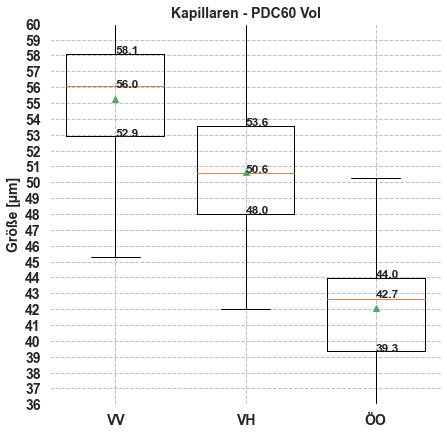

In [16]:
# MAIN
fig, ax = plt.subplots(figsize=(7,7))
ax.grid(color="grey", ls="--", alpha=0.5)
plt.title("Kapillaren - PDC60 Vol", size=14, weight="bold")

data = [list(PDC60_VV), list(PDC60_VH), list(PDC60_OeO)]
ticks = list(np.arange(1, len(data)+1))
xlabels = ["VV", "VH", "ÖO"]

# PLOT DATA
plt.boxplot(data, showfliers=False, showmeans=True, widths=0.75)

# AXIS HANDLING
plt.xticks(ticks, xlabels, size=14, weight="bold")
plt.ylim([PDC60_OeO_Q1-1, PDC60_VV_Q3+1])
plt.yticks((np.arange(int(PDC60_OeO_Q1)-3, int(PDC60_VV_Q3)+3, 1)), size=14, weight="bold")
plt.ylabel("Größe [µm]", size=14, weight="bold")

# ANNOTATIONS
plt.annotate(str(PDC60_VV_Q1), (1, PDC60_VV_Q1), size=12, weight="bold")
plt.annotate(str(PDC60_VV_Q3), (1, PDC60_VV_Q3), size=12, weight="bold")
plt.annotate(str(PDC60_VV_Median), (1, PDC60_VV_Median), size=12, weight="bold")
plt.annotate(str(PDC60_VH_Q1), (2, PDC60_VH_Q1), size=12, weight="bold")
plt.annotate(str(PDC60_VH_Q3), (2, PDC60_VH_Q3), size=12, weight="bold")
plt.annotate(str(PDC60_VH_Median), (2, PDC60_VH_Median), size=12, weight="bold")
plt.annotate(str(PDC60_OeO_Q1), (3, PDC60_OeO_Q1), size=12, weight="bold")
plt.annotate(str(PDC60_OeO_Q3), (3, PDC60_OeO_Q3), size=12, weight="bold")
plt.annotate(str(PDC60_OeO_Median), (3, PDC60_OeO_Median), size=12, weight="bold")

plt.show()

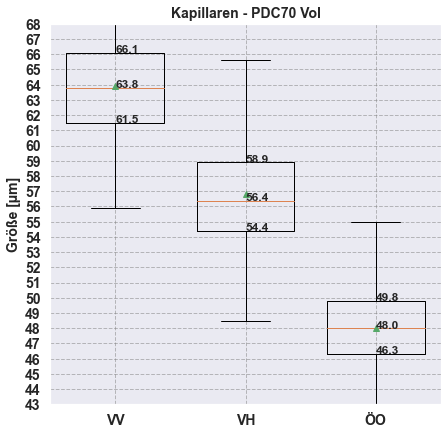

In [169]:
# MAIN
fig, ax = plt.subplots(figsize=(7,7))
ax.grid(color="grey", ls="--", alpha=0.5)
plt.title("Kapillaren - PDC70 Vol", size=14, weight="bold")

data = [list(PDC70_VV), list(PDC70_VH), list(PDC70_OeO)]
ticks = list(np.arange(1, len(data)+1))
xlabels = ["VV", "VH", "ÖO"]

# PLOT DATA
plt.boxplot(data, showfliers=False, showmeans=True, widths=0.75)

# AXIS HANDLING
plt.xticks(ticks, xlabels, size=14, weight="bold")
plt.ylim([PDC70_OeO_Q1-1, PDC70_VV_Q3+1])
plt.yticks((np.arange(int(PDC70_OeO_Q1)-3, int(PDC70_VV_Q3)+3, 1)), size=14, weight="bold")
plt.ylabel("Größe [µm]", size=14, weight="bold")

# ANNOTATIONS
plt.annotate(str(PDC70_VV_Q1), (1, PDC70_VV_Q1), size=12, weight="bold")
plt.annotate(str(PDC70_VV_Q3), (1, PDC70_VV_Q3), size=12, weight="bold")
plt.annotate(str(PDC70_VV_Median), (1, PDC70_VV_Median), size=12, weight="bold")
plt.annotate(str(PDC70_VH_Q1), (2, PDC70_VH_Q1), size=12, weight="bold")
plt.annotate(str(PDC70_VH_Q3), (2, PDC70_VH_Q3), size=12, weight="bold")
plt.annotate(str(PDC70_VH_Median), (2, PDC70_VH_Median), size=12, weight="bold")
plt.annotate(str(PDC70_OeO_Q1), (3, PDC70_OeO_Q1), size=12, weight="bold")
plt.annotate(str(PDC70_OeO_Q3), (3, PDC70_OeO_Q3), size=12, weight="bold")
plt.annotate(str(PDC70_OeO_Median), (3, PDC70_OeO_Median), size=12, weight="bold")

plt.show()

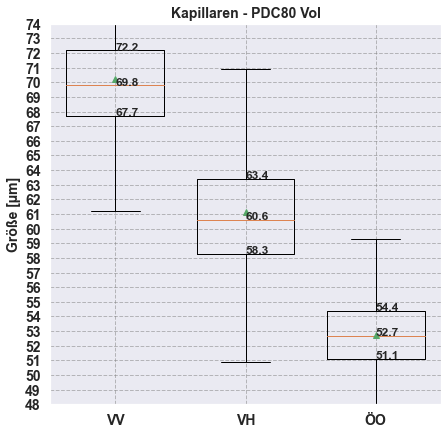

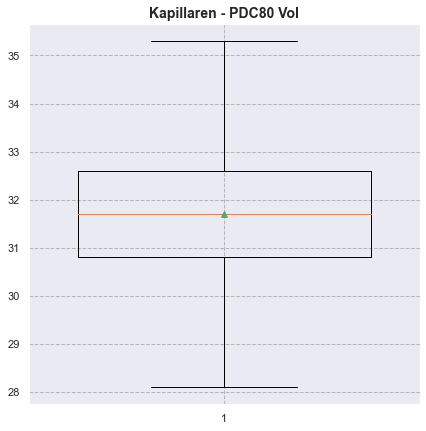

In [184]:
# MAIN
fig, ax = plt.subplots(figsize=(7,7))
ax.grid(color="grey", ls="--", alpha=0.5)
plt.title("Kapillaren - PDC80 Vol", size=14, weight="bold")

data = [list(PDC80_VV), list(PDC80_VH), list(PDC80_OeO)]
ticks = list(np.arange(1, len(data)+1))
xlabels = ["VV", "VH", "ÖO"]

# PLOT DATA
plt.boxplot(data, showfliers=False, showmeans=True, widths=0.75)

# AXIS HANDLING
plt.xticks(ticks, xlabels, size=14, weight="bold")
plt.ylim([PDC80_OeO_Q1-1, PDC80_VV_Q3+1])
plt.yticks((np.arange(int(PDC80_OeO_Q1)-3, int(PDC80_VV_Q3)+3, 1)), size=14, weight="bold")
plt.ylabel("Größe [µm]", size=14, weight="bold")

# ANNOTATIONS
plt.annotate(str(PDC80_VV_Q1), (1, PDC80_VV_Q1), size=12, weight="bold")
plt.annotate(str(PDC80_VV_Q3), (1, PDC80_VV_Q3), size=12, weight="bold")
plt.annotate(str(PDC80_VV_Median), (1, PDC80_VV_Median), size=12, weight="bold")
plt.annotate(str(PDC80_VH_Q1), (2, PDC80_VH_Q1), size=12, weight="bold")
plt.annotate(str(PDC80_VH_Q3), (2, PDC80_VH_Q3), size=12, weight="bold")
plt.annotate(str(PDC80_VH_Median), (2, PDC80_VH_Median), size=12, weight="bold")
plt.annotate(str(PDC80_OeO_Q1), (3, PDC80_OeO_Q1), size=12, weight="bold")
plt.annotate(str(PDC80_OeO_Q3), (3, PDC80_OeO_Q3), size=12, weight="bold")
plt.annotate(str(PDC80_OeO_Median), (3, PDC80_OeO_Median), size=12, weight="bold")

plt.show()

#######################

# MAIN
fig, ax = plt.subplots(figsize=(7,7))
ax.grid(color="grey", ls="--", alpha=0.5)
plt.title("Kapillaren - PDC80 Vol", size=14, weight="bold")

data = [list(PDC80_PF)]
ticks = list(np.arange(1, len(data)+1))
xlabels = ["PF"]

# PLOT DATA
plt.boxplot(data, showfliers=False, showmeans=True, widths=0.75)

# AXIS HANDLING
#plt.xticks(ticks, xlabels, size=14, weight="bold")
#plt.ylim([PDC80_OeO_Q1-1, PDC80_VV_Q3+1])
#plt.yticks((np.arange(int(PDC80_OeO_Q1)-3, int(PDC80_VV_Q3)+3, 1)), size=14, weight="bold")
#plt.ylabel("Parabolfaktor", size=14, weight="bold")

# ANNOTATIONS
#plt.annotate(str(PDC80_VV_Q1), (1, PDC80_VV_Q1), size=12, weight="bold")
#plt.annotate(str(PDC80_VV_Q3), (1, PDC80_VV_Q3), size=12, weight="bold")
#plt.annotate(str(PDC80_VV_Median), (1, PDC80_VV_Median), size=12, weight="bold")

plt.show()


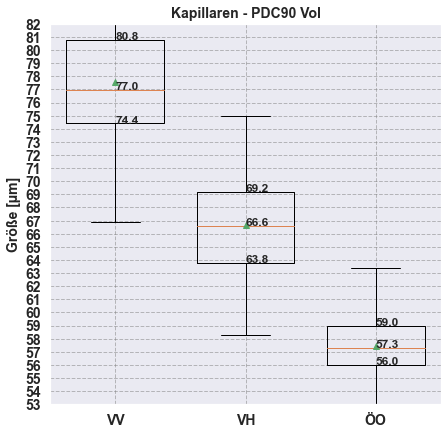

In [170]:
# MAIN
fig, ax = plt.subplots(figsize=(7,7))
ax.grid(color="grey", ls="--", alpha=0.5)
plt.title("Kapillaren - PDC90 Vol", size=14, weight="bold")

data = [list(PDC90_VV), list(PDC90_VH), list(PDC90_OeO)]
ticks = list(np.arange(1, len(data)+1))
xlabels = ["VV", "VH", "ÖO"]

# PLOT DATA
plt.boxplot(data, showfliers=False, showmeans=True, widths=0.75)

# AXIS HANDLING
plt.xticks(ticks, xlabels, size=14, weight="bold")
plt.ylim([PDC90_OeO_Q1-1, PDC90_VV_Q3+1])
plt.yticks((np.arange(int(PDC90_OeO_Q1)-3, int(PDC90_VV_Q3)+3, 1)), size=14, weight="bold")
plt.ylabel("Größe [µm]", size=14, weight="bold")

# ANNOTATIONS
plt.annotate(str(PDC90_VV_Q1), (1, PDC90_VV_Q1), size=12, weight="bold")
plt.annotate(str(PDC90_VV_Q3), (1, PDC90_VV_Q3), size=12, weight="bold")
plt.annotate(str(PDC90_VV_Median), (1, PDC90_VV_Median), size=12, weight="bold")
plt.annotate(str(PDC90_VH_Q1), (2, PDC90_VH_Q1), size=12, weight="bold")
plt.annotate(str(PDC90_VH_Q3), (2, PDC90_VH_Q3), size=12, weight="bold")
plt.annotate(str(PDC90_VH_Median), (2, PDC90_VH_Median), size=12, weight="bold")
plt.annotate(str(PDC90_OeO_Q1), (3, PDC90_OeO_Q1), size=12, weight="bold")
plt.annotate(str(PDC90_OeO_Q3), (3, PDC90_OeO_Q3), size=12, weight="bold")
plt.annotate(str(PDC90_OeO_Median), (3, PDC90_OeO_Median), size=12, weight="bold")

plt.show()

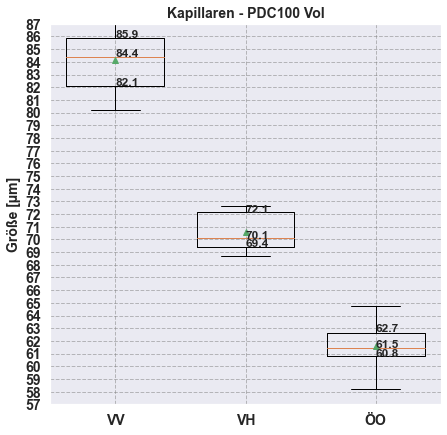

In [171]:
# MAIN
fig, ax = plt.subplots(figsize=(7,7))
ax.grid(color="grey", ls="--", alpha=0.5)
plt.title("Kapillaren - PDC100 Vol", size=14, weight="bold")

data = [list(PDC100_VV), list(PDC100_VH), list(PDC100_OeO)]
ticks = list(np.arange(1, len(data)+1))
xlabels = ["VV", "VH", "ÖO"]

# PLOT DATA
plt.boxplot(data, showfliers=False, showmeans=True, widths=0.75)

# AXIS HANDLING
plt.xticks(ticks, xlabels, size=14, weight="bold")
plt.ylim([PDC100_OeO_Q1-1, PDC100_VV_Q3+1])
plt.yticks((np.arange(int(PDC100_OeO_Q1)-3, int(PDC100_VV_Q3)+3, 1)), size=14, weight="bold")
plt.ylabel("Größe [µm]", size=14, weight="bold")

# ANNOTATIONS
plt.annotate(str(PDC100_VV_Q1), (1, PDC100_VV_Q1), size=12, weight="bold")
plt.annotate(str(PDC100_VV_Q3), (1, PDC100_VV_Q3), size=12, weight="bold")
plt.annotate(str(PDC100_VV_Median), (1, PDC100_VV_Median), size=12, weight="bold")
plt.annotate(str(PDC100_VH_Q1), (2, PDC100_VH_Q1), size=12, weight="bold")
plt.annotate(str(PDC100_VH_Q3), (2, PDC100_VH_Q3), size=12, weight="bold")
plt.annotate(str(PDC100_VH_Median), (2, PDC100_VH_Median), size=12, weight="bold")
plt.annotate(str(PDC100_OeO_Q1), (3, PDC100_OeO_Q1), size=12, weight="bold")
plt.annotate(str(PDC100_OeO_Q3), (3, PDC100_OeO_Q3), size=12, weight="bold")
plt.annotate(str(PDC100_OeO_Median), (3, PDC100_OeO_Median), size=12, weight="bold")

plt.show()

In [13]:
ET_to_EK_Median = []
ET_to_EK_Mean = []
for vol in range(len(df_DB_trunc_select_cut)):
    ET_to_EK_Median.append(np.median([df_DB_trunc_select_cut.iloc[vol,:]["ET1_Volumen"],
                                      df_DB_trunc_select_cut.iloc[vol,:]["FT1_Volumen"],
                                      df_DB_trunc_select_cut.iloc[vol,:]["EK_Volumen"]]))
    ET_to_EK_Mean.append(np.around(np.mean([df_DB_trunc_select_cut.iloc[vol,:]["ET1_Volumen"],
                                      df_DB_trunc_select_cut.iloc[vol,:]["FT1_Volumen"],
                                      df_DB_trunc_select_cut.iloc[vol,:]["EK_Volumen"]]),0))
    
df_DB_trunc_select_cut["Last_Mean_Vol"] = ET_to_EK_Mean

BQC_LastMean_Vol_Diff = []
BQC_LastMean_Vol_Diff_Perc = []
for vol in range(len(df_DB_trunc_select_cut)):
    BQC_Vol = df_DB_trunc_select_cut.iloc[vol,:]["BQC_Volumen"]
    LastMean_Vol = df_DB_trunc_select_cut.iloc[vol,:]["Last_Mean_Vol"]
    Diff_Vol = np.abs(BQC_Vol - LastMean_Vol)
    BQC_LastMean_Vol_Diff.append(Diff_Vol)
    Diff_Perc = np.around(((BQC_Vol - LastMean_Vol) / LastMean_Vol) * 100, 1)
    BQC_LastMean_Vol_Diff_Perc.append(Diff_Perc)
        
BQC_LastMean_Vol_Diff_noNaN = [x for x in BQC_LastMean_Vol_Diff if ~np.isnan(x)]

plt.figure(figsize=(10,7))
plt.hist(BQC_LastMean_Vol_Diff_noNaN, bins=30)

plt.show()

NameError: name 'df_DB_trunc_select_cut' is not defined

In [6]:
df_DB_trunc

,PDC_Nummer,Charge,FH_Status,Produktion_Groesse,Familie,Art,Kommentar_Produktion,Grenzwert-Set,Defekt_Arbeitsschritt_ID,Defekt_Grund_ID,...,Schleifen_Month,NS2_Month,OeO_Month,K1_Month,K2_Month,Ass_Month,BQC_Month,ET_Month,FT_Month,EK_Month
0,114824,5633,nonFH,1,PDC,1,NaN,1,3.00,7.00,...,2020-12,2020-12,2020-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,114823,5633,nonFH,1,PDC,1,NaN,1,3.00,7.00,...,2020-12,2020-12,2020-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,114822,5633,nonFH,1,PDC,1,NaN,1,4.00,2.00,...,2020-12,2020-12,2020-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,114821,5633,nonFH,1,PDC,1,NaN,1,3.00,7.00,...,2020-12,2020-12,2020-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,114820,5633,nonFH,1,PDC,1,NaN,1,5.00,31.00,...,2020-12,2020-12,2020-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38960,68004,3292,nonFH,5,PDC,1,"PF:32,8//L:5,8",1,1.00,1.00,...,2019-06,2019-06,2019-06,2019-06,2019-06,2019-06,2019-06,2019-06,2019-07,2019-07
38961,68003,3292,nonFH,1,PDC,1,"PF:32,8//L:5,8",1,3.00,6.00,...,2019-06,2019-06,2019-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38962,68002,3292,nonFH,5,PDC,1,"PF:32,8//L:5,8",1,19.00,5.00,...,2019-06,2019-06,2019-06,2019-06,2019-06,2019-06,2019-06,2019-07,2019-07,NaN
38963,68001,3292,nonFH,1,PDC,1,"PF:32,8//L:5,8",1,4.00,2.00,...,2019-06,2019-06,2019-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
Cut2020 = df_DB_trunc[pd.DataFrame(df_DB_trunc["Schmelzen_Month"].tolist()).isin(LastNMonths).any(1)].reset_index(drop=True)
Count_Kaps_2020 = len(Cut2020)

In [16]:
Cut_Grinded_Nozzles_2020 = len(Cut2020[Cut2020["Defekt_Arbeitsschritt_ID"]>=5])
Cut_Grinded_Nozzles_2020

13748

In [14]:
Cut_Built_Nozzles_2020 = len(Cut2020[Cut2020["Kleben2_Datum"].notnull()])
Cut_Built_Nozzles_2020

6751